# Import Libraries

In [1]:
##############
# Dependencies
##############
import os
import numpy as np
import pandas as pd
import datetime

##################
# Visualizations
#################
import matplotlib.pyplot as plt
from matplotlib import rc,rcParams
import seaborn as sns

##################
# Data Science
#################
import calendar
import pylab 
import statsmodels.api as sm
import scipy.stats as stat
from statsmodels.tsa.stattools import acf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error

##################
# Display Changes
##################
os.environ['TZ'] = 'Asia/Calcutta'
%matplotlib inline
rc('axes', linewidth=2)
rc('font', weight='bold')
sns.set_style('whitegrid')
pd.set_option('max_rows',2000)
pd.set_option('max_columns',255)
rcParams['figure.figsize'] = 24,8
pd.options.mode.chained_assignment = None
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

# Import Data

## Load Data

In [2]:
load = pd.read_parquet('./data/historical_load_data.parquet')
print(load.shape)
load.head()

(394368, 4)


,datetime,date,load,tb
0,2011-04-01 00:00:00,2011-04-01,945.592,1
1,2011-04-01 00:15:00,2011-04-01,928.644,2
2,2011-04-01 00:30:00,2011-04-01,912.076,3
3,2011-04-01 00:45:00,2011-04-01,895.105,4
4,2011-04-01 01:00:00,2011-04-01,879.988,5


In [3]:
load.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 394368 entries, 0 to 394367
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   datetime  394368 non-null  datetime64[ns]
 1   date      394368 non-null  object        
 2   load      394368 non-null  float64       
 3   tb        394368 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 15.0+ MB


In [4]:
load['datetime'] = pd.to_datetime(load['datetime'])
load['date'] = load['datetime'].dt.date
print(load.date.min())
print(load.date.max())
load.info()

2011-04-01
2022-06-30
<class 'pandas.core.frame.DataFrame'>
Int64Index: 394368 entries, 0 to 394367
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   datetime  394368 non-null  datetime64[ns]
 1   date      394368 non-null  object        
 2   load      394368 non-null  float64       
 3   tb        394368 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 15.0+ MB


In [5]:
load.isnull().sum()

datetime    0
date        0
load        0
tb          0
dtype: int64

## Weather Data

In [6]:
weather = pd.read_parquet('./data/weather_data.parquet')
print(weather.shape)
weather.head()

(403872, 7)


,datetime,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover
0,2011-01-01 00:00:00,8.4400,9.6800,0.9500,8.950,2.5100,0.3000
1,2011-01-01 00:15:00,8.2575,9.4825,0.9625,8.935,2.4425,0.3025
2,2011-01-01 00:30:00,8.0750,9.2850,0.9750,8.920,2.3750,0.3050
3,2011-01-01 00:45:00,7.8925,9.0875,0.9875,8.905,2.3075,0.3075
4,2011-01-01 01:00:00,7.7100,8.8900,1.0000,8.890,2.2400,0.3100


In [7]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403872 entries, 0 to 403871
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   datetime              403872 non-null  datetime64[ns]
 1   apparent_temperature  403872 non-null  float64       
 2   temperature           403872 non-null  float64       
 3   humidity              403872 non-null  float64       
 4   dew_point             403872 non-null  float64       
 5   wind_speed            403872 non-null  float64       
 6   cloud_cover           403872 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 21.6 MB


In [8]:
weather['datetime'] = pd.to_datetime(weather['datetime'])
print(weather.datetime.min())
print(weather.datetime.max())
weather.info()

2011-01-01 00:00:00
2022-07-05 23:45:00
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 403872 entries, 0 to 403871
Data columns (total 7 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   datetime              403872 non-null  datetime64[ns]
 1   apparent_temperature  403872 non-null  float64       
 2   temperature           403872 non-null  float64       
 3   humidity              403872 non-null  float64       
 4   dew_point             403872 non-null  float64       
 5   wind_speed            403872 non-null  float64       
 6   cloud_cover           403872 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 21.6 MB


In [9]:
weather.isnull().sum()

datetime                0
apparent_temperature    0
temperature             0
humidity                0
dew_point               0
wind_speed              0
cloud_cover             0
dtype: int64

In [10]:
df = pd.merge(load,weather,'outer','datetime')
df.sort_values('datetime',inplace=True)
print(df.shape)
display(df.head())
display(df.tail())

(403872, 10)


,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover
394368,2011-01-01 00:00:00,NaN,NaN,NaN,8.4400,9.6800,0.9500,8.950,2.5100,0.3000
394369,2011-01-01 00:15:00,NaN,NaN,NaN,8.2575,9.4825,0.9625,8.935,2.4425,0.3025
394370,2011-01-01 00:30:00,NaN,NaN,NaN,8.0750,9.2850,0.9750,8.920,2.3750,0.3050
394371,2011-01-01 00:45:00,NaN,NaN,NaN,7.8925,9.0875,0.9875,8.905,2.3075,0.3075
394372,2011-01-01 01:00:00,NaN,NaN,NaN,7.7100,8.8900,1.0000,8.890,2.2400,0.3100


,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover
403867,2022-07-05 22:45:00,NaN,NaN,NaN,42.3275,34.495,0.57,24.79,4.09,0.775
403868,2022-07-05 23:00:00,NaN,NaN,NaN,42.1700,34.280,0.58,24.88,4.21,0.780
403869,2022-07-05 23:15:00,NaN,NaN,NaN,40.2500,32.250,0.66,25.00,3.00,0.570
403870,2022-07-05 23:30:00,NaN,NaN,NaN,40.0000,32.000,0.66,25.00,3.00,0.560
403871,2022-07-05 23:45:00,NaN,NaN,NaN,40.0000,32.000,0.67,25.00,3.00,0.590


## Holidays

In [11]:
holiday = pd.read_csv("./data/holidays.csv")
print(holiday.shape)
holiday.head()

(11, 22)


,Republic Day,Milad un-Nabi/Id-e-Milad,Holi,Rama Navami,Mahavir Jayanti,Good Friday,Buddha Purnima/Vesak,Independence Day,Janmashtami,Ramzan Id/Eid-ul-Fitar,Mahatma Gandhi Jayanti,Dussehra (Maha Navami),Diwali/Deepavali,Guru Nanak Jayanti,Muharram/Ashura,Christmas,Chhat Puja (Pratihar Sashthi/Surya Sashthi),Bank Holiday,Maha Shivratri,Children's Day,Maharishi Valmiki,Idul Juha
0,1/26/2011,2/16/2011,3/20/2011,4/12/2011,4/16/2011,4/22/2011,5/17/2011,8/15/2011,8/22/2011,9/1/2011,10/2/2011,10/6/2011,10/26/2011,11/10/2011,12/6/2011,12/25/2011,11/1/2011,4/1/2011,3/2/2011,11/14/2011,10/11/2011,11/6/2011
1,1/26/2012,2/5/2012,3/8/2012,4/1/2012,4/5/2012,4/6/2012,5/6/2012,8/15/2012,8/10/2012,8/20/2012,10/2/2012,10/24/2012,11/13/2012,11/28/2012,11/25/2012,12/25/2012,11/19/2012,4/1/2012,2/20/2012,11/14/2012,10/29/2012,10/26/2012
2,1/26/2013,1/25/2013,3/27/2013,4/19/2013,4/24/2013,3/29/2013,5/25/2013,8/15/2013,8/28/2013,8/9/2013,10/2/2013,10/13/2013,11/3/2013,11/17/2013,11/14/2013,12/25/2013,11/8/2013,4/1/2013,3/10/2013,11/14/2013,10/18/2013,10/15/2013
3,1/26/2014,1/14/2014,3/16/2014,4/8/2014,4/13/2014,4/18/2014,5/14/2014,8/15/2014,8/17/2014,7/29/2014,10/2/2014,10/3/2014,10/23/2014,11/6/2014,11/4/2014,12/25/2014,10/29/2014,4/1/2014,2/27/2014,11/14/2014,10/8/2014,10/6/2014
4,1/26/2015,1/4/2015,3/17/2014,3/28/2015,4/2/2015,4/3/2015,5/4/2015,8/15/2015,9/5/2015,7/19/2015,10/2/2015,10/22/2015,11/11/2015,11/25/2015,10/24/2015,12/25/2015,11/17/2015,4/1/2015,2/17/2015,11/14/2015,10/27/2015,9/25/2015


In [12]:
holiday = pd.melt(holiday,var_name='holiday_name',value_name='holiday_date')
holiday['date'] = pd.to_datetime(holiday.holiday_date).dt.date
print(holiday.shape)
holiday.head()

(242, 3)


,holiday_name,holiday_date,date
0,Republic Day,1/26/2011,2011-01-26
1,Republic Day,1/26/2012,2012-01-26
2,Republic Day,1/26/2013,2013-01-26
3,Republic Day,1/26/2014,2014-01-26
4,Republic Day,1/26/2015,2015-01-26


In [18]:
holiday[holiday.duplicated()]

,holiday_name,holiday_date,date


In [19]:
print(holiday.date.min())
print(holiday.date.max())
holiday.info()

2011-01-26
2021-12-25
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   holiday_name  242 non-null    object
 1   holiday_date  242 non-null    object
 2   date          242 non-null    object
dtypes: object(3)
memory usage: 5.8+ KB


In [20]:
df['holiday'] = df.date.isin(holiday.date)
print(df.holiday.value_counts())
df.head()

False    381504
True      22368
Name: holiday, dtype: int64


,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday
394368,2011-01-01 00:00:00,NaN,NaN,NaN,8.4400,9.6800,0.9500,8.950,2.5100,0.3000,False
394369,2011-01-01 00:15:00,NaN,NaN,NaN,8.2575,9.4825,0.9625,8.935,2.4425,0.3025,False
394370,2011-01-01 00:30:00,NaN,NaN,NaN,8.0750,9.2850,0.9750,8.920,2.3750,0.3050,False
394371,2011-01-01 00:45:00,NaN,NaN,NaN,7.8925,9.0875,0.9875,8.905,2.3075,0.3075,False
394372,2011-01-01 01:00:00,NaN,NaN,NaN,7.7100,8.8900,1.0000,8.890,2.2400,0.3100,False


In [21]:
df['load'] = np.where(df.holiday==True,np.nan,df.load)
df['load'].isnull().sum()

31872

In [22]:
start_date = datetime.datetime.strftime(load.datetime.min(),'%Y-%m-%d') # Data start date according to the load data
end_date = datetime.datetime.strftime(df.datetime.max(),'%Y-%m-%d') # Data end date according to the weather data
z = pd.DataFrame(pd.date_range(start=start_date, end=end_date, freq='15min'), columns=['datetime'])
data = pd.merge(df, z, on='datetime', how='right')
print(f"Total data missing: {data.isna().sum()}")

Total data missing: datetime                    0
date                      769
load                    23137
tb                        769
apparent_temperature        0
temperature                 0
humidity                    0
dew_point                   0
wind_speed                  0
cloud_cover                 0
holiday                     0
dtype: int64


# EDA

In [23]:
# Adding time related features
data['date'] = data.datetime.dt.date       # Fixing Missing Dates
data['hour'] = data.datetime.dt.hour + 1   # Categorical 24
data['dom' ] = data.datetime.dt.day        # Categorical 30/31
data['month'] = data.datetime.dt.month     # Categorical 12
data['year'] = data.datetime.dt.year       # Categorical 12
data['dow' ] = data.datetime.dt.dayofweek  # Categorical 7
data['doy' ] = data.datetime.dt.dayofyear  # Categorical 365/366
data['tb'] = data.datetime.apply(lambda x : ((x.hour*60 + x.minute)//15+1)) # Categorical 96
data['weekend'] = np.where(data['dow']>5, 1,0)  # Imbalanced category
data['woy']    = data.datetime.dt.week # Categorical 52
data.head()

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  # This is added back by InteractiveShellApp.init_path()


,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday,hour,dom,month,year,dow,doy,weekend,woy
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,True,1,1,4,2011,4,91,0,13
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,True,1,1,4,2011,4,91,0,13
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,True,1,1,4,2011,4,91,0,13
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,True,1,1,4,2011,4,91,0,13
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,True,2,1,4,2011,4,91,0,13


**Do we remove leap years?**

`
df.drop(df[df.date == pd.to_datetime("2012-02-29").date()].index, inplace=True)
df.drop(df[df.date == pd.to_datetime("2016-02-29").date()].index, inplace=True)
df.drop(df[df.date == pd.to_datetime("2020-02-29").date()].index, inplace=True)
`

## Visualising

### Load

In [24]:
data['load'].describe()

count    372000.000000
mean       1444.964999
std         477.010179
min           0.000000
25%        1118.100000
50%        1410.000000
75%        1774.262500
max        3311.000000
Name: load, dtype: float64

In [25]:
data[data['load'] <400]

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday,hour,dom,month,year,dow,doy,weekend,woy
163837,2015-12-02 15:15:00,2015-12-02,0.0,62,24.395833,24.395833,0.452500,11.634167,2.7900,0.3100,False,16,2,12,2015,2,336,0,49
163838,2015-12-02 15:30:00,2015-12-02,0.0,63,24.161667,24.161667,0.465000,11.798333,2.7400,0.3100,False,16,2,12,2015,2,336,0,49
164791,2015-12-12 13:45:00,2015-12-12,0.0,56,13.727500,13.727500,0.930000,12.597500,3.8500,0.0000,False,14,12,12,2015,5,346,0,50
164792,2015-12-12 14:00:00,2015-12-12,0.0,57,13.540000,13.540000,0.940000,12.580000,4.0100,0.0000,False,15,12,12,2015,5,346,0,50
165834,2015-12-23 10:30:00,2015-12-23,0.0,43,11.415000,11.915000,0.835000,9.040000,2.2900,0.0000,False,11,23,12,2015,2,357,0,52
165835,2015-12-23 10:45:00,2015-12-23,0.0,44,12.652500,12.902500,0.782500,9.075000,2.3150,0.0000,False,11,23,12,2015,2,357,0,52
165836,2015-12-23 11:00:00,2015-12-23,0.0,45,13.890000,13.890000,0.730000,9.110000,2.3400,0.0000,False,12,23,12,2015,2,357,0,52
165837,2015-12-23 11:15:00,2015-12-23,0.0,46,14.397500,14.397500,0.707500,9.125000,2.3450,0.0025,False,12,23,12,2015,2,357,0,52
165838,2015-12-23 11:30:00,2015-12-23,0.0,47,14.905000,14.905000,0.685000,9.140000,2.3500,0.0050,False,12,23,12,2015,2,357,0,52
165839,2015-12-23 11:45:00,2015-12-23,0.0,48,15.412500,15.412500,0.662500,9.155000,2.3550,0.0075,False,12,23,12,2015,2,357,0,52


* Load values less than 400 look like outliers. We will explore this more later.

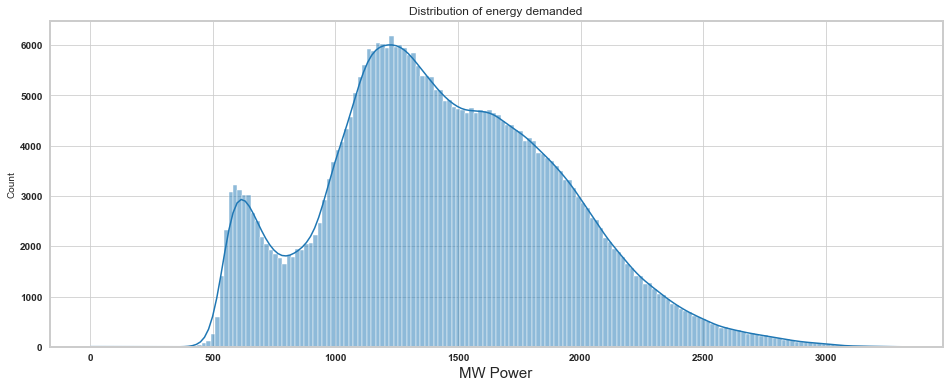

In [26]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.histplot(data['load'].dropna(), ax=ax, kde=True).set_title('load', fontsize=16)
plt.xlabel('MW Power', fontsize=15)
plt.title('Distribution of energy demanded')
plt.show()

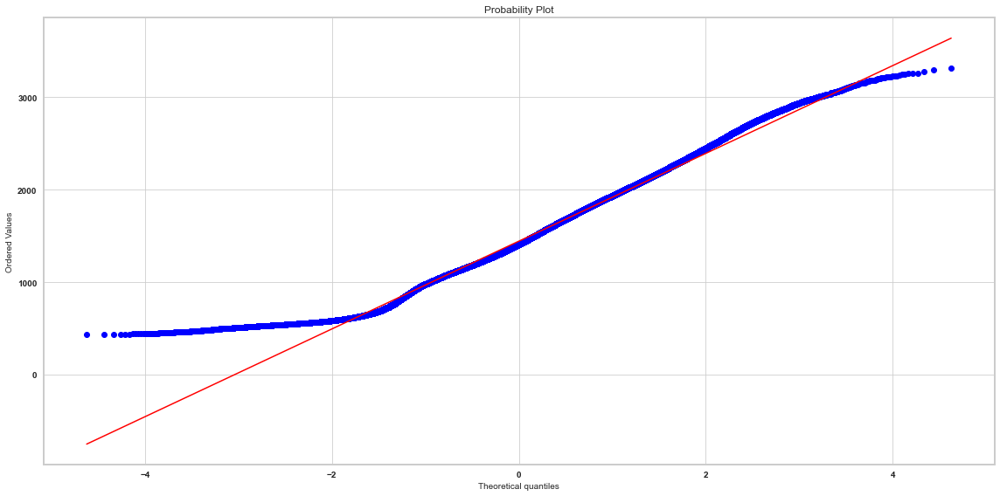

In [27]:
plt.figure(figsize=(16,8))
stat.probplot(data[data['load']> 400]['load'],dist='norm',plot=pylab)
plt.tight_layout()
plt.show()

* The data looks very close to normal distribution.

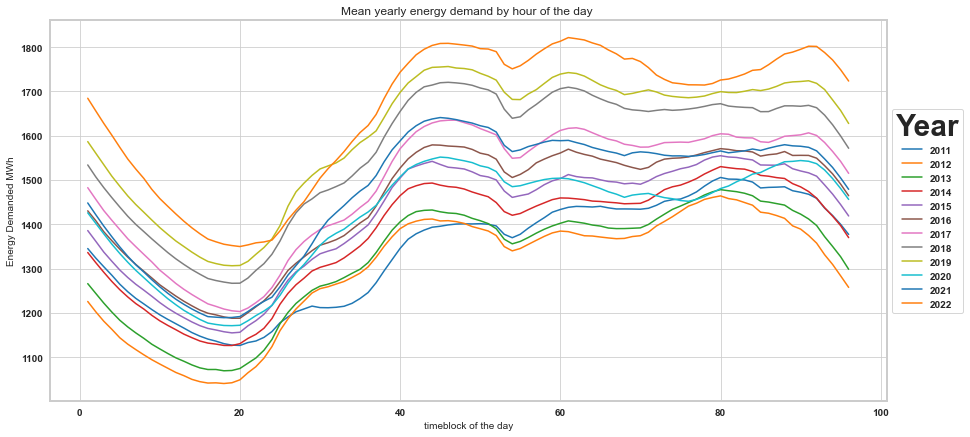

In [28]:
df11 = pd.DataFrame(data.groupby(['year','tb'])['load'].mean()).reset_index().pivot(index='tb',columns='year')
df11.columns = [x[1] for x in df11.columns]
fig, axs = plt.subplots(1,1, figsize=(15,7))
df11.plot(ax=axs)
axs.set_xlabel('timeblock of the day')
axs.set_ylabel('Energy Demanded MWh')
axs.set_title('Mean yearly energy demand by hour of the day ')
axs.legend(title='Year',title_fontsize=30,loc='center left', bbox_to_anchor=(1, 0.5))

* The pattern looks the same across all the years
* There is some annual seasonality in the data

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'load')

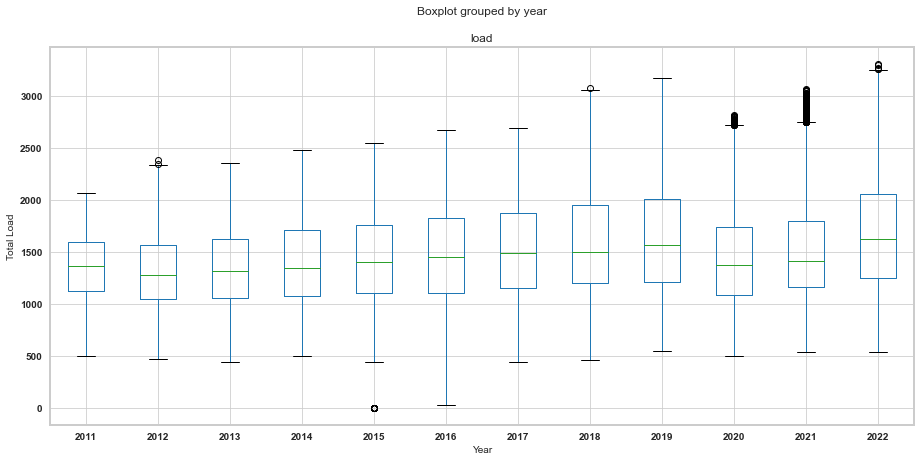

In [29]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='load',by='year',ax=axs)
axs.set_xlabel('Year')
axs.set_ylabel('Total Load')
axs.set_title('load')

* The load is increasing across the years but there is a dip in the overall load consumption in the year 2020 and 2021
* The dip might be because of Covid-19 when lockdowns were imposed all over India.

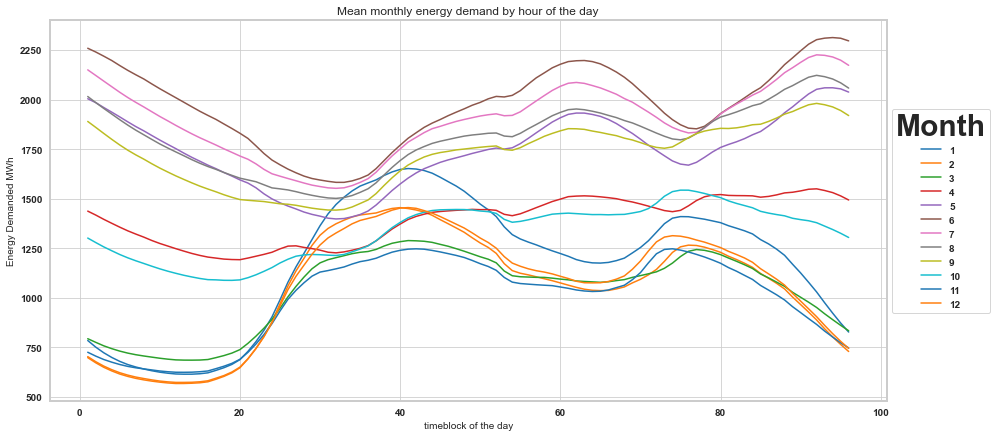

In [30]:
df11 = pd.DataFrame(data.groupby(['month','tb'])['load'].mean()).reset_index().pivot(index='tb',columns='month')
df11.columns = [x[1] for x in df11.columns]
fig, axs = plt.subplots(1,1, figsize=(15,7))
df11.plot(ax=axs)
axs.set_xlabel('timeblock of the day')
axs.set_ylabel('Energy Demanded MWh')
axs.set_title('Mean monthly energy demand by hour of the day')
axs.legend(title='Month',title_fontsize=30,loc='center left', bbox_to_anchor=(1, 0.5))

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'load')

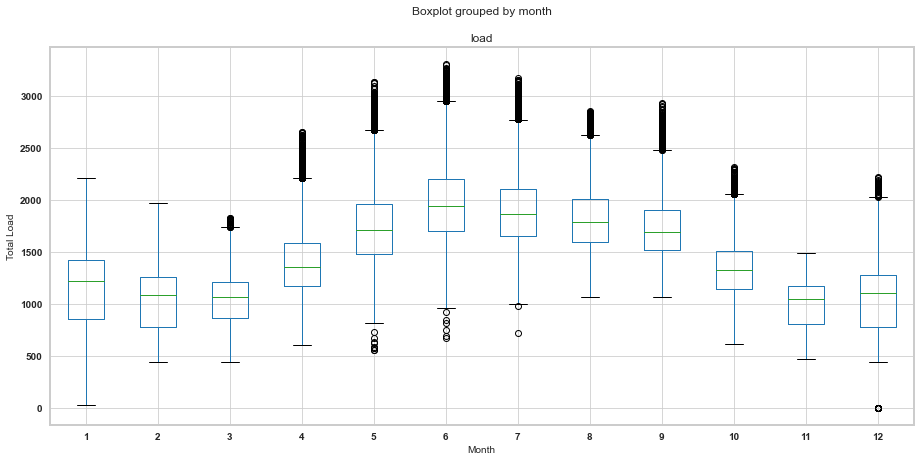

In [31]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='load',by='month',ax=axs)
axs.set_xlabel('Month')
axs.set_ylabel('Total Load')
axs.set_title('load')

* Load is higher for the summer months in comparison to the winter months hence the seasonality in the data.

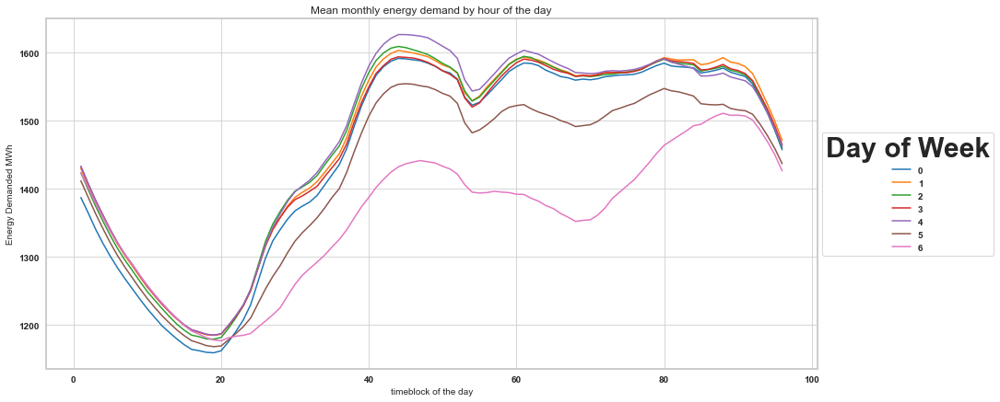

In [32]:
df11 = pd.DataFrame(data.groupby(['dow','tb'])['load'].mean()).reset_index().pivot(index='tb',columns='dow')
df11.columns = [x[1] for x in df11.columns]
fig, axs = plt.subplots(1,1, figsize=(15,7))
df11.plot(ax=axs)
axs.set_xlabel('timeblock of the day')
axs.set_ylabel('Energy Demanded MWh')
axs.set_title('Mean monthly energy demand by hour of the day')
axs.legend(title='Day of Week',title_fontsize=30,loc='center left', bbox_to_anchor=(1, 0.5))

* Looks like load for Monday, Tuesday, Wednesday and Thurday is very similar.
* On Fridays, the load is highest during the day.
* Saturday load is lower than all weekdays.
* Sunday load is much lower than anu other day.
* We can see seasonality in the data again.

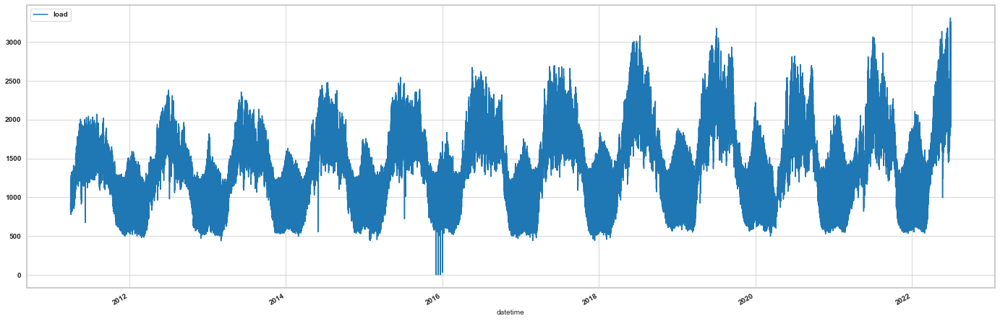

In [33]:
data[['datetime','load']].set_index('datetime').plot()

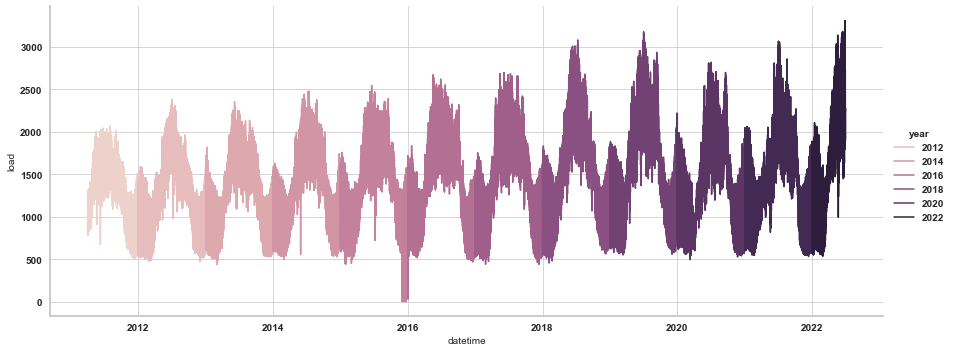

In [34]:
sns.relplot(data=data, kind="line",x=(data.set_index('datetime')).index, y="load",hue="year",aspect=20/8)

* Some outliers can be seen in the data already.
* 2011, 2015 and 2016 have outliers that can be seen from the plot above.

### Weather

apparent_temperature


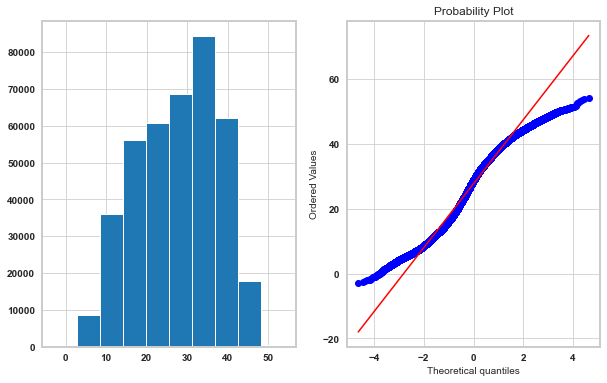




temperature


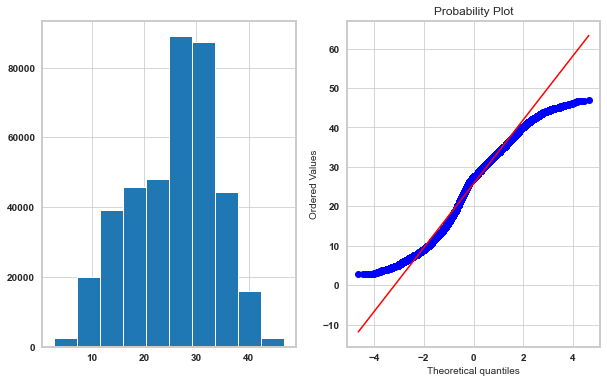




humidity


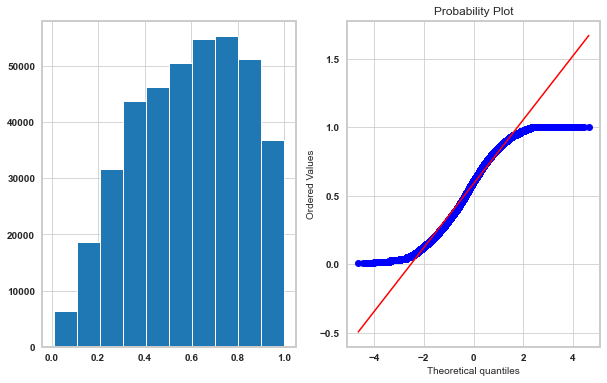




dew_point


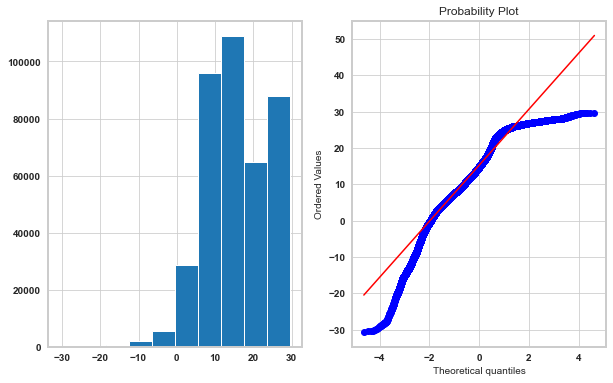




wind_speed


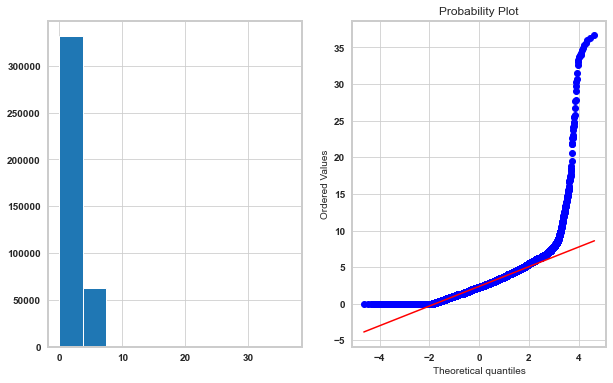




cloud_cover


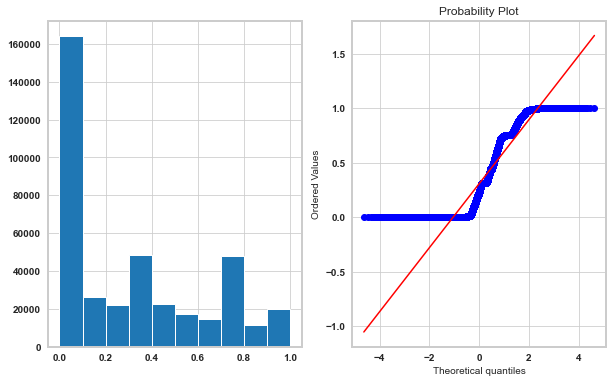

In [35]:
weather_cols = ['apparent_temperature', 'temperature', 'humidity', 'dew_point', 'wind_speed', 'cloud_cover']
for feature in weather_cols:
    print(feature)
    plt.figure(figsize=(10,6))
    plt.subplot(1,2,1)
    data[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(data[feature],dist='norm',plot=pylab)
    plt.show()
    print('\n\n')

* Apparent Temperature, Temperature and HUmidity are close to normal distribution.
* Dew Point is highly right skewed.
* Wind Speed is highly left skewed.
* Cloud Cover has values between 0 and 1 and mostly the values are 0.

In [36]:
def plot_data(df,years,x='apparent_temperature',y='temperature'):
    if years == None:
        gdata = df.set_index('datetime').copy()
    else:
        gdata = df.loc[df.datetime.dt.year == years].set_index('datetime').copy()
    fig, host = plt.subplots(figsize=(15,8))
    par1 = host.twinx()
    par2 = host.twinx()
    
    host.set_xlabel("date")
    host.set_ylabel("load")
    par1.set_ylabel(x)
    par2.set_ylabel(y)
    
    color1 = plt.cm.viridis(0)
    color2 = plt.cm.viridis(0.5)
    color3 = plt.cm.viridis(.9)

    p1, = host.plot(gdata['load'], color=color1, label="load")
    p2, = par1.plot(gdata[x], color=color2, label=x)
    p3, = par2.plot(gdata[y], color=color3, label=y)
    
    lns = [p1, p2, p3]
    host.legend(handles=lns, loc='best')

    # right, left, top, bottom
    par2.spines['right'].set_position(('outward', 60))
    # no x-ticks                 
    par2.xaxis.set_ticks([])
    host.yaxis.label.set_color(p1.get_color())
    par1.yaxis.label.set_color(p2.get_color())
    par2.yaxis.label.set_color(p3.get_color())
    
    # Adjust spacings w.r.t. figsize
    fig.tight_layout()

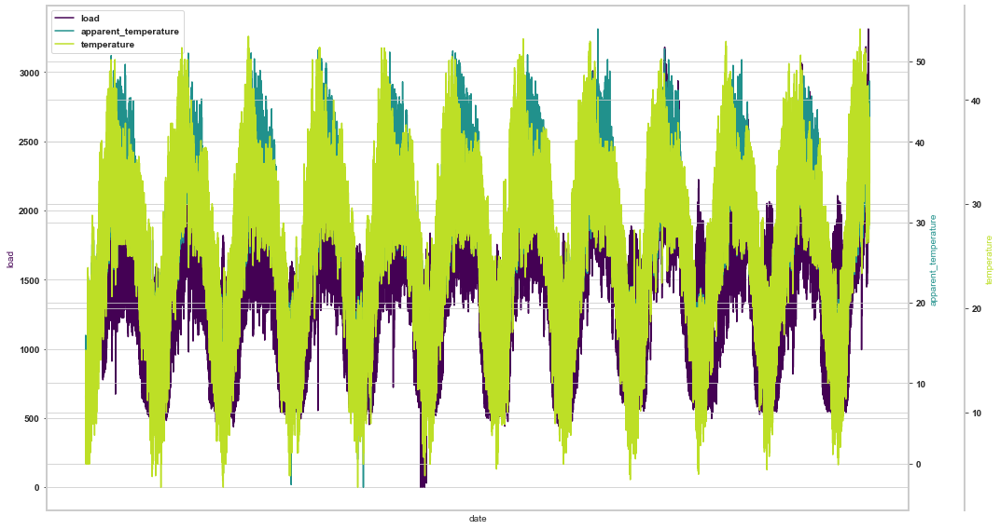

In [37]:
plot_data(df,years=None,x='apparent_temperature',y='temperature')

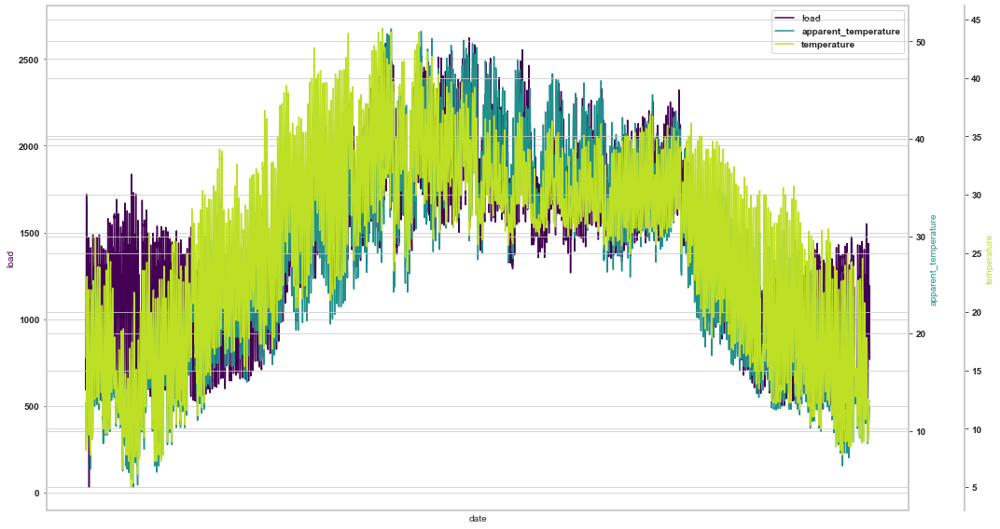

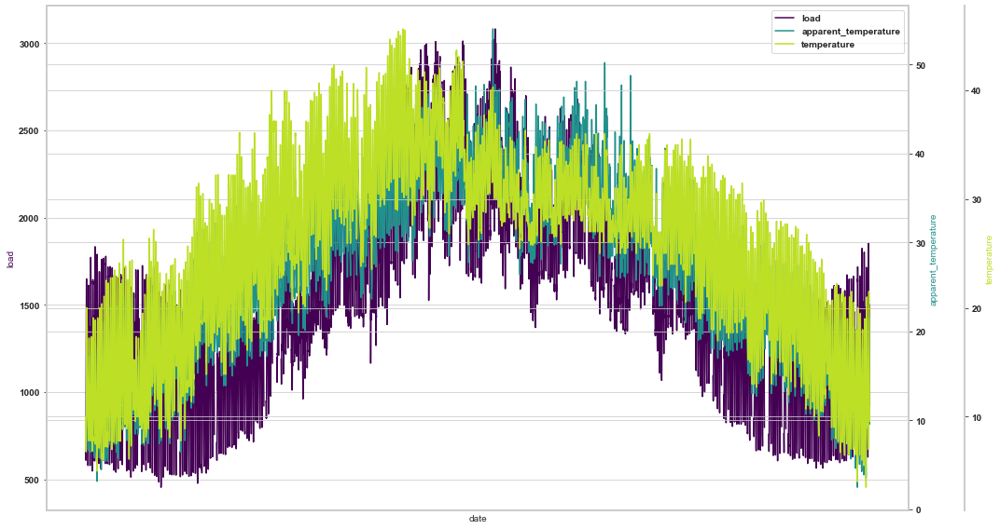

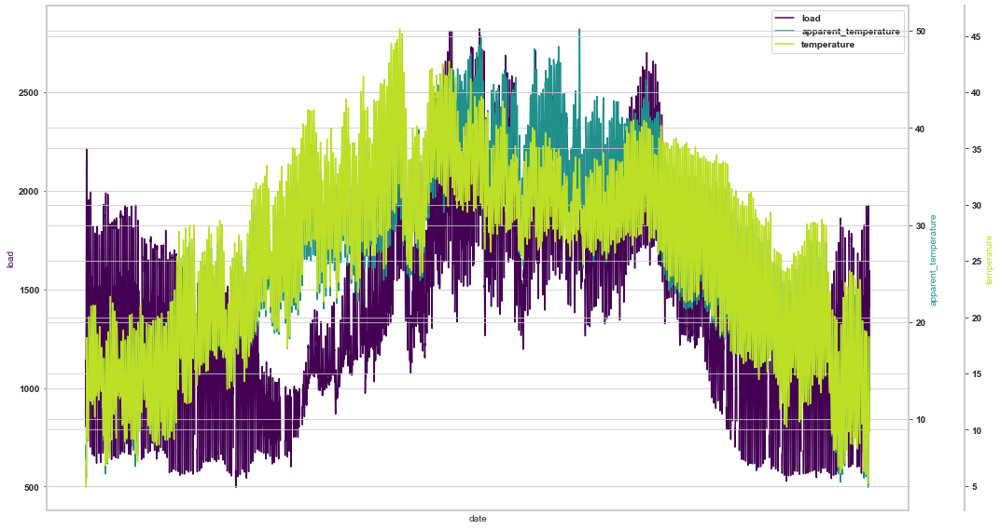

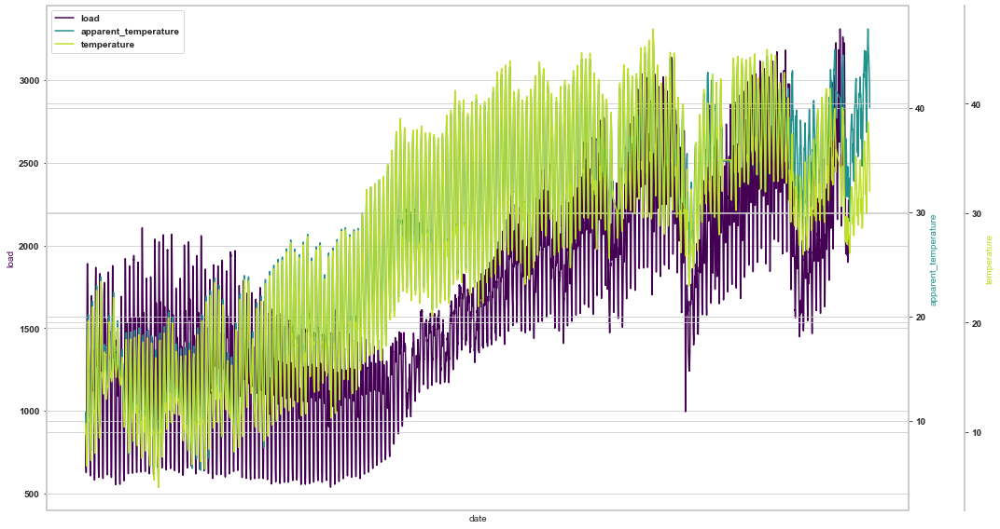

In [38]:
for i in [2016,2018,2020,2022]:
    plot_data(df,years=i,x='apparent_temperature',y='temperature')

Few observations we can make:
* Temperature and Apparent Temperature are highly correlated.
* Load looks more correlated with Apparent temperature.
* Year 2020 will have different correaltion for load and weather because of Covid-19 impact.

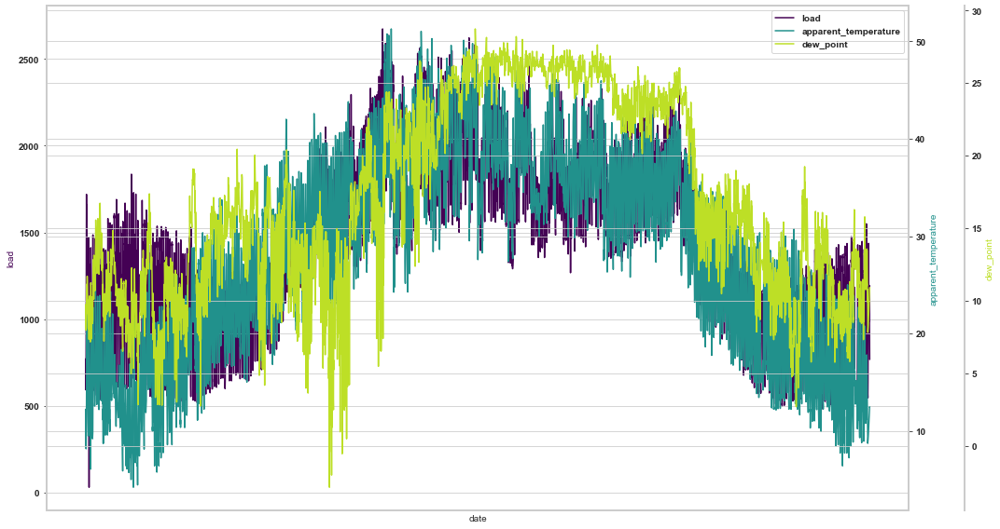

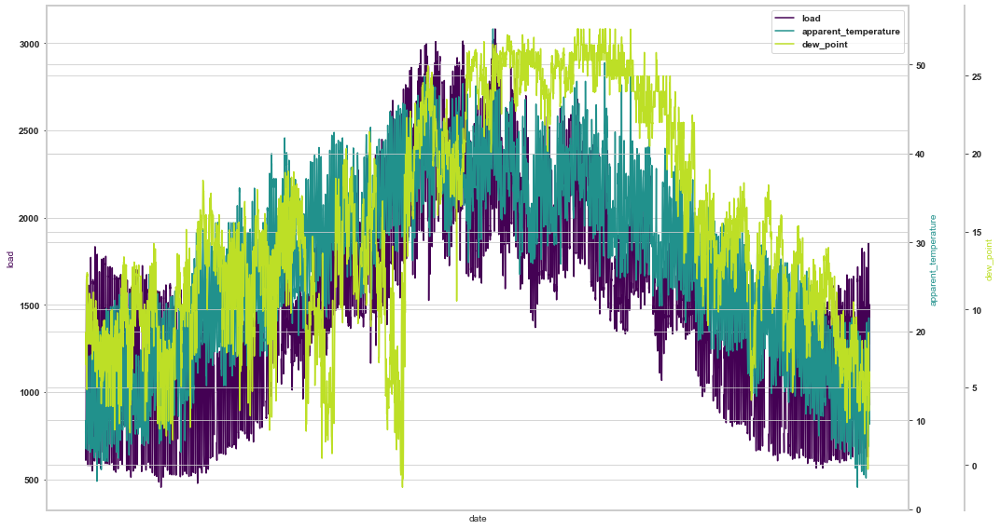

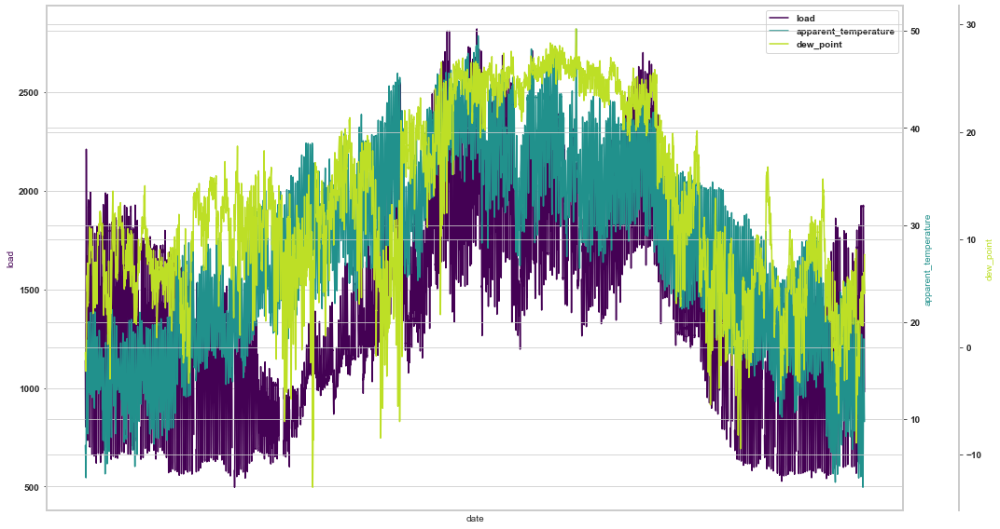

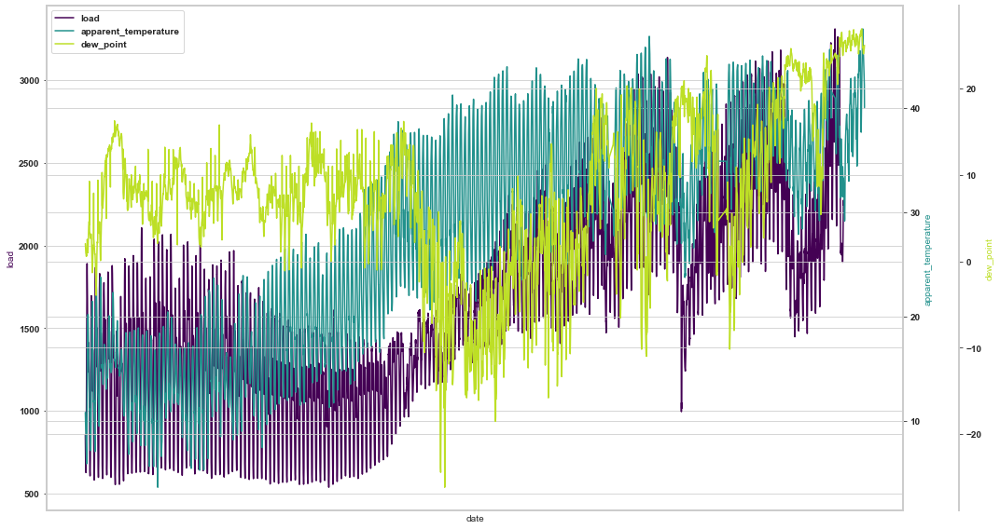

In [39]:
for i in [2016,2018,2020,2022]:
    plot_data(df,i,x='apparent_temperature',y='dew_point')

* Dew Point seems to have some outliers but generally looks to have some correlation with load.

### Apparent Temperature

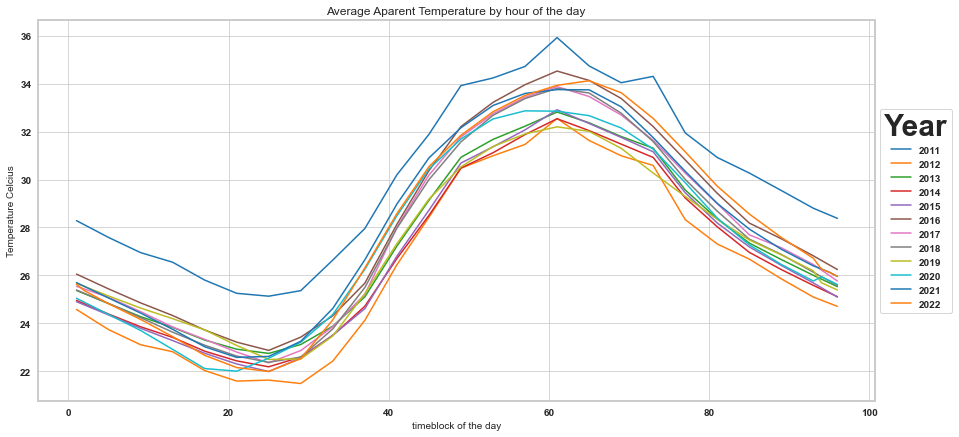

In [40]:
df11 = pd.DataFrame(data.groupby(['year','tb'])['apparent_temperature'].mean()).reset_index().pivot(index='tb',columns='year')
df11.columns = [x[1] for x in df11.columns]
fig, axs = plt.subplots(1,1, figsize=(15,7))
df11.plot(ax=axs)
axs.set_xlabel('timeblock of the day')
axs.set_ylabel('Temperature Celcius')
axs.set_title('Average Aparent Temperature by hour of the day ')
axs.legend(title='Year',title_fontsize=30,loc='center left', bbox_to_anchor=(1, 0.5))

* Apparent Temperature has almost the same pattern every year.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Apparent Temperature')

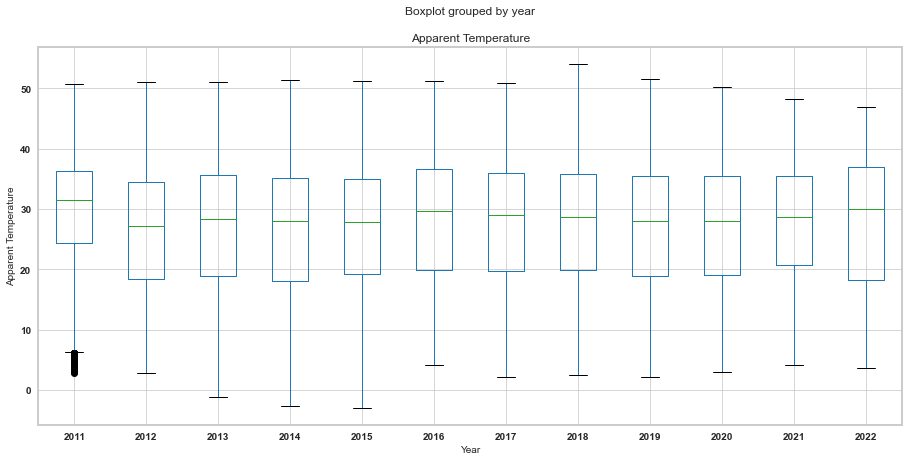

In [41]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='apparent_temperature',by='year',ax=axs)
axs.set_xlabel('Year')
axs.set_ylabel('Apparent Temperature')
axs.set_title('Apparent Temperature')

* We can see hardly any changes in Apparent Temperature over the years.
* Years 2011 and 2022 don't have full year data hence they have a bit of variation.

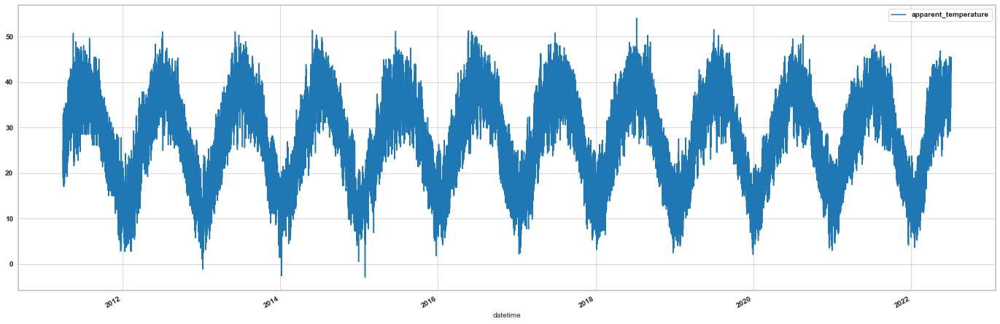

In [42]:
data[['datetime','apparent_temperature']].set_index('datetime').plot()

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Apparent Temperature for Summer Months')

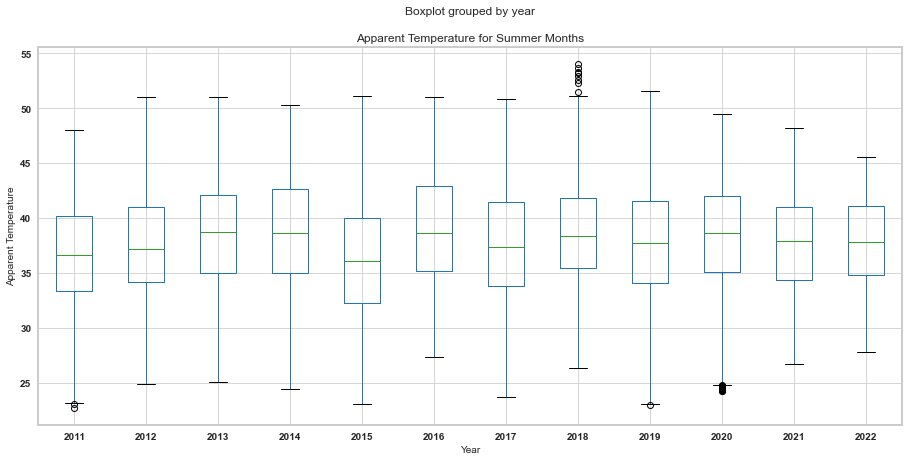

In [43]:
temp = data[data['month'].isin([6,7])].copy()
fig, axs = plt.subplots(1, 1, figsize=(15,7))
temp.boxplot(column='apparent_temperature',by='year',ax=axs)
axs.set_xlabel('Year')
axs.set_ylabel('Apparent Temperature')
axs.set_title('Apparent Temperature for Summer Months')

* 2016 and 2018 have some very hot days.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Apparent Temperature')

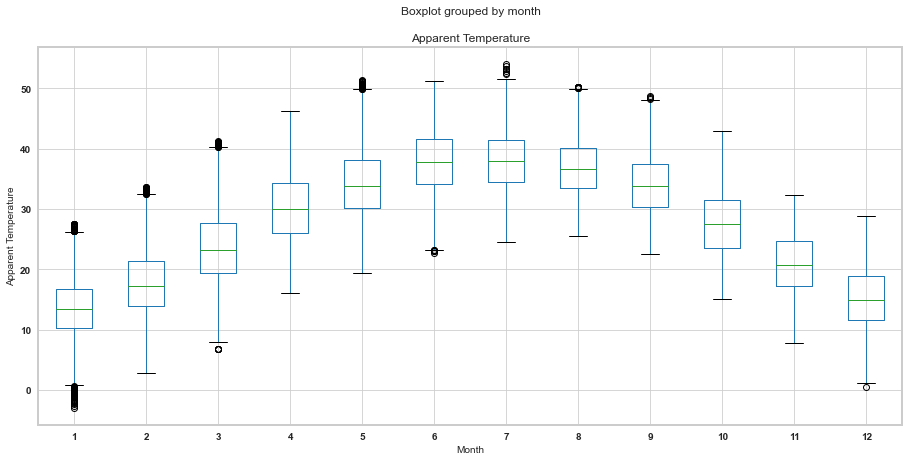

In [44]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='apparent_temperature',by='month',ax=axs)
axs.set_xlabel('Month')
axs.set_ylabel('Apparent Temperature')
axs.set_title('Apparent Temperature')

* December and January are the coldest months.
* June and July are the hottest months.

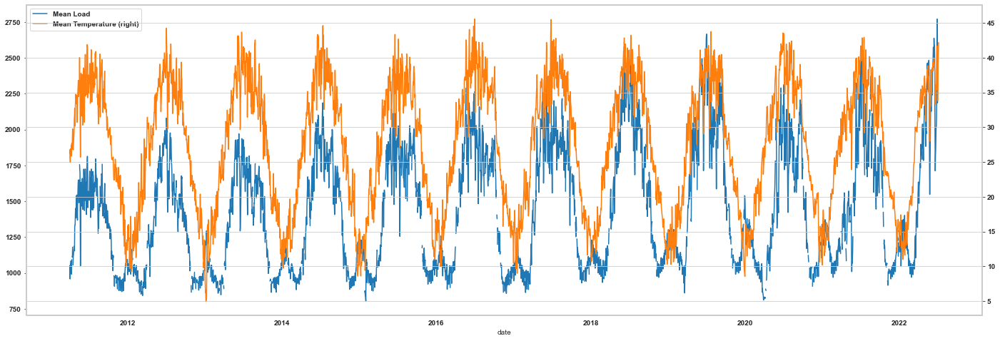

In [45]:
daily_mean = data.groupby(['date']).agg({'load': ['mean', 'min', 'max','std'],'apparent_temperature':['mean', 'min', 'max','std']})
daily_mean.columns = ['load_mean', 'load_min', 'load_max','load_std','temp_mean', 'temp_min', 'temp_max','temp_std']
# daily_mean=daily_mean.reset_index()
daily_mean.load_mean.plot(label="Mean Load", legend=True)
daily_mean.temp_mean.plot(secondary_y=True,label="Mean Temperature", legend=True)

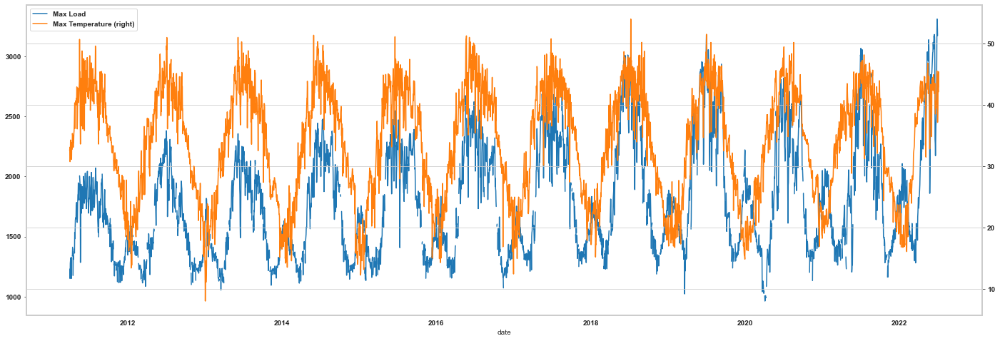

In [46]:
daily_mean.load_max.plot(label="Max Load", legend=True)
daily_mean.temp_max.plot(secondary_y=True,label="Max Temperature", legend=True)

* As observed earlier, the load is increasing in trend but apparent temperature is constant.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


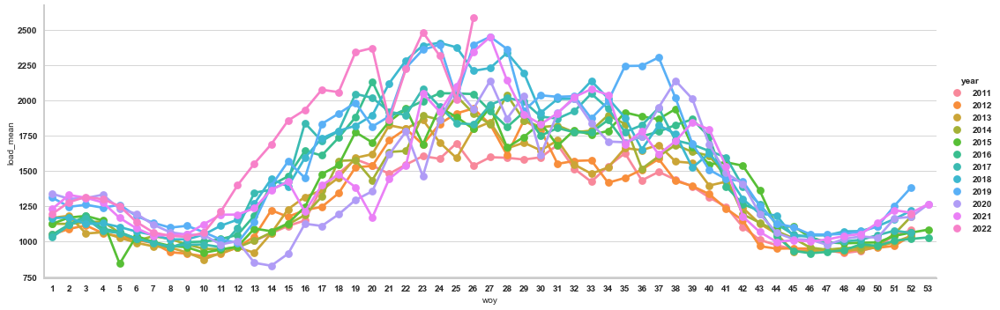

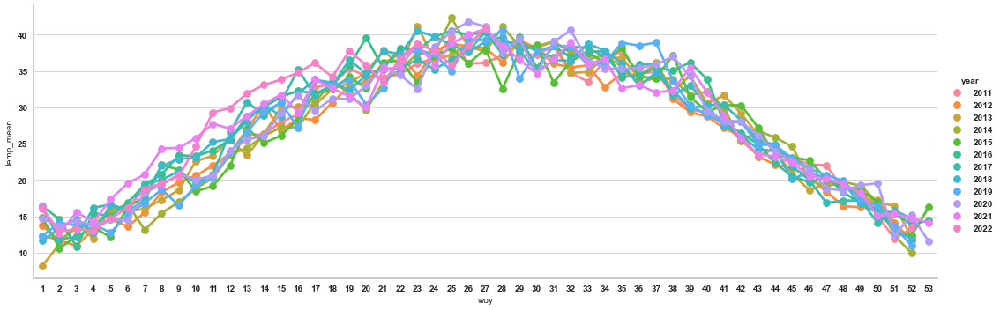

In [47]:
week_mean = data.groupby(['woy','year']).agg({'load': ['mean', 'min', 'max','std'],'apparent_temperature':['mean', 'min', 'max','std']})
week_mean.columns = ['load_mean', 'load_min', 'load_max','load_std','temp_mean', 'temp_min', 'temp_max','temp_std']
# monthly_mean=monthly_mean.reset_index()
sns.factorplot(data=week_mean.reset_index(), x='woy',y='load_mean', hue='year',aspect=15/5)
sns.factorplot(data=week_mean.reset_index(), x='woy',y='temp_mean', hue='year',aspect=15/5)

* The weekly variation across years is more for load than Temperature.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


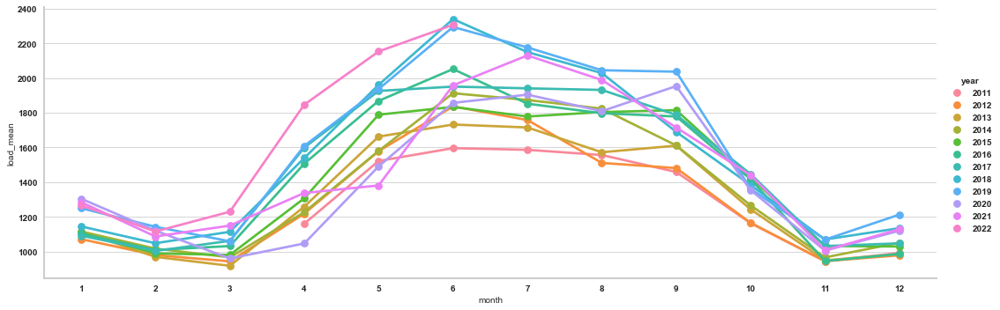

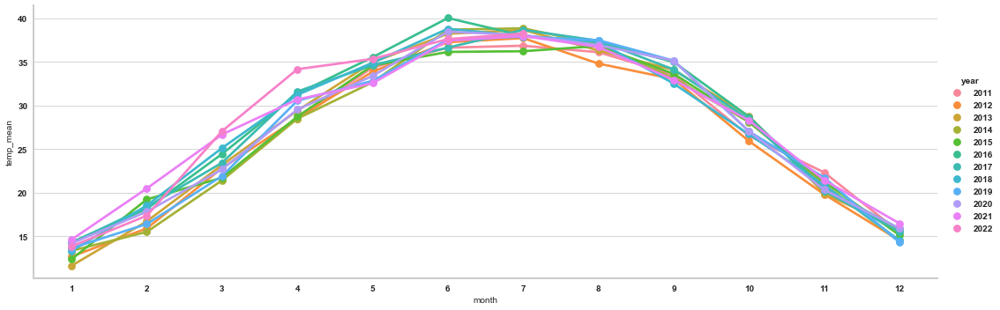

In [48]:
monthly_mean=data.groupby(['month','year']).agg({'load': ['mean', 'min', 'max','std'],'apparent_temperature':['mean', 'min', 'max','std']})
monthly_mean.columns = ['load_mean', 'load_min', 'load_max','load_std','temp_mean', 'temp_min', 'temp_max','temp_std']
# monthly_mean=monthly_mean.reset_index()
sns.factorplot(data=monthly_mean.reset_index(), x='month',y='load_mean', hue='year',aspect=15/5)
sns.factorplot(data=monthly_mean.reset_index(), x='month',y='temp_mean', hue='year',aspect=15/5)

* Same as weekly, the ,monthly variation across load is much higher than Apparent temperature.

### Dew Point

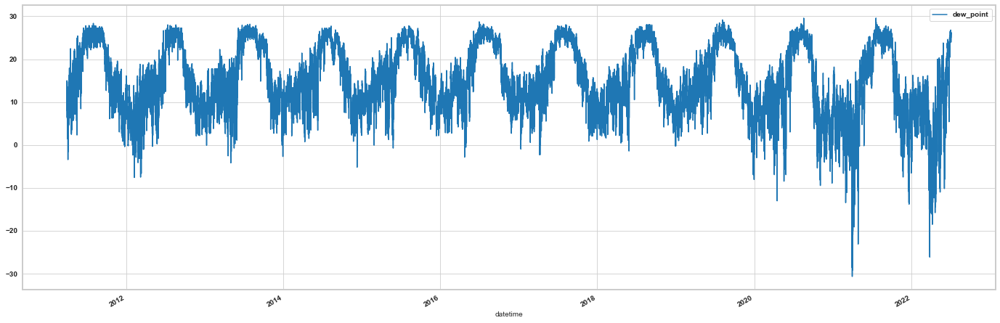

In [49]:
data[['datetime','dew_point']].set_index('datetime').plot()

Looks like some outliers are present.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Dew Point')

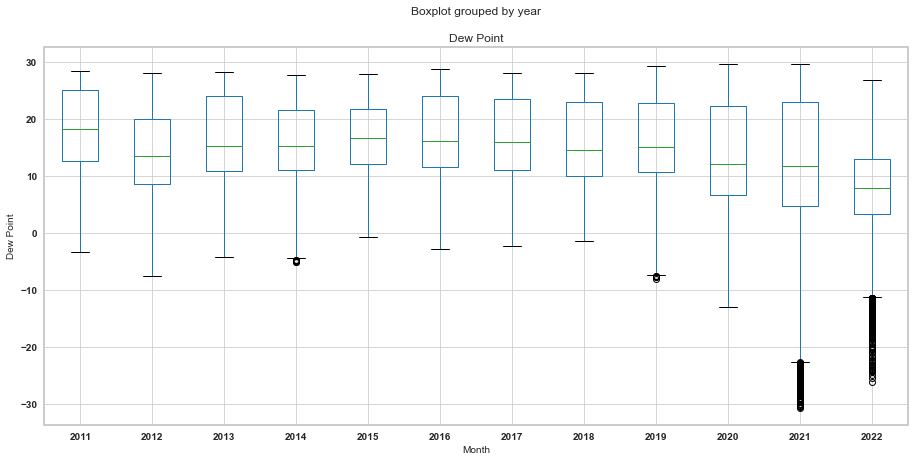

In [50]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='dew_point',by='year',ax=axs)
axs.set_xlabel('Month')
axs.set_ylabel('Dew Point')
axs.set_title('Dew Point')

* Looks like the minimum values are decresing with time specially after 2018.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Dew Point')

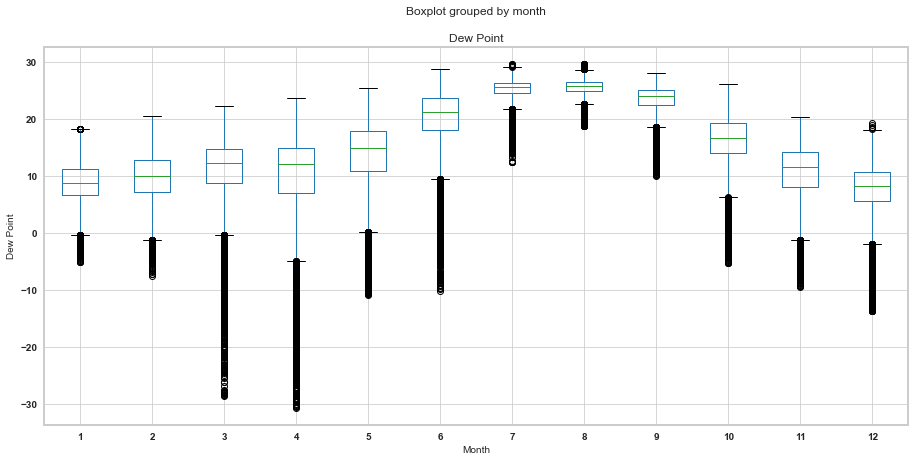

In [51]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='dew_point',by='month',ax=axs)
axs.set_xlabel('Month')
axs.set_ylabel('Dew Point')
axs.set_title('Dew Point')

* Dew point is lowest in the months of March and April and highest in the months of July and August.
* The cyclic pattern is bit similar to load.

### Wind

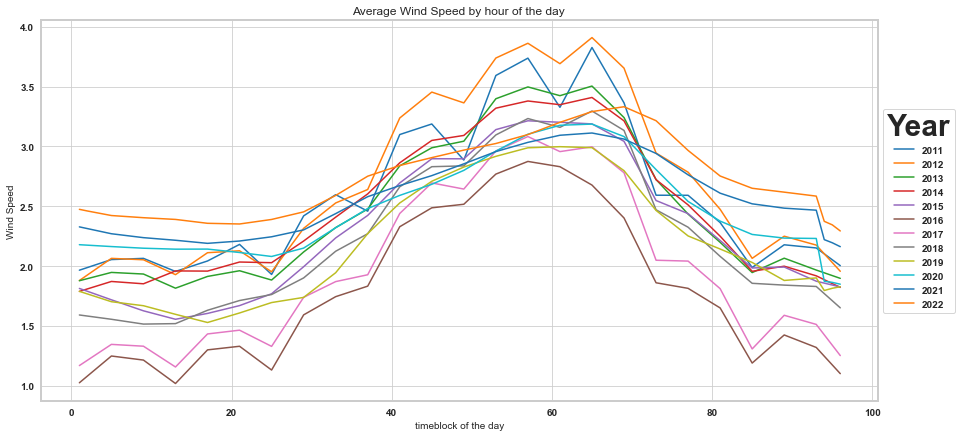

In [52]:
df11 = pd.DataFrame(data.groupby(['year','tb'])['wind_speed'].mean()).reset_index().pivot(index='tb',columns='year')
df11.columns = [x[1] for x in df11.columns]
fig, axs = plt.subplots(1,1, figsize=(15,7))
df11.plot(ax=axs)
axs.set_xlabel('timeblock of the day')
axs.set_ylabel('Wind Speed')
axs.set_title('Average Wind Speed by hour of the day ')
axs.legend(title='Year',title_fontsize=30,loc='center left', bbox_to_anchor=(1, 0.5))

* Wind looks very volatile across years but still there is some pattern we can see.

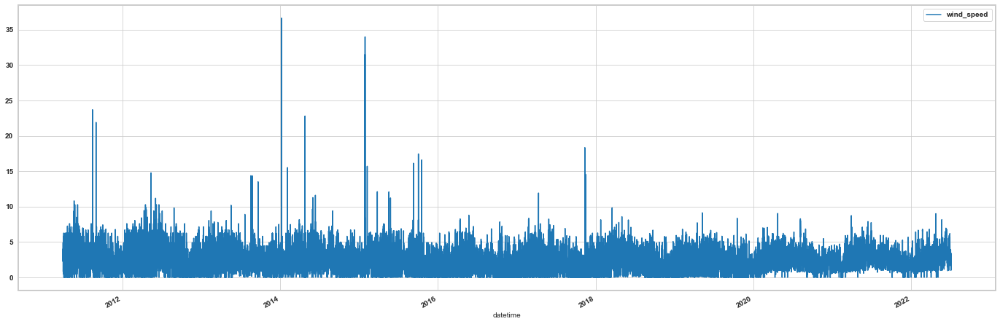

In [53]:
data[['datetime','wind_speed']].set_index('datetime').plot()

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Wind Speed')

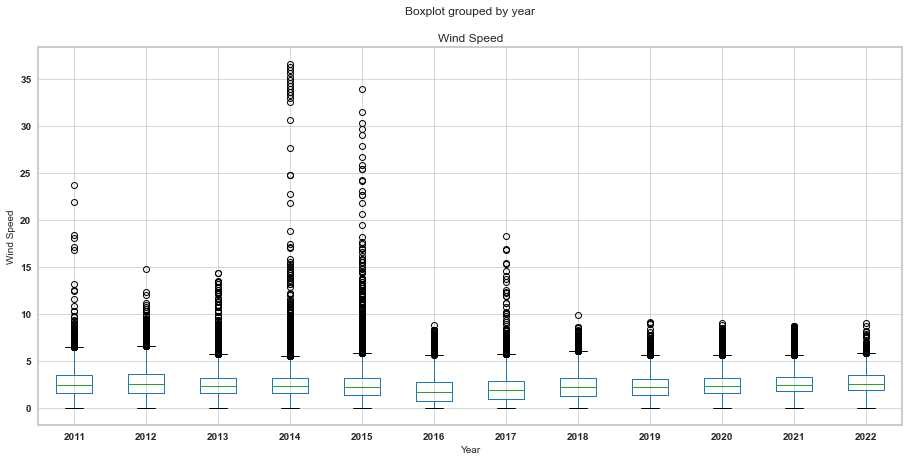

In [54]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='wind_speed',by='year',ax=axs)
axs.set_xlabel('Year')
axs.set_ylabel('Wind Speed')
axs.set_title('Wind Speed')

* There are some extreme values each year but in general follow the same range.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


Text(0.5, 1.0, 'Wind Speed')

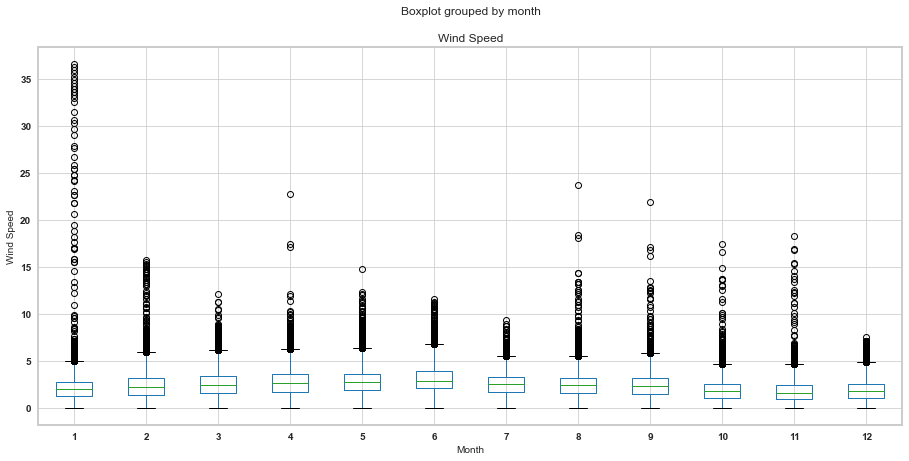

In [55]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))
data.boxplot(column='wind_speed',by='month',ax=axs)
axs.set_xlabel('Month')
axs.set_ylabel('Wind Speed')
axs.set_title('Wind Speed')

* We can't see any monthly seasonality in the wind data.

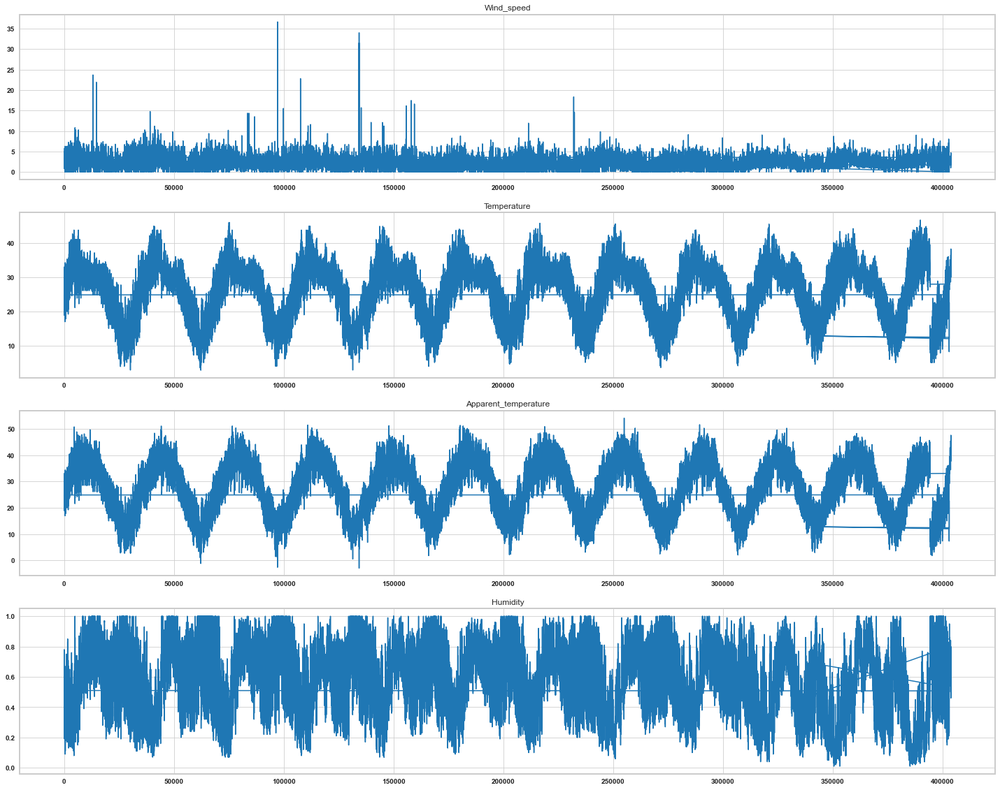

In [56]:
fig,ax = plt.subplots(nrows=4,ncols=1,figsize=(25,20))
df.wind_speed.plot(ax=ax[0],title="Wind_speed")
df.temperature.plot(ax=ax[1],title="Temperature")
df.apparent_temperature.plot(ax=ax[2],title="Apparent_temperature")
df.humidity.plot(ax=ax[3],title="Humidity")
plt.show()

## Correlation

In [57]:
data[['load','apparent_temperature','temperature','humidity','dew_point','wind_speed','cloud_cover']].corr()

,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover
load,1.000000,0.746062,0.693603,-0.193625,0.484195,0.202775,0.278911
apparent_temperature,0.746062,1.000000,0.964019,-0.356640,0.583237,0.295920,0.297302
temperature,0.693603,0.964019,1.000000,-0.535930,0.423518,0.334577,0.177961
humidity,-0.193625,-0.356640,-0.535930,1.000000,0.480921,-0.309613,0.321481
dew_point,0.484195,0.583237,0.423518,0.480921,1.000000,0.004686,0.496540
wind_speed,0.202775,0.295920,0.334577,-0.309613,0.004686,1.000000,0.081756
cloud_cover,0.278911,0.297302,0.177961,0.321481,0.496540,0.081756,1.000000


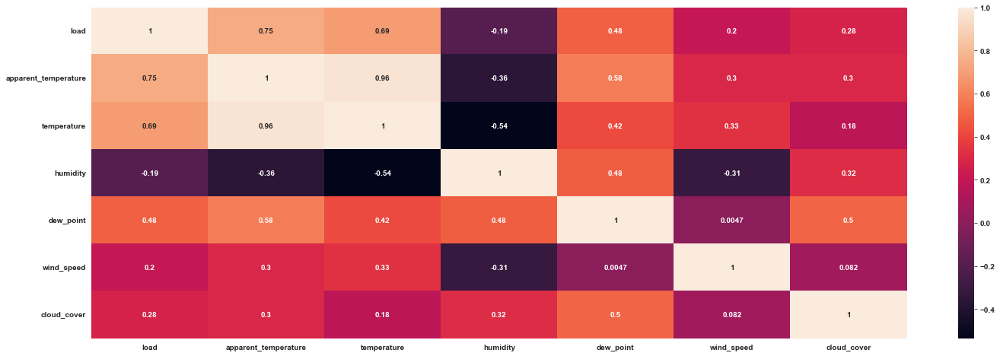

In [58]:
sns.heatmap(data[['load','apparent_temperature','temperature','humidity','dew_point','wind_speed','cloud_cover']].corr(),
            annot=True)

* Wind Speed, Humidity and Cloud Cover have the least correlation with Load

## Time Series Analysis

### Let's try decomposing the load data

In [59]:
# Extra settings
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib as mpl
from pylab import rcParams
seed = 42
np.random.seed(seed)
plt.style.use('bmh')
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['text.color'] = 'k'
rcParams['figure.figsize'] = 18, 8

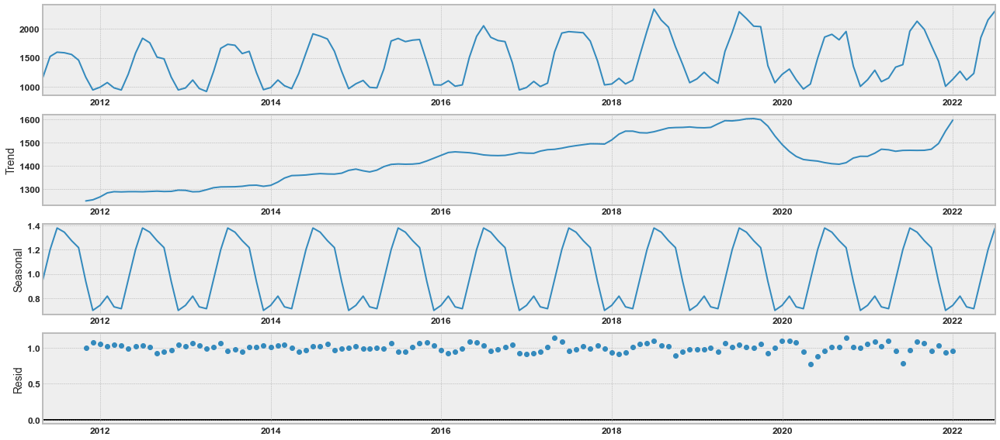

<Figure size 4000x1600 with 0 Axes>

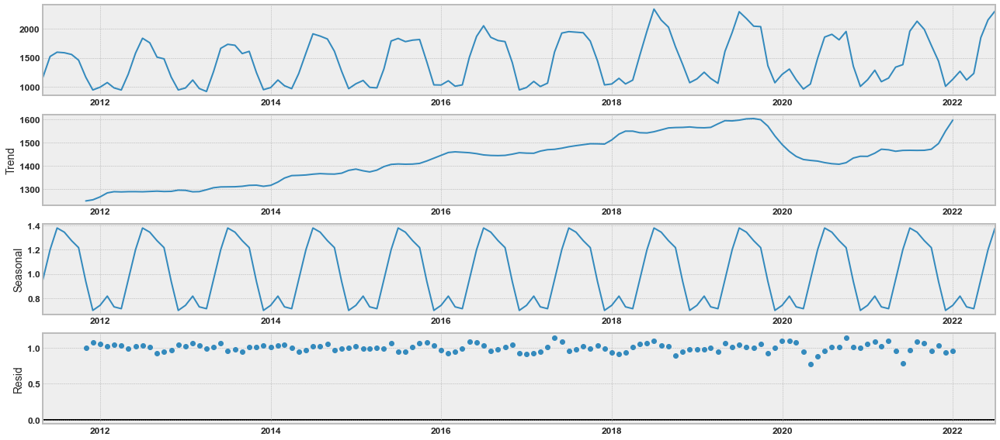

In [60]:
plt.figure(num=None, figsize=(50, 20), dpi=80, facecolor='w', edgecolor='k')
series = data.set_index('datetime')[['load']].resample('M').mean().dropna()
result = seasonal_decompose(series, model='multiplicative')
result.plot()

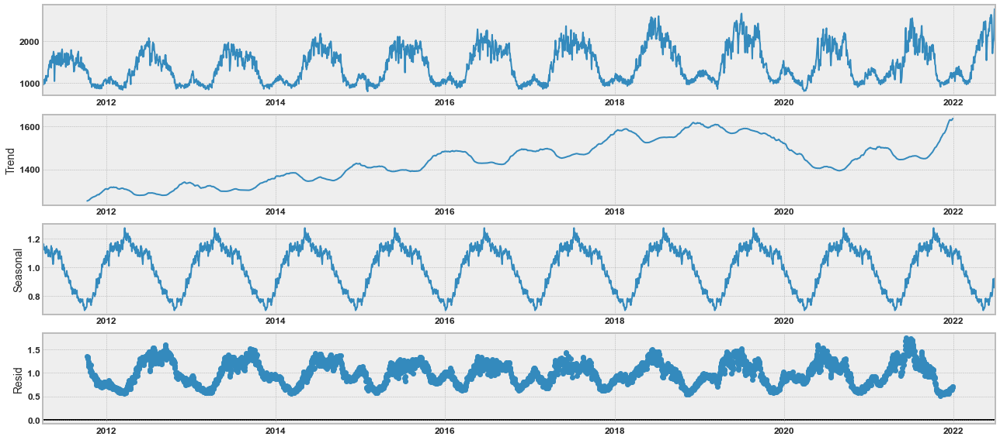

<Figure size 4000x1600 with 0 Axes>

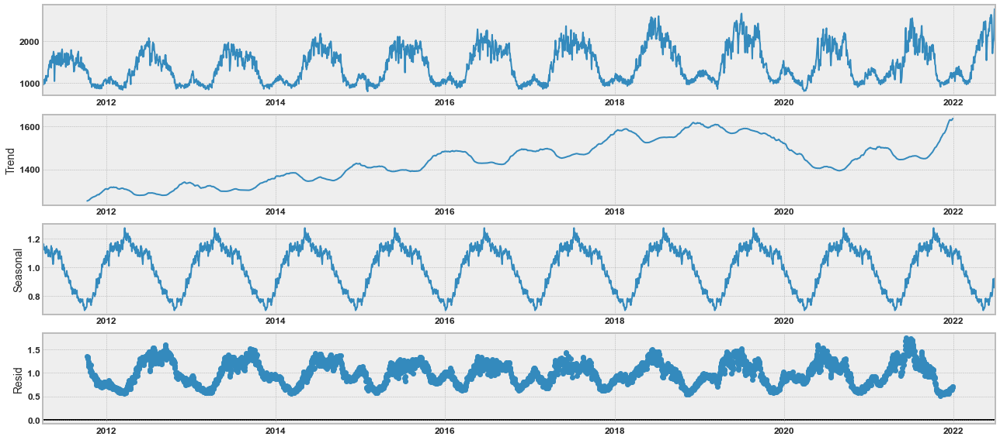

In [61]:
plt.figure(num=None, figsize=(50, 20), dpi=80, facecolor='w', edgecolor='k')
series = data.set_index('datetime')[['load']].resample('D').mean().dropna()
result = seasonal_decompose(series, model='multiplicative',period=365)
result.plot()

* There is an upward trend and we have strong seasonality in the data.

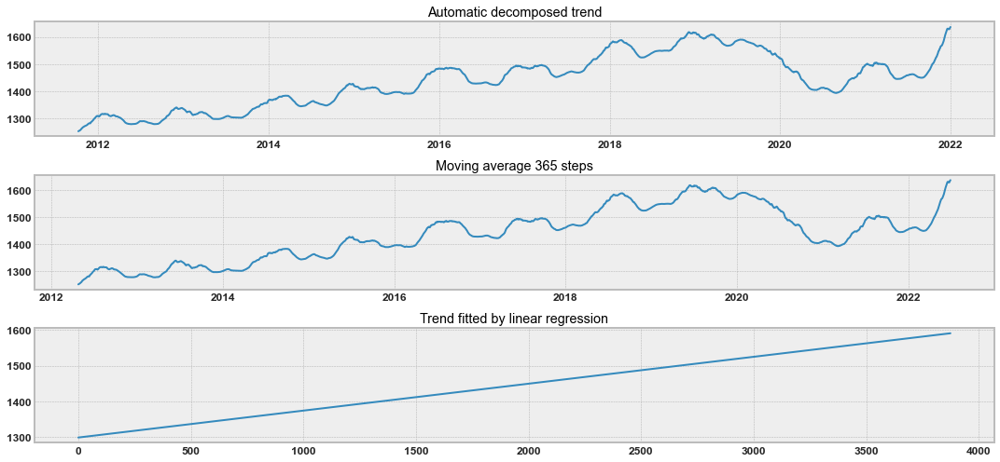

In [62]:
from sklearn.linear_model import LinearRegression
fig = plt.figure(figsize=(15, 7))
layout = (3, 2)
pm_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
mv_ax = plt.subplot2grid(layout, (1, 0), colspan=2)
fit_ax = plt.subplot2grid(layout, (2, 0), colspan=2)

pm_ax.plot(result.trend)
pm_ax.set_title("Automatic decomposed trend")

mm = series.rolling(365).mean()
mv_ax.plot(mm)
mv_ax.set_title("Moving average 365 steps")

X = [i for i in range(0, len(series))]
X = np.reshape(X, (len(X), 1))
y = series.values
model = LinearRegression()
model.fit(X, y)
# calculate trend
trend = model.predict(X)
fit_ax.plot(trend)
fit_ax.set_title("Trend fitted by linear regression")

plt.tight_layout()

* We can de-trend the series by using the coefficient of our fitted linear model.

### Checking Stationarity

In [63]:
series = data.set_index('datetime')[['load']].resample('M').mean().dropna()
X = series.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -1.031057
p-value: 0.741769
Critical Values:
	1%: -3.486
	5%: -2.886
	10%: -2.580


* The data is non-stationary as the p-value is greater than 0.05

Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.

Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.

We interpret this result using the p-value from the test. A p-value below a threshold (such as 5% or 1%) suggests we reject the null hypothesis (stationary), otherwise a p-value above the threshold suggests we fail to reject the null hypothesis (non-stationary).

p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.

p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary

This suggests that we can reject the null hypothesis with a significance level of less than 1% (i.e. a low probability that the result is a statistical fluke).

Rejecting the null hypothesis means that the process has no unit root, and in turn that the time series is stationary or does not have time-dependent structure.

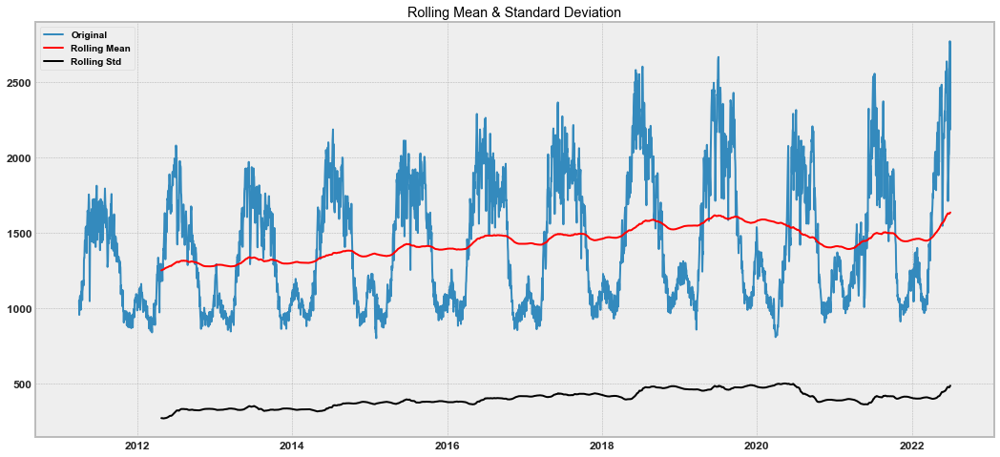

In [64]:
# Determing rolling statistics
series = data.set_index('datetime')[['load']].resample('D').mean().dropna()
rolmean = series.rolling(window=365).mean()
rolstd = series.rolling(window=365).std()

# Plot rolling statistics:
orig = plt.plot(series, label='Original')
mean = plt.plot(rolmean, color='red', label='Rolling Mean')
std = plt.plot(rolstd, color='black', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show(block=False)

### ACF and PACF

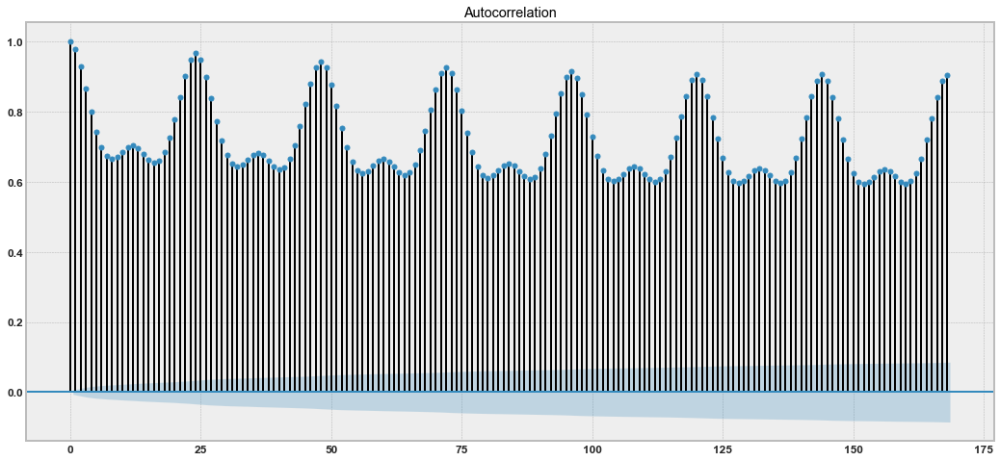

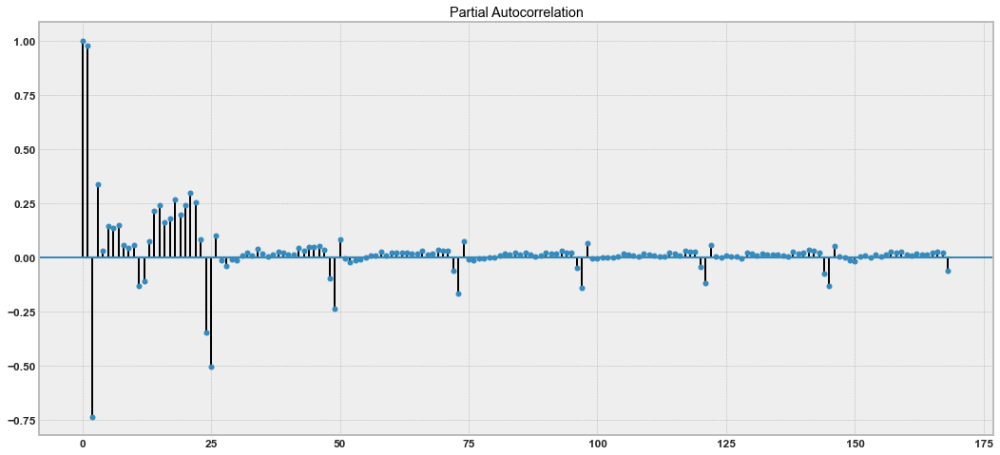

In [65]:
series = data.set_index('datetime')[['load']].resample('H').mean().dropna()
plot_acf(series, lags=24*7)
plot_pacf(series, lags=24*7)
plt.show()

* We can see strong autocorrelation in our data through the plots above.
* Lags can be taken going as back as one week.
* MA can also be taken for various windows going back 24 hours.

# Outliers

In [66]:
print("\t\tMax\tMin")
print("Wind Speed    :", df.wind_speed.max(),"    ",df.wind_speed.min())
print("Temperature   :", df.temperature.max(),"    ", df.temperature.min())
print("App Temperaure:", df.apparent_temperature.max(),"   ", df.apparent_temperature.min())
print("Humidity      :", df.humidity.max(),"    ", df.humidity.min())
print("Dew Point     :", df.dew_point.max(),"    ", df.dew_point.min())
print("Cloud Cover   :", df.cloud_cover.max(),"    ", df.cloud_cover.min())

		Max	Min
Wind Speed    : 36.63      0.0
Temperature   : 46.84      2.78
App Temperaure: 54.03     -2.93
Humidity      : 1.0      0.01
Dew Point     : 29.59      -30.68
Cloud Cover   : 1.0      0.0


In [67]:
data[['load','apparent_temperature','temperature','humidity','dew_point','wind_speed','cloud_cover']].describe().T

,count,mean,std,min,25%,50%,75%,max
load,372000.0,1444.964999,477.010179,0.00,1118.1000,1410.000000,1774.262500,3311.00
apparent_temperature,395137.0,27.637403,9.956161,-2.93,19.6050,28.690000,35.610000,54.03
temperature,395137.0,25.735468,8.194841,2.78,19.5650,27.304167,31.687500,46.84
humidity,395137.0,0.588036,0.236210,0.01,0.4025,0.605000,0.785000,1.00
dew_point,395137.0,15.232963,7.867138,-30.68,9.5800,14.805000,22.799286,29.59
wind_speed,395137.0,2.372281,1.380515,0.00,1.3700,2.250000,3.140000,36.63
cloud_cover,395137.0,0.305777,0.318494,0.00,0.0000,0.230000,0.580000,1.00


## IQR

### Load

In [68]:
# As there are no outliers present users can select any one method to show  the same  
Q1= data.load.quantile(0.25) 
Q3= data.load.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier'] = (data.load>(Q3+IQR*1.5)) | (data.load< (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier'].sum()}")

We have following number of outliers : 1906


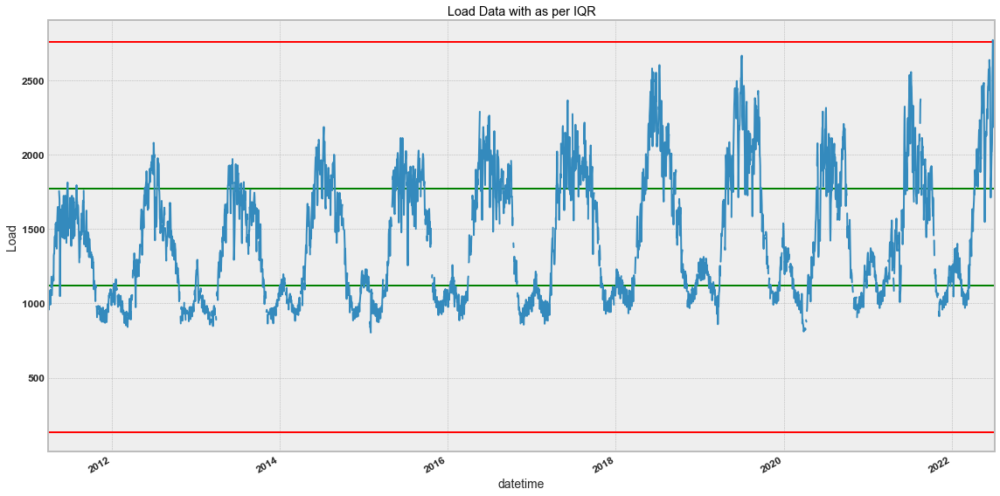

In [69]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['load'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Load')
plt.title("Load Data with as per IQR")
plt.tight_layout()

In [70]:
data[data['iqr_outlier']==1].groupby(['year','month'])['load'].agg(['count','mean'])

count         mean
year month                    
2015 12        14     0.000000
2016 1          2    34.000000
2018 5          8  2813.396250
     6        290  2844.434828
     7        113  2871.362478
2019 6        256  2840.484453
     7        215  2911.661349
     8         25  2800.313200
     9         33  2823.831818
2020 6         10  2785.424000
     7          5  2781.496000
2021 6         49  2843.424490
     7        195  2879.828564
     8         16  2807.134375
2022 5        184  2879.284348
     6        491  2947.593198

We can observe three things here:

* Most of the outliers are in the May-August months when it tends to get extremely hot.
* 2021 and 2022 also has a lot of outliers which is again possible because of the increasing trend.
* Outliers in 2015 December looks interesting as all the values 0.

In [71]:
data[(data['iqr_outlier']==1) & (data['month']==12)]

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday,hour,dom,month,year,dow,doy,weekend,woy,iqr_outlier
163837,2015-12-02 15:15:00,2015-12-02,0.0,62,24.395833,24.395833,0.4525,11.634167,2.790,0.3100,False,16,2,12,2015,2,336,0,49,True
163838,2015-12-02 15:30:00,2015-12-02,0.0,63,24.161667,24.161667,0.4650,11.798333,2.740,0.3100,False,16,2,12,2015,2,336,0,49,True
164791,2015-12-12 13:45:00,2015-12-12,0.0,56,13.727500,13.727500,0.9300,12.597500,3.850,0.0000,False,14,12,12,2015,5,346,0,50,True
164792,2015-12-12 14:00:00,2015-12-12,0.0,57,13.540000,13.540000,0.9400,12.580000,4.010,0.0000,False,15,12,12,2015,5,346,0,50,True
165834,2015-12-23 10:30:00,2015-12-23,0.0,43,11.415000,11.915000,0.8350,9.040000,2.290,0.0000,False,11,23,12,2015,2,357,0,52,True
165835,2015-12-23 10:45:00,2015-12-23,0.0,44,12.652500,12.902500,0.7825,9.075000,2.315,0.0000,False,11,23,12,2015,2,357,0,52,True
165836,2015-12-23 11:00:00,2015-12-23,0.0,45,13.890000,13.890000,0.7300,9.110000,2.340,0.0000,False,12,23,12,2015,2,357,0,52,True
165837,2015-12-23 11:15:00,2015-12-23,0.0,46,14.397500,14.397500,0.7075,9.125000,2.345,0.0025,False,12,23,12,2015,2,357,0,52,True
165838,2015-12-23 11:30:00,2015-12-23,0.0,47,14.905000,14.905000,0.6850,9.140000,2.350,0.0050,False,12,23,12,2015,2,357,0,52,True
165839,2015-12-23 11:45:00,2015-12-23,0.0,48,15.412500,15.412500,0.6625,9.155000,2.355,0.0075,False,12,23,12,2015,2,357,0,52,True


### Wind

In [72]:
Q1= data.wind_speed.quantile(0.25) 
Q3= data.wind_speed.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_ws'] = (data.wind_speed > (Q3+IQR*1.5)) | (data.wind_speed < (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_ws'].sum()}")

We have following number of outliers : 6117


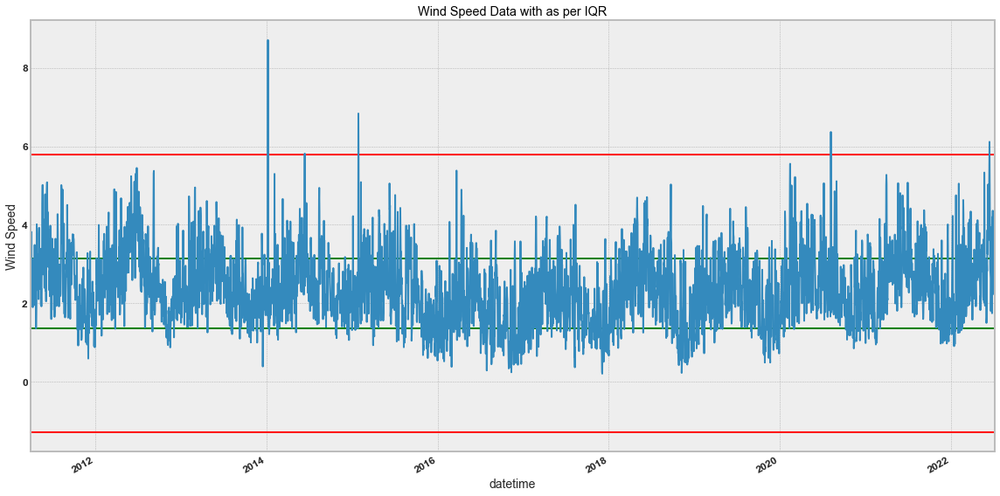

In [73]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['wind_speed'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Wind Speed')
plt.title("Wind Speed Data with as per IQR")
plt.tight_layout()

Again we can see some values outside the IQR.

In [74]:
data[data['iqr_outlier_ws']==1].groupby(['year','month'])['wind_speed'].agg(['count','mean'])

count       mean
year month                  
2011 4         45   6.206667
     5        155   6.589855
     6        162   6.560201
     7         65   6.286538
     8         90   6.957694
     9        125   6.585520
     10        46   6.242880
     11        15   6.259000
     12         1   5.810000
2012 1         49   6.346020
     2        141   6.487677
     3        115   6.493500
     4        141   6.768599
     5        195   6.565064
     6        388   6.620735
     7        111   6.312140
     8         28   6.581964
     9        148   6.341081
     10        19   6.348684
     12        65   6.316019
2013 1         34   6.320441
     2         94   6.467287
     3        157   6.442261
     4        113   6.381549
     5         82   6.216220
     6         45   6.137870
     7         10   7.462500
     8         45   9.136500
     9         47   7.575443
     10         1   5.810000
     11        10   6.025500
     12        27   6.401435
2014 1         33  22.598914
     2         65   8.592256
     3         89   6.480566
     4         77   6.874567
     5         62   6.653737
     6        214   6.768581
     7         48   6.143559
     8         94   6.364007
     9         59   6.480551
     11         7   6.230306
     12        14   6.101786
2015 1         47  16.456117
     2         42   9.318142
     3         26   7.763494
     4         54   6.419954
     5         76   7.109227
     6         81   6.186842
     7         84   6.156806
     8         10   5.984083
     9        105   6.327579
     10        45   8.555870
2016 1          5   6.018500
     2         14   6.093661
     3         53   6.202311
     4         94   6.557287
     5         39   6.463462
     6         29   6.324224
     8          3   5.932500
     9          4   6.329375
     10        18   6.350556
     11         6   5.865833
2017 1          4   5.915000
     2         61   6.684303
     3         28   6.246964
     4         49   6.692296
     5         24   6.479687
     6         55   6.270015
     8         12   6.335903
     9          1   5.840000
     11        28  11.345952
     12        11   6.047273
2018 1         28   6.182143
     2         20   5.970083
     3         70   6.275393
     4         29   6.670172
     5         42   6.591310
     6         52   6.297356
     9         29   6.169397
2019 1          2   5.895000
     2         44   6.166534
     4         25   6.634800
     5          4   8.285000
     6         14   6.065179
     7         11   6.045909
     8          1   5.820000
     10         8   7.296563
     11         3   5.975000
2020 2         60   6.566333
     3         57   6.282368
     4         36   6.694028
     5         29   5.924569
     7         16   6.135625
     8        152   6.880411
2021 3         87   7.002299
     4         40   6.449937
     5         98   6.204005
     6         70   6.564679
     7         12   6.347083
     8         16   5.878437
2022 1         31   6.085000
     2         83   6.333735
     3         37   6.364122
     4         32   6.307500
     5         34   6.396397
     6        206   6.178908

* Usually the high wind values are considered as outliers through IQR

### Temperature

In [75]:
# As there are no outliers present users can select any one method to show  the same  
Q1= data.temperature.quantile(0.25) 
Q3= data.temperature.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_temp'] = (data.temperature>(Q3+IQR*1.5)) | (data.temperature< (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_temp'].sum()}")

We have following number of outliers : 0


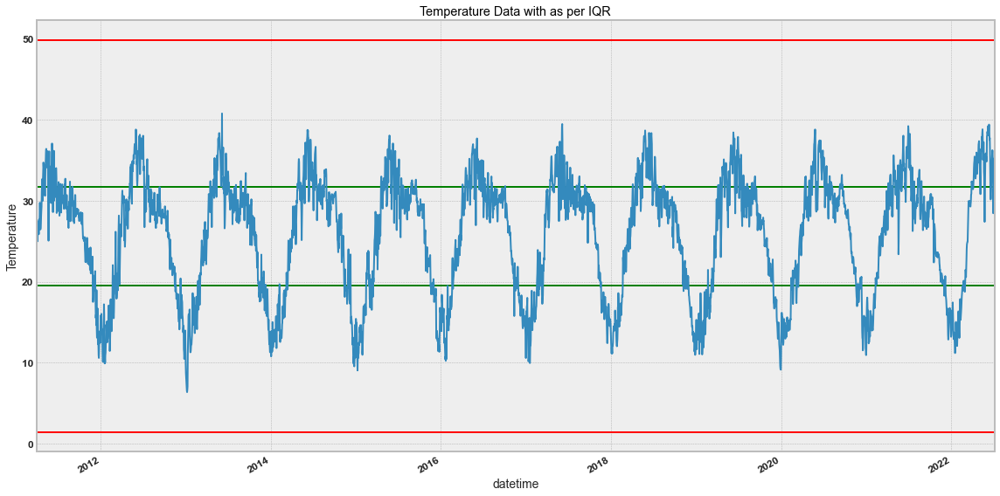

In [76]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['temperature'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Temperature')
plt.title("Temperature Data with as per IQR")
plt.tight_layout()

### Apparent Temperature

In [77]:
Q1= data.apparent_temperature.quantile(0.25) 
Q3= data.apparent_temperature.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_ap'] = (data.apparent_temperature > (Q3+IQR*1.5)) | (data.apparent_temperature < (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_ap'].sum()}")

We have following number of outliers : 0


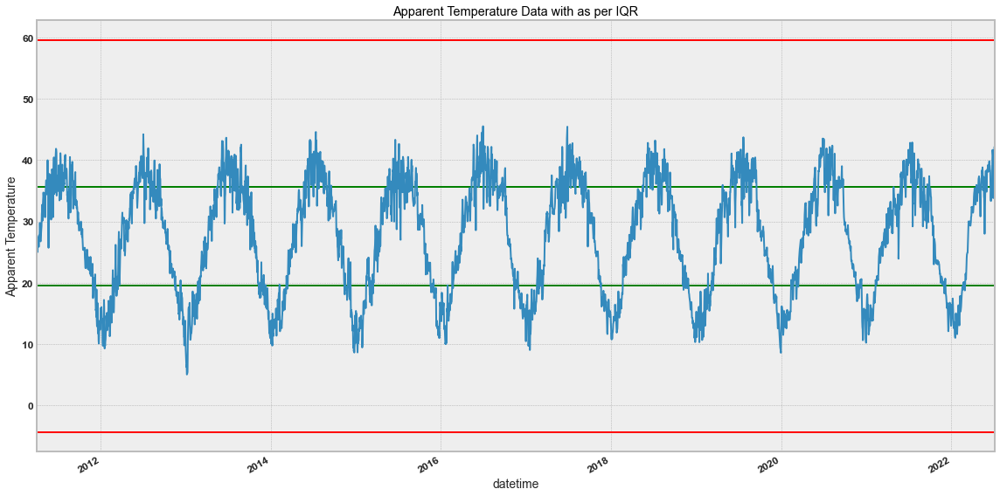

In [78]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['apparent_temperature'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Apparent Temperature')
plt.title("Apparent Temperature Data with as per IQR")
plt.tight_layout()

### Dew Point

In [79]:
Q1= data.dew_point.quantile(0.25) 
Q3= data.dew_point.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_dp'] = (data.dew_point > (Q3+IQR*1.5)) | (data.dew_point < (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_dp'].sum()}")

We have following number of outliers : 1683


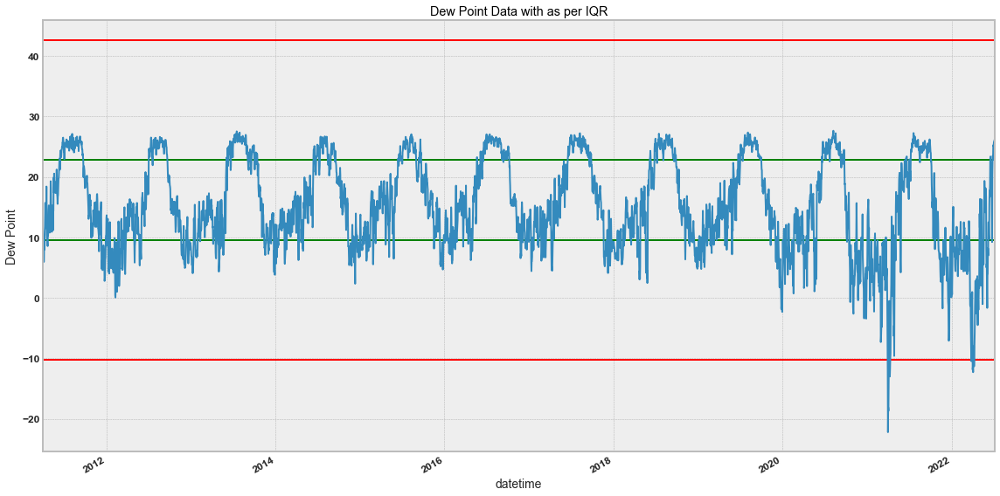

In [80]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['dew_point'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Dew Point')
plt.title("Dew Point Data with as per IQR")
plt.tight_layout()

* We can some values going below 0. We need to check this with the meteorology team.

In [81]:
data[data['iqr_outlier_dp']==1].groupby(['year','month'])['dew_point'].agg(['count','mean'])

count       mean
year month                  
2020 4         17 -11.872647
2021 3        117 -15.342094
     4        714 -16.412847
     12        54 -11.829907
2022 3        197 -14.813832
     4        571 -12.831769
     5         13 -10.567308

* These outliers are specially coming in the years after 2019.

### Humidity

In [82]:
Q1= data.humidity.quantile(0.25) 
Q3= data.humidity.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_hum'] = (data.humidity > (Q3+IQR*1.5)) | (data.humidity < (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_hum'].sum()}")

We have following number of outliers : 0


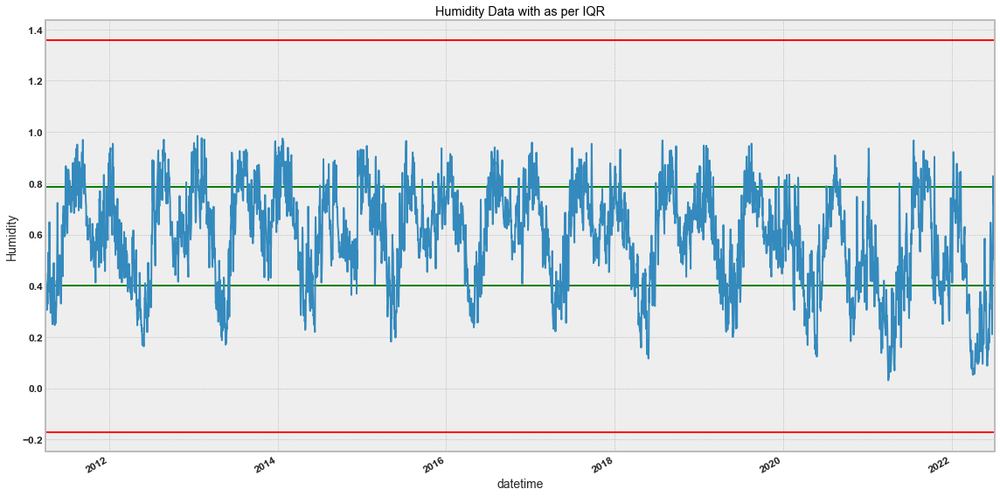

In [83]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['humidity'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Humidity')
plt.title("Humidity Data with as per IQR")
plt.tight_layout()

### Cloud Cover

In [84]:
Q1= data.cloud_cover.quantile(0.25) 
Q3= data.cloud_cover.quantile(0.75) 
IQR = Q3-Q1
data['iqr_outlier_cc'] = (data.cloud_cover > (Q3+IQR*1.5)) | (data.cloud_cover < (Q1-IQR*1.5))
print(f"We have following number of outliers : {data['iqr_outlier_cc'].sum()}")

We have following number of outliers : 0


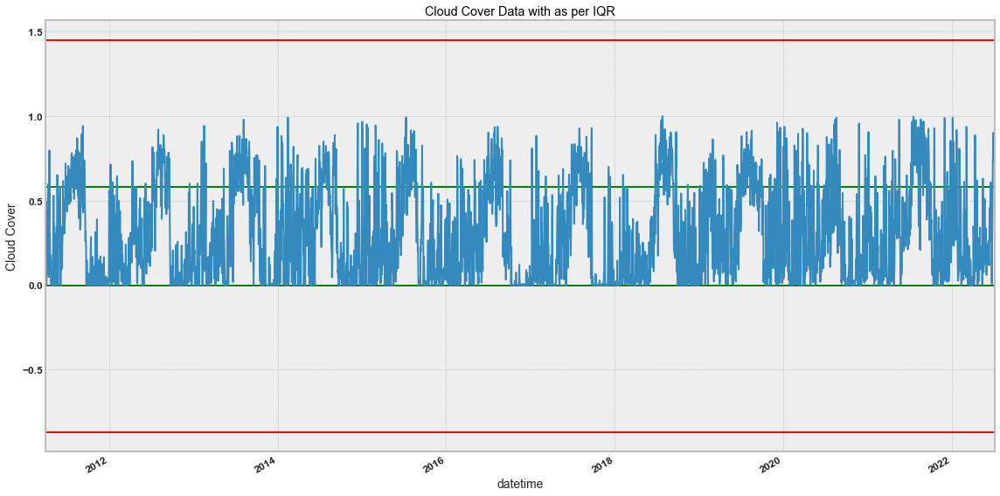

In [85]:
plt.figure(figsize=(16,8))
plt.axhline(Q1,color='green')
plt.axhline(Q3,color='green')
plt.axhline(Q1-IQR*1.5,color='red')
plt.axhline(Q3+IQR*1.5,color='red')
data.set_index('datetime').resample('D')['cloud_cover'].mean().plot()
plt.xlim([data.datetime.min(), data.datetime.max()])
plt.ylabel('Cloud Cover')
plt.title("Cloud Cover Data with as per IQR")
plt.tight_layout()

## Isolation Forest

In [86]:
from sklearn.ensemble import IsolationForest
df1 = data[['datetime','load', 'tb', 'apparent_temperature', 'temperature', 'humidity', 'dew_point', 'wind_speed', 
    'cloud_cover', 'hour', 'dom', 'month', 'year', 'dow', 'doy', 'weekend', 'woy']].dropna().copy()
model = IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.01),max_features=1.0,bootstrap=False)
model.fit(df1.iloc[:,1:])
df1['outlier'] = model.predict(df1.iloc[:,1:])
df1['outlier'].value_counts()

 1    368280
-1      3720
Name: outlier, dtype: int64

In [87]:
df1[df1['outlier']==-1].groupby(['year'])[['load','dew_point','wind_speed']].agg({'count','mean','min','max'})

load                                dew_point                        \
     count         mean      min      max     count       mean        min   
year                                                                        
2011    26   900.569231  615.457  1647.63        26   8.290276   4.570750   
2012   416   923.073618  535.361  1928.30       416   8.678658   2.560000   
2013   327   940.491661  585.184  1708.30       327   6.890658   1.290000   
2014   150   803.625720  595.402  1555.65       150   7.466535   2.780000   
2015   148   784.737108  472.900  1210.00       148  10.558808   3.590000   
2016    70   760.063543  524.000  1271.00        70   8.837711   7.180000   
2017   149   839.750899  553.000  1407.00       149  10.817721   5.253333   
2018   181   957.319022  559.217  2578.93       181   6.162083  -0.270000   
2019   378  1351.301497  645.180  2939.92       378   2.573823  -7.620000   
2020   273   964.290733  567.067  2303.51       273   2.212299  -8.920000   
2021   534  1021.278571  562.000  1917.00       534   1.236779 -20.110000   
2022  1068  1511.949278  551.990  3116.00      1068   2.799710 -26.150000   

                wind_speed                                
            max      count      mean      min        max  
year                                                      
2011  12.141250         26  1.924402  0.00375   7.600000  
2012  16.110000        416  2.004374  0.00000  11.180000  
2013  15.217500        327  1.936383  0.00000   7.042500  
2014  14.071667        150  4.051894  0.00000  35.961667  
2015  17.400000        148  4.135253  0.00000  30.301667  
2016  12.506667         70  0.954770  0.00000   2.680000  
2017  16.180000        149  0.460951  0.00000   3.880000  
2018  10.396667        181  0.691031  0.00000   3.580000  
2019  21.240000        378  1.453333  0.00000   4.780000  
2020  14.000000        273  1.834515  0.00000   5.480000  
2021  17.000000        534  2.039349  0.00000   4.420000  
2022  23.080000       1068  2.815391  0.00000   9.000000

* Isolation Forest is not able to get load with values 0 as outliers.
* It is working relatively better on dew_point and wind_speed data.

## One Class SVM

In [88]:
from sklearn.svm import OneClassSVM
ocsvm = OneClassSVM(nu=0.01,gamma=0.001)
ocsvm.fit(df1.iloc[:,1:-1])
df1['outlier_svm'] = ocsvm.predict(df1.iloc[:,1:-1])
df1['outlier_svm'].value_counts()

 1    367310
-1      4690
Name: outlier_svm, dtype: int64

In [89]:
df1[df1['outlier_svm']==-1].groupby(['year'])[['load','dew_point','wind_speed']].agg({'count','mean','min','max'})

load                                dew_point                      \
     count         mean      min      max     count       mean      min   
year                                                                      
2011   304  1401.842309  508.037  2026.93       304  20.371361   2.0300   
2012   430  1213.289802  470.392  2346.04       430  15.022981  -4.1400   
2013   268  1233.835198  436.465  2193.49       268  16.056482  -4.1800   
2014   243  1240.696008  554.140  2284.35       243  13.869816   2.1250   
2015   298  1259.639846    0.000  2385.00       298  16.844753   3.2600   
2016   290  1521.228217   30.000  2554.00       290  18.612606   3.0150   
2017   242  1586.223971  440.511  2672.67       242  18.438727   2.9800   
2018   228  1876.233219  671.153  3015.05       228  16.631771  -1.3875   
2019   556  2006.052941  712.357  3178.86       556  14.827995  -7.8175   
2020   594  1513.558473  529.000  2749.73       594  10.449272 -13.0400   
2021   611  1466.322270  593.000  3032.20       611   6.981264 -28.6600   
2022   626  2125.594818  582.000  3311.00       626   2.550858 -26.1500   

                wind_speed                            
            max      count      mean    min      max  
year                                                  
2011  28.370000        304  2.887508  0.000  10.8100  
2012  27.270000        430  2.414677  0.000  14.7600  
2013  27.838333        268  2.542200  0.000  14.3600  
2014  26.788333        243  4.551363  0.065  36.6300  
2015  26.331667        298  4.062488  0.000  33.9800  
2016  28.175833        290  1.242721  0.000   4.2300  
2017  27.230000        242  1.734261  0.000  18.3300  
2018  28.010000        228  2.308626  0.000   8.5800  
2019  27.965000        556  1.965859  0.000   5.7525  
2020  28.280000        594  2.635871  0.000   7.6450  
2021  28.000000        611  2.609403  0.000   7.8900  
2022  26.490000        626  2.824902  0.000   7.5000

* One Class SVM has performed better than IF from the looks of it.

In [90]:
# Fixing Outliers
data['load'] = data['load'].apply(lambda x: np.nan if x < 400 else x)
data['dew_point'] = data['dew_point'].apply(lambda x: np.nan if x < -16 else x)

# Missing Weather Data

In [91]:
data.isnull().sum()

datetime                    0
date                        0
load                    23153
tb                          0
apparent_temperature        0
temperature                 0
humidity                    0
dew_point                 415
wind_speed                  0
cloud_cover                 0
holiday                     0
hour                        0
dom                         0
month                       0
year                        0
dow                         0
doy                         0
weekend                     0
woy                         0
iqr_outlier                 0
iqr_outlier_ws              0
iqr_outlier_temp            0
iqr_outlier_ap              0
iqr_outlier_dp              0
iqr_outlier_hum             0
iqr_outlier_cc              0
dtype: int64

In [92]:
data.set_index('datetime', inplace=True)
data.head()

,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday,hour,dom,month,year,dow,doy,weekend,woy,iqr_outlier,iqr_outlier_ws,iqr_outlier_temp,iqr_outlier_ap,iqr_outlier_dp,iqr_outlier_hum,iqr_outlier_cc
datetime,,,,,,,,,,,,,,,,,,,,,,,,,
2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,True,1,1,4,2011,4,91,0,13,False,False,False,False,False,False,False
2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,True,1,1,4,2011,4,91,0,13,False,False,False,False,False,False,False
2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,True,1,1,4,2011,4,91,0,13,False,False,False,False,False,False,False
2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,True,1,1,4,2011,4,91,0,13,False,False,False,False,False,False,False
2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,True,2,1,4,2011,4,91,0,13,False,False,False,False,False,False,False


In [93]:
## If you do want to use simple interpolate on TS data, then use method time
data['dew_point'] = data['dew_point'].interpolate(method='time') 
data.reset_index(inplace=True)
data.isnull().sum()

datetime                    0
date                        0
load                    23153
tb                          0
apparent_temperature        0
temperature                 0
humidity                    0
dew_point                   0
wind_speed                  0
cloud_cover                 0
holiday                     0
hour                        0
dom                         0
month                       0
year                        0
dow                         0
doy                         0
weekend                     0
woy                         0
iqr_outlier                 0
iqr_outlier_ws              0
iqr_outlier_temp            0
iqr_outlier_ap              0
iqr_outlier_dp              0
iqr_outlier_hum             0
iqr_outlier_cc              0
dtype: int64

In [94]:
data.drop(['iqr_outlier','iqr_outlier_ws','iqr_outlier_temp','iqr_outlier_ap','iqr_outlier_dp','iqr_outlier_hum','iqr_outlier_cc','holiday'],1,inplace=True)
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13


# Feature Engineering

## Lags

In [95]:
# Time Block Lags
data['lag1h'] = data.load.shift(1*4)
data['lag2h'] = data.load.shift(2*4)
data['lag4h'] = data.load.shift(4*4)
data['lag6h'] = data.load.shift(6*4)
data['lag12h'] = data.load.shift(12*4)
data['lag1d'] = data.load.shift(24*4)
data['lag2d'] = data.load.shift(2*24*4)
data['lag3d'] = data.load.shift(3*24*4)
data['lag4d'] = data.load.shift(4*24*4)
data['lag5d'] = data.load.shift(5*24*4)
data['lag6d'] = data.load.shift(6*24*4)
data['lag7d'] = data.load.shift(7*24*4)
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Moving Averages

In [96]:
# Exponential Moving Averages
data['load_ewm1h'] = data['load'].ewm(span = 1*4).mean()
data['load_ewm2h'] = data['load'].ewm(span = 2*4).mean()
data['load_ewm3h'] = data['load'].ewm(span = 3*4).mean()
data['load_ewm4h'] = data['load'].ewm(span = 4*4).mean()
data['load_ewm6h'] = data['load'].ewm(span = 6*4).mean()
data['load_ewm8h'] = data['load'].ewm(span = 8*4).mean()
data['load_ewm12h'] = data['load'].ewm(span = 12*4).mean()
data['load_ewm24h'] = data['load'].ewm(span = 24*4).mean()
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
# Adding Hourly Mean
hour_mean = data.groupby(['date','hour']).mean()["load"].reset_index().rename(columns = {'load':'hour_mean'})
data = pd.merge(data, hour_mean, on=['date','hour'], how='left')
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
# Taking Last 3 day same TB Mean
data['avg_load_3d'] = (data['load'] + data['load'].shift(96) + data['load'].shift(192)) /3
# Taking Last 5 day same TB Mean
data['avg_load_5d'] = (data['load'] + data['load'].shift(96) + data['load'].shift(2*96) + data['load'].shift(3*96)) + data['load'].shift(4*96) / 5
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Weather Related Features (With the help of Meteo Team)

In [99]:
def humidex(df):
        Td = df['dew_point'] + 273.15
        Tc = df['temperature']
        a = 1/273.15
        b = 1/Td
        c = Tc + 0.555*((6.11*(np.exp(5417.75*(a-b))))-10)
        return c
    
def calculate_RH( df):
        Es = 6.11*10.0**((7.5*df['temperature']) / (237.7 + df['temperature']))
        E = 6.11*10.0**((7.5*df['dew_point'])/(237.7 + df['dew_point']))
        RH = (E/Es) * 100
        return RH

In [100]:
df['humidity_2'] = ((6.11*10.0**(7.5*df.dew_point/(237.7+df.dew_point)))*100)/((df.temperature + 273.15)*461.5)
df['humidity_humidex'] = humidex(df)
df['relative_humidity'] = calculate_RH(df)
df['temperature_wind_speed'] = 13.12 + (0.6215*df.temperature) - (11.37*(df.wind_speed**0.16))+(0.3965*df.temperature*(df.wind_speed**0.16))
df.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,holiday,humidity_2,humidity_humidex,relative_humidity,temperature_wind_speed
394368,2011-01-01 00:00:00,NaN,NaN,NaN,8.4400,9.6800,0.9500,8.950,2.5100,0.3000,False,0.008760,10.492431,95.207496,10.409397
394369,2011-01-01 00:15:00,NaN,NaN,NaN,8.2575,9.4825,0.9625,8.935,2.4425,0.3025,False,0.008757,10.288437,96.380595,10.234295
394370,2011-01-01 00:30:00,NaN,NaN,NaN,8.0750,9.2850,0.9750,8.920,2.3750,0.3050,False,0.008754,10.084449,97.570205,10.060893
394371,2011-01-01 00:45:00,NaN,NaN,NaN,7.8925,9.0875,0.9875,8.905,2.3075,0.3075,False,0.008752,9.880466,98.776585,9.889268
394372,2011-01-01 01:00:00,NaN,NaN,NaN,7.7100,8.8900,1.0000,8.890,2.2400,0.3100,False,0.008749,9.676490,100.000000,9.719503


## Time Indicators

In [101]:
# Creating Cyclic Time Indicators
def cyclic(data,feature):
    import math
    data['norm'] = 2 * math.pi * data[f"{feature}"] / data[f"{feature}"].max()
    data[f"cos_{feature}"] = np.cos(data["norm"])
    data[f"sin_{feature}"] = np.sin(data["norm"])
    data.drop('norm',1,inplace=True)
    return data

In [102]:
data = cyclic(data,'tb')
data = cyclic(data,'hour')
data = cyclic(data,'dow')
data = cyclic(data,'doy')
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963


## Other Features

In [103]:
data['apparent_temperature_mean_1h'] = data['apparent_temperature'].ewm(span=1*4).mean()
data['apparent_temperature_mean_2h'] = data['apparent_temperature'].ewm(span=2*4).mean()
data['apparent_temperature_mean_4h'] = data['apparent_temperature'].ewm(span=4*4).mean()
data['apparent_temperature_mean_6h'] = data['apparent_temperature'].ewm(span=6*4).mean()
data['apparent_temperature_mean_12h'] = data['apparent_temperature'].ewm(span=12*4).mean()
data['apparent_temperature_mean_24h'] = data['apparent_temperature'].ewm(span=24*4).mean()
data['temperature_mean_1h'] = data['temperature'].ewm(span=1*4).mean()
data['temperature_mean_2h'] = data['temperature'].ewm(span=2*4).mean()
data['temperature_mean_4h'] = data['temperature'].ewm(span=4*4).mean()
data['temperature_mean_6h'] = data['temperature'].ewm(span=6*4).mean()
data['temperature_mean_8h'] = data['temperature'].ewm(span=8*4).mean()
data['temperature_mean_12h'] = data['temperature'].ewm(span=12*4).mean()
data['temperature_mean_24h'] = data['temperature'].ewm(span=24*4).mean()
data['temp_ap_diff'] = data['apparent_temperature'] - data['temperature']
data['dew_point_mean_1h'] = data['dew_point'].ewm(span=1*4).mean()
data['dew_point_mean_2h'] = data['dew_point'].ewm(span=2*4).mean()
data['dew_point_mean_4h'] = data['dew_point'].ewm(span=4*4).mean()
data['dew_point_mean_6h'] = data['dew_point'].ewm(span=6*4).mean()
data['dew_point_mean_12h'] = data['dew_point'].ewm(span=12*4).mean()
data['dew_point_mean_24h'] = data['dew_point'].ewm(span=24*4).mean()
data['humidity_mean_1h'] = data['humidity'].ewm(span=1*4).mean()
data['humidity_mean_2h'] = data['humidity'].ewm(span=2*4).mean()
data['humidity_mean_4h'] = data['humidity'].ewm(span=4*4).mean()
data['humidity_mean_6h'] = data['humidity'].ewm(span=6*4).mean()
data['humidity_mean_12h'] = data['humidity'].ewm(span=12*4).mean()
data['humidity_mean_24h'] = data['humidity'].ewm(span=24*4).mean()
data['wind_speed_mean_1h'] = data['wind_speed'].ewm(span=1*4).mean()
data['wind_speed_mean_2h'] = data['wind_speed'].ewm(span=2*4).mean()
data['wind_speed_mean_4h'] = data['wind_speed'].ewm(span=4*4).mean()
data['wind_speed_mean_6h'] = data['wind_speed'].ewm(span=6*4).mean()
data['wind_speed_mean_12h'] = data['wind_speed'].ewm(span=12*4).mean()
data['wind_speed_mean_24h'] = data['wind_speed'].ewm(span=24*4).mean()
# Working Saturdays
data.loc[(data.dow == 5) & (data.dom <= 7) & (data.dom >= 1), 'saturday_odd'] = 1
data.loc[(data.dow == 5) & (data.dom <= 14) & (data.dom >= 8), 'saturday_even'] = 1
data.loc[(data.dow == 5) & (data.dom <= 21) & (data.dom >= 15), 'saturday_odd'] = 1
data.loc[(data.dow == 5) & (data.dom <= 28) & (data.dom >= 22), 'saturday_even'] = 1
data.loc[(data.dow == 5) & (data.dom <= 31) & (data.dom >= 29), 'saturday_odd'] = 1
data['saturday_odd'] = data['saturday_odd'].replace(np.nan, 0)
data['saturday_even'] = data['saturday_even'].replace(np.nan, 0)
# Sunday
data.loc[data.dow == 6, 'sunday'] = 1
data.loc[data.dow != 6, 'sunday'] = 0
# Friday
data.loc[data.dow == 4, 'friday'] = 1
data.loc[data.dow != 4, 'friday'] = 0
# Full Working Days
data.loc[data.dow == 1, 'full_load_day'] = 1
data.loc[data.dow == 3, 'full_load_day'] = 1
data.loc[data.dow == 4, 'full_load_day'] = 1
data['full_load_day'] = data['full_load_day'].replace(np.nan, 0)
# Industrial Off
data.loc[data.dow == 2, 'industrial_off'] = 1
data.loc[data.dow != 2, 'industrial_off'] = 0
# Commercial Off
data.loc[data.dow == 0, 'commercial_off'] = 1
data.loc[data.dow != 0, 'commercial_off'] = 0
# Covid 
data.loc[data.year.isin([2020,2021,2022]),'covid'] = 1
data['covid'] = data['covid'].replace(np.nan, 0)
# Covid 1st wave
data.loc[(data.year==2020)&(data.month.isin([3,4,5,6,7,8,9])),'covid_first_wave'] = 1
data['covid_first_wave'] = data['covid_first_wave'].replace(np.nan, 0)
# Covid 2nd wave
data.loc[(data.year==2021)&(data.month.isin([3,4,5,6])),'covid_second_wave'] = 1
data['covid_second_wave'] = data['covid_second_wave'].replace(np.nan, 0)
data.head()

,datetime,date,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave
0,2011-04-01 00:00:00,2011-04-01,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,0.0,14.050000,14.050000,14.050000,14.050000,14.050000,14.050000,0.510000,0.510000,0.510000,0.510000,0.510000,0.510000,3.560000,3.560000,3.560000,3.560000,3.560000,3.560000,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2011-04-01 00:15:00,2011-04-01,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.708437,24.723594,24.731172,24.733698,24.736224,24.737487,24.708437,24.723594,24.731172,24.733698,24.734961,24.736224,24.737487,0.0,13.857812,13.877031,13.886641,13.889844,13.893047,13.894648,0.508437,0.508594,0.508672,0.508698,0.508724,0.508737,3.353750,3.374375,3.384688,3.388125,3.391563,3.393281,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2011-04-01 00:30:00,2011-04-01,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.538316,24.577293,24.597318,24.604036,24.610765,24.614132,24.538316,24.577293,24.597318,24.604036,24.607399,24.610765,24.614132,0.0,13.642092,13.691516,13.716908,13.725427,13.733960,13.738229,0.506684,0.507085,0.507292,0.507361,0.507431,0.507465,3.122245,3.175285,3.202536,3.211677,3.220835,3.225417,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,2011-04-01 00:45:00,2011-04-01,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.351820,24.421401,24.458477,24.471025,24.483624,24.489935,24.351820,24.421401,24.458477,24.471025,24.477319,24.483624,24.489935,0.0,13.405607,13.493839,13.540853,13.556763,13.572740,13.580743,0.504761,0.505478,0.505861,0.505990,0.506120,0.506185,2.868456,2.963144,3.013598,3.030673,3.047818,3.056407,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,2011-04-01 01:00:00,2011-04-01,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963,24.151516,24.256328,24.314704,24.334681,24.354804,24.364897,24.151516,24.256328,24.314704,24.334681,24.344729,24.354804,24.364897,0.0,13.1516

In [104]:
df.shape

(403872, 15)

# Modelling 1

## Final DF

In [105]:
data_for_training = pd.DataFrame()
target_ahead_timeblocks = 192
features = ['datetime', 'load', 'tb', 'apparent_temperature', 'temperature',
       'humidity', 'dew_point', 'wind_speed', 'cloud_cover', 'hour', 'dom',
       'month', 'year', 'dow', 'doy', 'weekend', 'woy', 'lag1h', 'lag2h',
       'lag4h', 'lag6h', 'lag12h', 'lag1d', 'lag2d', 'lag3d', 'lag4d', 'lag5d',
       'lag6d', 'lag7d', 'load_ewm1h', 'load_ewm2h', 'load_ewm3h',
       'load_ewm4h', 'load_ewm6h', 'load_ewm8h', 'load_ewm12h', 'load_ewm24h',
       'hour_mean', 'avg_load_3d', 'avg_load_5d', 'cos_tb', 'sin_tb',
       'cos_hour', 'sin_hour', 'cos_dow', 'sin_dow', 'cos_doy', 'sin_doy',
       'apparent_temperature_mean_1h', 'apparent_temperature_mean_2h',
       'apparent_temperature_mean_4h', 'apparent_temperature_mean_6h',
       'apparent_temperature_mean_12h', 'apparent_temperature_mean_24h',
       'temperature_mean_1h', 'temperature_mean_2h', 'temperature_mean_4h',
       'temperature_mean_6h', 'temperature_mean_8h', 'temperature_mean_12h',
       'temperature_mean_24h', 'temp_ap_diff', 'dew_point_mean_1h',
       'dew_point_mean_2h', 'dew_point_mean_4h', 'dew_point_mean_6h',
       'dew_point_mean_12h', 'dew_point_mean_24h', 'humidity_mean_1h',
       'humidity_mean_2h', 'humidity_mean_4h', 'humidity_mean_6h',
       'humidity_mean_12h', 'humidity_mean_24h', 'wind_speed_mean_1h',
       'wind_speed_mean_2h', 'wind_speed_mean_4h', 'wind_speed_mean_6h',
       'wind_speed_mean_12h', 'wind_speed_mean_24h', 'saturday_odd',
       'saturday_even', 'sunday', 'friday', 'full_load_day', 'industrial_off',
       'commercial_off', 'covid', 'covid_first_wave', 'covid_second_wave']
data_for_training = data.reset_index()[features].copy()
print(data_for_training.shape)
data_for_training.head()

(395137, 90)


,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave
0,2011-04-01 00:00:00,NaN,1,24.8600,24.8600,0.5100,14.0500,3.56,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,24.860000,0.0,14.050000,14.050000,14.050000,14.050000,14.050000,14.050000,0.510000,0.510000,0.510000,0.510000,0.510000,0.510000,3.560000,3.560000,3.560000,3.560000,3.560000,3.560000,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2011-04-01 00:15:00,NaN,2,24.6175,24.6175,0.5075,13.7425,3.23,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.708437,24.723594,24.731172,24.733698,24.736224,24.737487,24.708437,24.723594,24.731172,24.733698,24.734961,24.736224,24.737487,0.0,13.857812,13.877031,13.886641,13.889844,13.893047,13.894648,0.508437,0.508594,0.508672,0.508698,0.508724,0.508737,3.353750,3.374375,3.384688,3.388125,3.391563,3.393281,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2011-04-01 00:30:00,NaN,3,24.3750,24.3750,0.5050,13.4350,2.90,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.538316,24.577293,24.597318,24.604036,24.610765,24.614132,24.538316,24.577293,24.597318,24.604036,24.607399,24.610765,24.614132,0.0,13.642092,13.691516,13.716908,13.725427,13.733960,13.738229,0.506684,0.507085,0.507292,0.507361,0.507431,0.507465,3.122245,3.175285,3.202536,3.211677,3.220835,3.225417,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,2011-04-01 00:45:00,NaN,4,24.1325,24.1325,0.5025,13.1275,2.57,0.0,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,24.351820,24.421401,24.458477,24.471025,24.483624,24.489935,24.351820,24.421401,24.458477,24.471025,24.477319,24.483624,24.489935,0.0,13.405607,13.493839,13.540853,13.556763,13.572740,13.580743,0.504761,0.505478,0.505861,0.505990,0.506120,0.506185,2.868456,2.963144,3.013598,3.030673,3.047818,3.056407,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,2011-04-01 01:00:00,NaN,5,23.8900,23.8900,0.5000,12.8200,2.24,0.0,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963,24.151516,24.256328,24.314704,24.334681,24.354804,24.364897,24.151516,24.256328,24.314704,24.334681,24.344729,24.354804,24.364897,0.0,13.151613,13.284518,13.358542,13.383874,13.409391,13.422189,0.50269

In [106]:
weather_features =  [x for x in features if 'temperature' in x or 'humidity' in x or 'cloud_cover' in x or 'dew_point' in x or 'wind_speed' in x]
for i in weather_features:
    data_for_training[i] = data_for_training[i].shift(-target_ahead_timeblocks)
    
data_for_training.head()

,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave
0,2011-04-01 00:00:00,NaN,1,22.8700,22.8700,0.5200,12.4000,4.1900,0.4400,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.850013,23.005579,23.893109,24.865806,26.421628,26.998497,22.850013,23.005579,23.893109,24.865806,25.598779,26.421617,26.998355,0.0,12.307907,12.210960,11.889512,11.559572,10.977191,10.802942,0.516565,0.509061,0.479075,0.448839,0.400880,0.385761,4.629056,4.686533,4.471867,4.225869,3.696529,3.221728,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2011-04-01 00:15:00,NaN,2,22.7075,22.7075,0.5125,12.0475,4.1475,0.4075,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.793008,22.939339,23.753626,24.693142,26.269984,26.908441,22.793008,22.939339,23.753626,24.693142,25.423549,26.269973,26.908302,0.0,12.203744,12.174636,11.908099,11.598606,11.020890,10.829062,0.514939,0.509825,0.483008,0.453932,0.405438,0.388421,4.436433,4.566748,4.433706,4.219600,3.714941,3.241157,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2011-04-01 00:30:00,NaN,3,22.5450,22.5450,0.5050,11.6950,4.1050,0.3750,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.693805,22.851708,23.611435,24.521291,26.117899,26.816898,22.693805,22.851708,23.611435,24.521290,25.249091,26.117889,26.816763,0.0,12.000246,12.068050,11.883028,11.606317,11.048413,10.847229,0.510964,0.508753,0.485595,0.458017,0.409503,0.390867,4.303860,4.464138,4.395035,4.210432,3.730867,3.259280,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,2011-04-01 00:45:00,NaN,4,22.3825,22.3825,0.4975,11.3425,4.0625,0.3425,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.569283,22.747440,23.466854,24.350187,25.965391,26.723900,22.569283,22.747440,23.466854,24.350187,25.075357,25.965381,26.723768,0.0,11.737148,11.906817,11.819437,11.585212,11.060420,10.857616,0.505578,0.506252,0.486996,0.461176,0.413095,0.393103,4.207316,4.374885,4.355913,4.198597,3.744407,3.276125,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,2011-04-01 01:00:00,NaN,5,22.2200,22.2200,0.4900,10.9900,4.0200,0.3100,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963,22.429570,22.630231,23.320165,24.179772,25.812476,26.629478,22.429570,22.630231,23.320165,24.179772,24.902304,25.812466,26.629348,0.0,11.438289,11.703080,11.721856,11.537595,11

In [107]:
data_for_training['target'] = data_for_training['load'].shift(-target_ahead_timeblocks)
print(data_for_training.shape)
data_for_training.head()

(395137, 91)


,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave,target
0,2011-04-01 00:00:00,NaN,1,22.8700,22.8700,0.5200,12.4000,4.1900,0.4400,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.850013,23.005579,23.893109,24.865806,26.421628,26.998497,22.850013,23.005579,23.893109,24.865806,25.598779,26.421617,26.998355,0.0,12.307907,12.210960,11.889512,11.559572,10.977191,10.802942,0.516565,0.509061,0.479075,0.448839,0.400880,0.385761,4.629056,4.686533,4.471867,4.225869,3.696529,3.221728,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,932.092
1,2011-04-01 00:15:00,NaN,2,22.7075,22.7075,0.5125,12.0475,4.1475,0.4075,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.793008,22.939339,23.753626,24.693142,26.269984,26.908441,22.793008,22.939339,23.753626,24.693142,25.423549,26.269973,26.908302,0.0,12.203744,12.174636,11.908099,11.598606,11.020890,10.829062,0.514939,0.509825,0.483008,0.453932,0.405438,0.388421,4.436433,4.566748,4.433706,4.219600,3.714941,3.241157,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,909.508
2,2011-04-01 00:30:00,NaN,3,22.5450,22.5450,0.5050,11.6950,4.1050,0.3750,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.693805,22.851708,23.611435,24.521291,26.117899,26.816898,22.693805,22.851708,23.611435,24.521290,25.249091,26.117889,26.816763,0.0,12.000246,12.068050,11.883028,11.606317,11.048413,10.847229,0.510964,0.508753,0.485595,0.458017,0.409503,0.390867,4.303860,4.464138,4.395035,4.210432,3.730867,3.259280,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,890.788
3,2011-04-01 00:45:00,NaN,4,22.3825,22.3825,0.4975,11.3425,4.0625,0.3425,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.569283,22.747440,23.466854,24.350187,25.965391,26.723900,22.569283,22.747440,23.466854,24.350187,25.075357,25.965381,26.723768,0.0,11.737148,11.906817,11.819437,11.585212,11.060420,10.857616,0.505578,0.506252,0.486996,0.461176,0.413095,0.393103,4.207316,4.374885,4.355913,4.198597,3.744407,3.276125,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,878.820
4,2011-04-01 01:00:00,NaN,5,22.2200,22.2200,0.4900,10.9900,4.0200,0.3100,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963,22.429570,22.630231,23.320165,24.179772,25.812476,26.629478,22.429570,22.630231,23.320165,24.179772,24.902304,25.812466,26.629348,0.0,11.

## Dropping Nulls

In [108]:
data_for_training.dropna(inplace=True)
data_for_training.reset_index(inplace=True,drop=True)
print(data_for_training.shape)
data_for_training.head()

(240194, 91)


,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave,target
0,2011-04-09 00:00:00,960.348,1,22.830,22.830,0.60,14.540,0.8900,0.450,1,9,4,2011,5,99,0,14,1064.150,1148.82,1256.18,1195.39,1182.25,943.296,945.552,915.165,890.004,874.808,932.092,933.476,1000.153661,1043.423144,1074.590378,1096.673763,1122.865928,1134.863478,1140.008709,1126.619755,936.15900,949.732000,3942.3618,0.997859,0.065403,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.229223,23.764262,24.778683,25.529711,26.399006,26.657246,23.229223,23.764262,24.778683,25.529711,25.987797,26.399006,26.657246,0.0,13.808278,13.366467,12.927839,12.661596,12.163288,11.400318,0.560318,0.527939,0.485725,0.458473,0.423010,0.399352,1.095033,1.442187,2.046351,2.480360,3.031155,3.080865,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,914.984
1,2011-04-09 00:15:00,940.148,2,23.095,23.095,0.57,13.955,1.3375,0.525,1,9,4,2011,5,99,0,14,1051.450,1134.20,1195.70,1192.32,1175.15,924.108,928.272,901.228,878.956,852.348,909.508,917.484,976.151397,1020.473112,1053.906936,1078.258967,1108.248494,1123.062540,1131.851129,1122.774973,936.15900,930.842667,3869.5472,0.991445,0.130526,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.175534,23.615537,24.580602,25.334934,26.264148,26.583798,23.175534,23.615537,24.580602,25.334934,25.812476,26.264148,26.583798,0.0,13.866967,13.497252,13.048681,12.765068,12.236419,11.452992,0.564191,0.537286,0.495639,0.467395,0.429009,0.402870,1.192020,1.418923,1.962957,2.388931,2.962026,3.044919,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,900.024
2,2011-04-09 00:30:00,928.236,3,23.360,23.360,0.54,13.370,1.7850,0.600,1,9,4,2011,5,99,0,14,1013.700,1123.68,1202.88,1225.36,1171.76,909.443,912.628,885.772,863.988,838.044,890.788,904.468,956.985238,999.975976,1034.572946,1060.609206,1093.847494,1111.254871,1123.540307,1118.763857,936.15900,916.769000,3808.8766,0.980785,0.195090,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.249320,23.558751,24.437002,25.176940,26.145612,26.517328,23.249320,23.558751,24.437002,25.176940,25.663841,26.145612,26.517328,0.0,13.668180,13.468974,13.086484,12.813463,12.282688,11.492518,0.554514,0.537889,0.500858,0.473204,0.433539,0.405698,1.429212,1.500274,1.942021,2.340616,2.913984,3.018941,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,887.668
3,2011-04-09 00:45:00,915.904,4,23.625,23.625,0.51,12.785,2.2325,0.675,1,9,4,2011,5,99,0,14,985.120,1103.52,1158.87,1278.15,1163.74,893.728,896.980,872.256,856.256,827.100,878.820,890.156,940.552743,981.293315,1016.316185,1043.585064,1079.612015,1099.415424,1115.065356,1114.581176,936.15900,902.204000,3750.1192,0.965926,0.258819,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.399592,23.573473,24.341472,25.052784,26.042730,26.457692,23.399592,23.573473,24.341472,25.052784,25.540275,26.042730,26.457692,0.0,13.314908,13.316980,13.051015,12.811186,12.303190,11.519167,0.536709,0.531691,0.501934,0.47614

## Train Validate Test Split

In [109]:
validation_cutoff = '2021-01-01' # Validation Cut Off
test_cutoff = '2022-01-01' # Test Cut Oabsff 
X = data_for_training.drop('target',1).copy()
y = data_for_training[['datetime','target']].copy()
X_train = X[X['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
y_train = y[y['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
X_valid = X[(X['datetime']>= validation_cutoff+ ' 00:00:00') & (X['datetime']< test_cutoff+ ' 00:00:00')].iloc[:,1:].copy()
y_valid = y[(y['datetime']>= validation_cutoff+ ' 00:00:00') & (y['datetime']< test_cutoff+ ' 00:00:00')].iloc[:,1:].copy()
X_test = X[X['datetime'] >= test_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
y_test = y[y['datetime'] >= test_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
print(f'X Train: {X_train.shape}')
print(f'X Validation: {X_valid.shape}')
print(f'X Test: {X_test.shape}')
print(f'X Train: {y_train.shape}')
print(f'X Validation: {y_valid.shape}')
print(f'X Test: {y_test.shape}')

X Train: (202562, 89)
X Validation: (20544, 89)
X Test: (17088, 89)
X Train: (202562, 1)
X Validation: (20544, 1)
X Test: (17088, 1)


## Feature Selection

In [110]:
import lightgbm as lgb
# defining parameters 
params = {'task': 'train', 'boosting': 'gbdt','objective': 'regression','random_state':2468,'metric': 'rmse','verbose':100}
lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_valid, y_valid, reference=lgb_train)
model = lgb.train(params,lgb_train,valid_sets=lgb_eval,num_boost_round=5000,early_stopping_rounds=20,verbose_eval=100)

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.916212
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.042964
[LightGBM] [Debug] init for col-wise cost 0.004637 seconds, init for row-wise cost 0.092638 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.115430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16976
[LightGBM] [Info] Number of data points in the train set: 202562, number of used features: 88
[LightGBM] [Info] Start training from score 1494.532986
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
Training until validation scores don't improve for 20 rounds
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 6
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightG

[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Debug

In [111]:
imp_feat = pd.DataFrame({'features':model.feature_name(),'importance':model.feature_importance()})
imp_feat = imp_feat.sort_values('importance',ascending=0).reset_index(drop=True)
imp_feat

,features,importance
0,year,354
1,tb,311
2,doy,295
3,temperature_mean_24h,253
4,dom,233
5,cos_doy,216
6,lag5d,214
7,apparent_temperature,190
8,apparent_temperature_mean_24h,188
9,sin_doy,155


In [112]:
best_features = imp_feat[imp_feat['importance']>=50]['features'].tolist()
best_features

['year',
 'tb',
 'doy',
 'temperature_mean_24h',
 'dom',
 'cos_doy',
 'lag5d',
 'apparent_temperature',
 'apparent_temperature_mean_24h',
 'sin_doy',
 'load',
 'dew_point_mean_24h',
 'load_ewm24h',
 'cos_dow',
 'friday',
 'apparent_temperature_mean_12h',
 'cloud_cover',
 'cos_tb',
 'dow',
 'humidity_mean_24h',
 'wind_speed_mean_24h',
 'temperature',
 'avg_load_5d',
 'temp_ap_diff',
 'sin_tb',
 'temperature_mean_12h',
 'lag7d',
 'hour_mean',
 'dew_point_mean_12h',
 'wind_speed_mean_12h',
 'avg_load_3d',
 'woy']

## Hyperparameter Tuning

In [113]:
import lightgbm as lgb
import optuna
from sklearn.metrics import mean_squared_error

def objective(trial):
    # Hyper Parameters
    param = {
        "objective": "regression",
        "metric": trial.suggest_categorical("metric", ["rmse", "mse", "mae"]),
        "verbosity": 200,
        "boosting_type": "gbdt",
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000,step=20),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000,step=100),
        "max_bin": trial.suggest_int("max_bin", 200, 300),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.3, 1.0,step=0.1),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.3, 1.0,step=0.1),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
    }
    
    model = lgb.LGBMRegressor(**param)
    model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],early_stopping_rounds=20,eval_metric='rmse',verbose=200)
    preds = model.predict(X_valid[best_features])
    error = mean_squared_error(y_valid, preds)
    return error
 
study = optuna.create_study(direction='minimize',study_name="LGBM")
study.optimize(objective, n_trials=50,)
 
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2022-07-28 12:02:05,531] A new study created in memory with name: LGBM
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=2.5572548248868117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5572548248868117
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141719 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Debug] Re-bagging, using 141930 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141800 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 8
[LightGBM] [Debug] Re-bagging, using 142066 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Warning] No further splits

[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141229 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further split

[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141586 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 6
[LightGBM] [Warning] No further split

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141504 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 8
[LightGBM] [Debug] Re-bagging, using 141744 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 7


[I 2022-07-28 12:02:13,663] Trial 0 finished with value: 12778.61066299654 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 95, 'lambda_l2': 95, 'num_leaves': 2860, 'min_data_in_leaf': 9600, 'max_bin': 279, 'feature_fraction': 1.0, 'bagging_fraction': 0.7, 'bagging_freq': 6, 'min_gain_to_split': 2.5572548248868117, 'max_depth': 8, 'learning_rate': 0.08871816403291312}. Best is trial 0 with value: 12778.61066299654.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=2.1053728711781265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1053728711781265
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.9000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9000000000000001
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Wa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 8
[LightGBM] [Debug] Re-bagging, using 182327 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182282 data to train
[LightGBM] [Warning] No further splits 

[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 15
[LightGBM] [Debug] Re-bagging, using 182303 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Debug] Re-bagging, using 182336 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with 

[I 2022-07-28 12:02:16,980] Trial 1 finished with value: 12245.573576254434 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 15, 'lambda_l2': 90, 'num_leaves': 1440, 'min_data_in_leaf': 5400, 'max_bin': 237, 'feature_fraction': 0.4, 'bagging_fraction': 0.9000000000000001, 'bagging_freq': 4, 'min_gain_to_split': 2.1053728711781265, 'max_depth': 15, 'learning_rate': 0.22987467425236074}. Best is trial 1 with value: 12245.573576254434.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3460705609525144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3460705609525144
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 10
[LightGBM] [Debug] Re-bagging, using 121347 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121785 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121853 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 11
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121790 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121223 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Debug] Re-bagging, using 121345 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 15
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Debug] Re-bagging, using 121669 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121568 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121836 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121476 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121609 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 15
[LightGBM] [Debug] Re-bagging, using 1

[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121331 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121705 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 15
[LightGBM] [Debug] Re-bagging, using 121462 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 15
[LightGBM] [Warning] No further splits with positive ga

[I 2022-07-28 12:02:23,031] Trial 2 finished with value: 11249.592614027517 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 35, 'lambda_l2': 80, 'num_leaves': 220, 'min_data_in_leaf': 1700, 'max_bin': 252, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 2, 'min_gain_to_split': 0.3460705609525144, 'max_depth': 15, 'learning_rate': 0.06752348975792019}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=8.767035318595678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.767035318595678
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Debug] Re-bagging, using 81003 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 14
[LightGBM] [Debug] Re-bagging, using 80856 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 15
[LightGBM] [Debug] Re-bagging, using 814

[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 14
[LightGBM] [Debug] Re-bagging, using 80785 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80808 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 15


[I 2022-07-28 12:02:26,120] Trial 3 finished with value: 11327.083959378291 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 55, 'lambda_l2': 30, 'num_leaves': 2140, 'min_data_in_leaf': 1300, 'max_bin': 289, 'feature_fraction': 0.7, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 8.767035318595678, 'max_depth': 15, 'learning_rate': 0.16708511573719012}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=11.853428048437063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.853428048437063
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Wa

[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121633 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 9
[LightGBM] [Warning] No further split

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Debug] Re-bagging, using 121347 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121476 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further spli

[I 2022-07-28 12:02:29,109] Trial 4 finished with value: 12418.89230633124 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 55, 'lambda_l2': 10, 'num_leaves': 1240, 'min_data_in_leaf': 7400, 'max_bin': 250, 'feature_fraction': 0.3, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 7, 'min_gain_to_split': 11.853428048437063, 'max_depth': 13, 'learning_rate': 0.22680907319430627}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=5.038792174414958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.038792174414958
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.900

[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 5
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 5
[LightGBM] [Warning]

[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] N

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] 

[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[I 2022-07-28 12:02:38,261] Trial 5 finished with value: 12024.882292952916 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 25, 'num_leaves': 2000, 'min_data_in_leaf': 4700, 'max_bin': 265, 'feature_fraction': 0.9000000000000001, 'bagging_fraction': 1.0, 'bagging_freq': 5, 'min_gain_to_split': 5.038792174414958, 'max_depth': 5, 'learning_rate': 0.019120683631878216}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=14.793267879495833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.793267879495833
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6

[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning]

[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[I 2022-07-28 12:02:43,721] Trial 6 finished with value: 11986.552921102333 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 50, 'lambda_l2': 70, 'num_leaves': 2380, 'min_data_in_leaf': 7900, 'max_bin': 232, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 1.0, 'bagging_freq': 7, 'min_gain_to_split': 14.793267879495833, 'max_depth': 8, 'learning_rate': 0.07764349223229496}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=12.935770718536952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.935770718536952
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.3, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=6

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 61030 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60574 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60473 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 61170 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60652 data to train
[LightGBM] [Warning]

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60838 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60782 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 60946 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60789 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60791 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Debug] Re-bagging, using 60733 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Debug] Re-bagging, using 60819 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60790 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 61104 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60745 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] R

[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 60928 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60617 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 61286 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60518 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60754 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[LightGBM] [Debug] Re-bagging, using 61017 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60867 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 60724 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60779 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60484 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] R

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 4
[LightGBM] [Debug] Re-bagging, using 60575 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60778 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60866 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60980 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60963 data to train
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60810 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60667 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 60906 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60849 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Debug] Re-bagging, using 60540 data to train
[LightGBM] [Warning]

[I 2022-07-28 12:02:49,295] Trial 7 finished with value: 12080.806433345693 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 30, 'lambda_l2': 0, 'num_leaves': 1320, 'min_data_in_leaf': 6400, 'max_bin': 285, 'feature_fraction': 1.0, 'bagging_fraction': 0.3, 'bagging_freq': 1, 'min_gain_to_split': 12.935770718536952, 'max_depth': 6, 'learning_rate': 0.23117260008341078}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=5.257703684254315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.257703684254315
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current

[LightGBM] [Debug] Re-bagging, using 121347 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121785 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121853 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves 

[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121790 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121223 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121345 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 12
[LightGBM] [Warning] No further splits with positive ga

[I 2022-07-28 12:02:53,949] Trial 8 finished with value: 11425.162493651063 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 10, 'lambda_l2': 95, 'num_leaves': 280, 'min_data_in_leaf': 1500, 'max_bin': 244, 'feature_fraction': 0.9000000000000001, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 2, 'min_gain_to_split': 5.257703684254315, 'max_depth': 12, 'learning_rate': 0.13977700688062825}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=4.954257419229887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.954257419229887
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.9000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.900

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No fur

[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 4 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[I 2022-07-28 12:03:00,725] Trial 9 finished with value: 12405.227706131374 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 65, 'lambda_l2': 35, 'num_leaves': 620, 'min_data_in_leaf': 7000, 'max_bin': 225, 'feature_fraction': 0.9000000000000001, 'bagging_fraction': 1.0, 'bagging_freq': 4, 'min_gain_to_split': 4.954257419229887, 'max_depth': 3, 'learning_rate': 0.04420657567112226}. Best is trial 2 with value: 11249.592614027517.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.42660093729253745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42660093729253745
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0

[LightGBM] [Debug] Re-bagging, using 162100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 162064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 11
[LightGBM] [Debug] Re-bagging, using 161920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 161940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 162084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 161706 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Debug] Re-bagging, using 161945 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 161984 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [

[LightGBM] [Debug] Re-bagging, using 162282 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 162063 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 162523 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 161820 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 162154 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 162020 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 7
[LightGBM] [Debug] Re-bagging, using 161941 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 161696 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [De

[I 2022-07-28 12:03:03,353] Trial 10 finished with value: 12177.12594155837 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 85, 'lambda_l2': 60, 'num_leaves': 20, 'min_data_in_leaf': 3200, 'max_bin': 204, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'min_gain_to_split': 0.42660093729253745, 'max_depth': 11, 'learning_rate': 0.29457298413658367}. Best is trial 2 with value: 11249.592614027517.


[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Debug] Re-bagging, using 162375 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 162180 data to train
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.030228682905726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.030228682905726
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 85 and depth = 15
[LightGBM] [Debug] Re-bagging, using 81400 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 119 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 121 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 114 and depth = 15
[LightGBM] [Debug] Re-bagging, using 81198 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 152 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 145 and depth = 15
[LightGBM] [Warning] No further spl

[I 2022-07-28 12:03:06,686] Trial 11 finished with value: 11228.510714956625 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 30, 'lambda_l2': 45, 'num_leaves': 2120, 'min_data_in_leaf': 300, 'max_bin': 299, 'feature_fraction': 0.7, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 9.030228682905726, 'max_depth': 15, 'learning_rate': 0.15132277502172156}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=9.588721296974576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.588721296974576
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 235 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 216 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101075 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 215 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 241 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 192 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101637 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 226 and depth = 14
[LightGBM] [Warning] No further 

[I 2022-07-28 12:03:09,611] Trial 12 finished with value: 11943.397650590925 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 30, 'lambda_l2': 70, 'num_leaves': 860, 'min_data_in_leaf': 300, 'max_bin': 264, 'feature_fraction': 0.7, 'bagging_fraction': 0.5, 'bagging_freq': 3, 'min_gain_to_split': 9.588721296974576, 'max_depth': 14, 'learning_rate': 0.13230505343509735}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Debug] Trained a tree with leaves = 129 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101627 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 79 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 75 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 151 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101406 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 114 and depth = 14


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=7.809779683720659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.809779683720659
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=290

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 8
[LightGBM] [Debug] Re-bagging, using 80842 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80979 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 8
[LightGBM] [Debug] Re-bagging, using 81428 d

[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Debug] Re-bagging, using 81408 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80762 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Debug] Re-bagging, using 80733 data to train
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80872 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 10
[LightGBM] [Debug] Re-bagging, using 81160 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 10
[LightGBM] [Debug] Re-bagging, using 81049 data to train
[LightGBM] [Warning] No further splits with positive gain,

[I 2022-07-28 12:03:12,773] Trial 13 finished with value: 12507.141071272745 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 0, 'lambda_l2': 50, 'num_leaves': 1860, 'min_data_in_leaf': 2900, 'max_bin': 298, 'feature_fraction': 0.5, 'bagging_fraction': 0.4, 'bagging_freq': 2, 'min_gain_to_split': 7.809779683720659, 'max_depth': 10, 'learning_rate': 0.09611491186703643}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.576333526568169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.576333526568169
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 240 and depth = 13
[LightGBM] [Debug] Re-bagging, using 101075 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 218 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 190 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 209 and depth = 13
[LightGBM] [Debug] Re-bagging, using 101637 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 142 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 13
[LightGBM] [Warning] No further 

[I 2022-07-28 12:03:15,886] Trial 14 finished with value: 11986.297524232421 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 30, 'lambda_l2': 50, 'num_leaves': 2880, 'min_data_in_leaf': 200, 'max_bin': 213, 'feature_fraction': 0.8, 'bagging_fraction': 0.5, 'bagging_freq': 3, 'min_gain_to_split': 10.576333526568169, 'max_depth': 13, 'learning_rate': 0.1763915466113837}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.958349506930756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.958349506930756
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.3, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3

[LightGBM] [Debug] Re-bagging, using 60803 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60933 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 7
[LightGBM] [Debug] Re-bagging, using 60786 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Debug] Re-bagging, using 61170 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60652 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Debug] Re-bagging, using 60472 da

[LightGBM] [Debug] Re-bagging, using 60716 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Debug] Re-bagging, using 60507 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60520 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and

[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Debug] Re-bagging, using 60791 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 7
[LightGBM] [Debug] Re-bagging, using 60792 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60940 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Debug] Re-bagging, using 60486 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 10
[LightGBM] [Debug] Re-bagging, using 60655 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 12
[LightGBM] [Debug] Re-bagging, using 60367 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 

[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 10
[LightGBM] [Debug] Re-bagging, using 60677 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60884 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Debug] Re-bagging, using 61065 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 6
[LightGBM] [Debug] Re-bagging, using 60457 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 10
[LightGBM] [Debug] Re-bagging, using 60713 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60922 data to train
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60679 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60693 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 10
[LightGBM] [Debug] Re-bagging, using 61062 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 11
[LightGBM] [Debug] Re-bagging, using 61213 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60927 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 10
[LightGBM] [Debug] Re-bagging, using 61017 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 

[I 2022-07-28 12:03:23,590] Trial 15 finished with value: 12254.327020591041 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 75, 'lambda_l2': 70, 'num_leaves': 2520, 'min_data_in_leaf': 3000, 'max_bin': 264, 'feature_fraction': 0.5, 'bagging_fraction': 0.3, 'bagging_freq': 2, 'min_gain_to_split': 5.958349506930756, 'max_depth': 15, 'learning_rate': 0.05496318290207049}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=7.205526629781653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.205526629781653
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 11
[LightGBM] [Debug] Re-bagging, using 141975 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141509 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 12
[LightGBM] [Warning] No furthe

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 11
[LightGBM] [Debug] Re-bagging, using 141990 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 12
[LightGBM] [Warning] No furthe

[I 2022-07-28 12:03:28,211] Trial 16 finished with value: 11307.060457289026 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 40, 'lambda_l2': 80, 'num_leaves': 880, 'min_data_in_leaf': 2300, 'max_bin': 274, 'feature_fraction': 0.5, 'bagging_fraction': 0.7, 'bagging_freq': 5, 'min_gain_to_split': 7.205526629781653, 'max_depth': 12, 'learning_rate': 0.11928085168574055}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.008934837706969956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008934837706969956
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 10
[LightGBM] [Debug] Re-bagging, using 101627 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 10
[LightGBM] [Debug] Re-bagging, using 101406 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 10
[LightGBM] [Debug] Re-bagging, using 101

[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 101554 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 10
[LightGBM] [Debug] Re-bagging, using 101272 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 10
[LightGBM] [Debug] Re-bagging, using 100912 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 10
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Debug] Re-bagging, using 101035 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 9
[LightGBM] [Debug] Re-bagging, using 101371 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 10
[LightGBM] [Debug] Re-bagging, using 101163 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 

[I 2022-07-28 12:03:31,833] Trial 17 finished with value: 12008.67472244412 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 20, 'lambda_l2': 40, 'num_leaves': 1780, 'min_data_in_leaf': 4200, 'max_bin': 299, 'feature_fraction': 0.8, 'bagging_fraction': 0.5, 'bagging_freq': 2, 'min_gain_to_split': 0.008934837706969956, 'max_depth': 10, 'learning_rate': 0.18017442747210446}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5365643672520912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5365643672520912
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 7
[LightGBM] [Debug] Re-bagging, using 81142 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 7
[LightGBM] [Debug] Re-bagging, using 81003 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 8
[LightGBM] [Debug] Re-bagging, using 81320 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 8
[LightGBM] [Debug] Re-bagging, using 81210 data to train
[LightGBM] [Warning] No further splits with po

[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 12
[LightGBM] [Debug] Re-bagging, using 81394 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80929 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with lea

[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80846 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 11
[LightGBM] [Debug] Re-bagging, 

[LightGBM] [Debug] Re-bagging, using 80965 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80797 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81038 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80478 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 13
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80948 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 13
[400]	valid_0's rmse: 109.803	v

[I 2022-07-28 12:03:41,697] Trial 18 finished with value: 11900.256171055538 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 35, 'lambda_l2': 20, 'num_leaves': 1660, 'min_data_in_leaf': 1700, 'max_bin': 253, 'feature_fraction': 0.7, 'bagging_fraction': 0.4, 'bagging_freq': 4, 'min_gain_to_split': 3.5365643672520912, 'max_depth': 13, 'learning_rate': 0.01785707078883421}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.9647405040056745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.9647405040056745
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.60000

[LightGBM] [Debug] Re-bagging, using 161991 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 140 and depth = 14
[LightGBM] [Debug] Re-bagging, using 161921 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 66 and depth = 14
[LightGBM] [Debug] Re-bagging, using 162192 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 84 and depth = 14
[LightGBM] [Debug] Re-bagging, using 161912 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14
[LightGBM] [Debug] Re-bagging, using 161771 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 113 and depth = 14
[L

[I 2022-07-28 12:03:43,976] Trial 19 finished with value: 12242.327602683335 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 0, 'lambda_l2': 60, 'num_leaves': 2360, 'min_data_in_leaf': 800, 'max_bin': 225, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'min_gain_to_split': 6.9647405040056745, 'max_depth': 14, 'learning_rate': 0.28887191898504894}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Debug] Trained a tree with leaves = 91 and depth = 14
[LightGBM] [Debug] Re-bagging, using 162387 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 75 and depth = 14
[LightGBM] [Debug] Re-bagging, using 162136 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 63 and depth = 14
[LightGBM] [Debug] Re-bagging, using 161626 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 110 and depth = 14


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=10.927702527576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.927702527576104
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Wa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 10
[LightGBM] [Debug] Re-bagging, using 121630 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 11
[LightGBM] [Debug] Re-bagging, using 120952 data to train
[LightGBM] [Warning] No further splits 

[LightGBM] [Debug] Re-bagging, using 121682 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121044 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 11
[LightGBM] [Debug] Re-bagging, using 1

[I 2022-07-28 12:03:46,826] Trial 20 finished with value: 12574.708108322347 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 65, 'lambda_l2': 80, 'num_leaves': 480, 'min_data_in_leaf': 3800, 'max_bin': 272, 'feature_fraction': 0.4, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 3, 'min_gain_to_split': 10.927702527576104, 'max_depth': 11, 'learning_rate': 0.19575981738530882}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=8.237069857734015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.237069857734015
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141719 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141717 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 12
[LightGBM] [Debug] Re-bagging,

[I 2022-07-28 12:03:50,461] Trial 21 finished with value: 11852.694514989507 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 40, 'lambda_l2': 85, 'num_leaves': 820, 'min_data_in_leaf': 2000, 'max_bin': 276, 'feature_fraction': 0.5, 'bagging_fraction': 0.7, 'bagging_freq': 6, 'min_gain_to_split': 8.237069857734015, 'max_depth': 12, 'learning_rate': 0.11415527213375462}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141899 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 12


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=6.7128596596770045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.7128596596770045
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 13
[LightGBM] [Debug] Re-bagging, using 162137 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 14
[LightGBM] [Debug] Re-bagging, using 161914 data to train
[LightGBM] [Warning] No further splits

[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 14
[LightGBM] [Debug] Re-bagging, using 162277 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 14
[LightGBM] [Debug] Re-bagging,

[I 2022-07-28 12:03:54,431] Trial 22 finished with value: 11917.096253137985 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 20, 'lambda_l2': 100, 'num_leaves': 940, 'min_data_in_leaf': 2200, 'max_bin': 290, 'feature_fraction': 0.4, 'bagging_fraction': 0.8, 'bagging_freq': 5, 'min_gain_to_split': 6.7128596596770045, 'max_depth': 14, 'learning_rate': 0.11896220981921914}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=13.493299185234193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.493299185234193
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 9
[LightGBM] [Debug] Re-bagging, using 141975 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trai

[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 14
[LightGBM] [Debug] Re-bagging, using 141989 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Debug] Re-bagging,

[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 15
[LightGBM] [Debug] Re-bagging, using 141624 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 14
[LightGBM] [Debug] Re-bagging, using 141990 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Debug] Re-bagging, using 141467 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[I 2022-07-28 12:03:59,820] Trial 23 finished with value: 11375.035896323776 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 40, 'lambda_l2': 80, 'num_leaves': 60, 'min_data_in_leaf': 2400, 'max_bin': 257, 'feature_fraction': 0.5, 'bagging_fraction': 0.7, 'bagging_freq': 5, 'min_gain_to_split': 13.493299185234193, 'max_depth': 15, 'learning_rate': 0.06353241418177553}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.696129898506092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.696129898506092
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Debug] Trained a tree with leaves = 76 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12
[LightGBM] [Debug] Re-bagging, using 100910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 12
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[I 2022-07-28 12:04:02,967] Trial 24 finished with value: 11271.64964213154 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 25, 'lambda_l2': 60, 'num_leaves': 1120, 'min_data_in_leaf': 1000, 'max_bin': 282, 'feature_fraction': 0.8, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 9.696129898506092, 'max_depth': 12, 'learning_rate': 0.1493035209113739}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.023910582753503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.023910582753503
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800

[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 94 and depth = 14
[LightGBM] [Debug] Re-bagging, using 100910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 74 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 70 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[I 2022-07-28 12:04:05,843] Trial 25 finished with value: 11481.721912523377 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 25, 'lambda_l2': 60, 'num_leaves': 1180, 'min_data_in_leaf': 800, 'max_bin': 300, 'feature_fraction': 0.8, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 9.023910582753503, 'max_depth': 14, 'learning_rate': 0.19914884795350163}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.986010352140704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.986010352140704
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81400 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81198 data to train
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81362 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80785 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 13
[LightGBM] [Warning] No further splits w

[I 2022-07-28 12:04:09,127] Trial 26 finished with value: 11375.776260252456 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 15, 'lambda_l2': 45, 'num_leaves': 1560, 'min_data_in_leaf': 1200, 'max_bin': 286, 'feature_fraction': 0.8, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 9.986010352140704, 'max_depth': 13, 'learning_rate': 0.15657803119835598}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Debug] Trained a tree with leaves = 51 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81425 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 13


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=11.46703245835872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.46703245835872
[LightGBM] [Warning] lambda_l1 is set=10, reg_alpha=0.0 will be ignored. Current value: lambda_l1=10
[LightGBM] [Warning] bagging_fraction is set=0.3, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300

[LightGBM] [Debug] Trained a tree with leaves = 97 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 86 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60612 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 65 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60599 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 9
[LightGBM] [Debug] Re-bagging, using 60803 data to train
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2022-07-28 12:04:11,763] Trial 27 finished with value: 11972.22006514507 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 10, 'lambda_l2': 60, 'num_leaves': 380, 'min_data_in_leaf': 300, 'max_bin': 292, 'feature_fraction': 0.7, 'bagging_fraction': 0.3, 'bagging_freq': 2, 'min_gain_to_split': 11.46703245835872, 'max_depth': 9, 'learning_rate': 0.14505176674520226}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=12.589856211218132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.589856211218132
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 100910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tra

[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 11
[LightGBM] [Debug] Re-bagging, using 101636 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 8
[LightGBM] [Debug] Re-bagging, using 101429 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[I 2022-07-28 12:04:14,744] Trial 28 finished with value: 11698.961470259446 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 50, 'lambda_l2': 40, 'num_leaves': 2160, 'min_data_in_leaf': 3600, 'max_bin': 281, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 12.589856211218132, 'max_depth': 11, 'learning_rate': 0.2553641593635446}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 11
[LightGBM] [Debug] Re-bagging, using 101250 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 10


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=3.876658186374881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.876658186374881
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Wa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121633 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Debug] Re-bagging, using 121853 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 6
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121513 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a t

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Debug] Re-bagging, using 121686 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a 

[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Debug] Re-bagging, using 121485 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 6
[LightGBM] [Warning] No further splits wi

[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 10
[LightGBM] [Debug] Re-bagging, using 121815 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further spli

[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 5
[LightGBM] [Debug] Re-bagging, using 121220 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 11 and depth = 10
[LightGBM] [Warning] No further splits w

[I 2022-07-28 12:04:22,630] Trial 29 finished with value: 12847.731851767512 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 25, 'lambda_l2': 55, 'num_leaves': 2660, 'min_data_in_leaf': 10000, 'max_bin': 243, 'feature_fraction': 1.0, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 6, 'min_gain_to_split': 3.876658186374881, 'max_depth': 15, 'learning_rate': 0.09519020883784743}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=2.53012767812423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.53012767812423
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=910

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Debug] Re-bagging, using 80856 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81400 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81425 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Debug] Re-bagging, using 80958 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 an

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Debug] Re-bagging, using 81159 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80846 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80677 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81276 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80907 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81127 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81364 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Debug] Re-bagging, using 80981 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 80911 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[400]	valid_0's rmse: 124.717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80838 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tra

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80952 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81286 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81227 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80937 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81300 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Debug] Re-bagging, using 80733 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 an

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 80937 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81131 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80990 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80797 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80684 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81253 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80724 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81045 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81164 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 an

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81163 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80977 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81114 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81112 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 an

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Debug] Re-bagging, using 80824 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80683 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 5
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80834 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80966 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80743 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 80778 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81235 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81335 data to train
[LightGBM] [Warning] No further splits with positive

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 6
[LightGBM] [Debug] Re-bagging, using 81190 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81129 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[LightGBM] [Debug] Re-bagging, using 80768 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 4
[LightGBM] [Debug] Re-bagging, using 81180 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80660 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 5
[LightGBM] [Debug] Re-bagging, using 80731 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 an

[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81225 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Debug] Re-bagging, using 81010 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 an

[I 2022-07-28 12:04:38,552] Trial 30 finished with value: 12984.858584326548 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 60, 'lambda_l2': 75, 'num_leaves': 600, 'min_data_in_leaf': 9100, 'max_bin': 270, 'feature_fraction': 0.7, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 2.53012767812423, 'max_depth': 7, 'learning_rate': 0.03676115374155746}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.300493990791328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.300493990791328
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.600

[LightGBM] [Debug] Trained a tree with leaves = 103 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 98 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 80 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 94 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 98 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141975 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 68 and depth = 12
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 89 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 101 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141509 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 71 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] T

[I 2022-07-28 12:04:42,714] Trial 31 finished with value: 11519.520304305104 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 35, 'lambda_l2': 85, 'num_leaves': 1060, 'min_data_in_leaf': 1000, 'max_bin': 279, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.7, 'bagging_freq': 5, 'min_gain_to_split': 1.300493990791328, 'max_depth': 12, 'learning_rate': 0.1190046285883737}. Best is trial 11 with value: 11228.510714956625.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 12
[LightGBM] [Debug] Re-bagging, using 141536 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 45 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 69 and depth = 12


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=7.433329622257875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.433329622257875
[LightGBM] [Warning] lambda_l1 is set=40, reg_alpha=0.0 will be ignored. Current value: lambda_l1=40
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121741 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121326 data to train
[LightGBM] [Warning] No further splits with 

[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121857 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 9
[LightGBM] [Debug] Re-bagging, using 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121682 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained 

[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121223 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 9
[LightGBM] [Warning] No further split

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121343 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 17 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121746 data to train
[LightGBM] [Warning] No further splits with 

[I 2022-07-28 12:04:48,935] Trial 32 finished with value: 11427.750492942187 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 40, 'lambda_l2': 90, 'num_leaves': 1420, 'min_data_in_leaf': 2500, 'max_bin': 293, 'feature_fraction': 0.3, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 5, 'min_gain_to_split': 7.433329622257875, 'max_depth': 9, 'learning_rate': 0.0790376317862919}. Best is trial 11 with value: 11228.510714956625.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.929401516846644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.929401516846644
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.9000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9000000000000001
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warn

[LightGBM] [Debug] Trained a tree with leaves = 84 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 75 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182187 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 84 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 84 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 74 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 80 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182471 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 80 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 82 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182374 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 65 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 61 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 65 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182037 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 75 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 50 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182426 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 72 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 77 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182303 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 78 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 71 and depth = 14


[I 2022-07-28 12:04:57,051] Trial 33 finished with value: 11053.669346188995 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 65, 'num_leaves': 740, 'min_data_in_leaf': 1700, 'max_bin': 260, 'feature_fraction': 0.5, 'bagging_fraction': 0.9000000000000001, 'bagging_freq': 4, 'min_gain_to_split': 9.929401516846644, 'max_depth': 14, 'learning_rate': 0.10889180122629297}. Best is trial 33 with value: 11053.669346188995.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=9.00403001606067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.00403001606067
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] bagging_fraction is set=0.9000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9000000000000001
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 13
[LightGBM] [Debug] Re-bagging, using 182187 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Debug] Re-bagging, using 182471 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 11
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Re-bagging, using 182313 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 11
[LightGBM] [Debug] Re-bagging, using 182152 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 7
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 15
[LightGBM] [Debug] Re-bagging, using 182340 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 12
[LightGBM] [Debug] Re-bagging,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 10
[LightGBM] [Debug] Re-bagging, using 182208 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 13
[LightGBM] [Debug] Re-bagging, using 182200 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 8
[LightGBM] [Warning] No further splits 

[I 2022-07-28 12:05:03,754] Trial 34 finished with value: 11528.414470221695 and parameters: {'metric': 'rmse', 'n_estimators': 10000, 'lambda_l1': 50, 'lambda_l2': 65, 'num_leaves': 220, 'min_data_in_leaf': 5700, 'max_bin': 259, 'feature_fraction': 0.7, 'bagging_fraction': 0.9000000000000001, 'bagging_freq': 4, 'min_gain_to_split': 9.00403001606067, 'max_depth': 15, 'learning_rate': 0.10418007928326678}. Best is trial 33 with value: 11053.669346188995.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.969972071156347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.969972071156347
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] bagging_fraction is set=0.9000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9000000000000001
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warn

[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 77 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182327 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 80 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 81 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 72 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182282 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 80 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182537 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 71 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 79 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 14
[LightGBM] [Debug] Re-bagging, using 182192 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 47 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Warning] No further splits

[I 2022-07-28 12:05:08,025] Trial 35 finished with value: 11712.342716214027 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 20, 'lambda_l2': 45, 'num_leaves': 740, 'min_data_in_leaf': 1500, 'max_bin': 247, 'feature_fraction': 0.8, 'bagging_fraction': 0.9000000000000001, 'bagging_freq': 3, 'min_gain_to_split': 9.969972071156347, 'max_depth': 14, 'learning_rate': 0.15748437795258377}. Best is trial 33 with value: 11053.669346188995.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 14


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.638058635682038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.638058635682038
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 89 and depth = 12
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 91 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 91 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101290 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 13
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 92 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101636 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 93 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 54 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 97 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101429 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 90 and depth = 15
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 97 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 99 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101107 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 93 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 74 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101462 data to train
[LightGBM] [Warning] No further splits

[LightGBM] [Debug] Trained a tree with leaves = 96 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 83 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101028 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 88 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 85 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 46 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101471 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101405 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 94 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 97 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 98 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 15


[I 2022-07-28 12:05:15,562] Trial 36 finished with value: 11012.653622528334 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 95, 'lambda_l2': 50, 'num_leaves': 1080, 'min_data_in_leaf': 800, 'max_bin': 234, 'feature_fraction': 0.4, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 8.638058635682038, 'max_depth': 15, 'learning_rate': 0.06515032011306694}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=8.309505661504772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.309505661504772
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warn

[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 6
[LightGBM] [Debug] Re-bagging, using 121857 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121482 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121584 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 23 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121486 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 9
[LightGBM] [Debug] Re-bagging, using 121006 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 18 and depth = 9
[LightGBM] [Debug] Re-bagging, using 12115

[LightGBM] [Debug] Re-bagging, using 121220 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 22 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121603 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121392 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 19 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121563 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 13
[200]	valid_0's rmse: 112.799	valid_0's l1: 79.8662
[LightGBM] [Debug] Re-bagging, using 121642 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 20 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121530 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2022-07-28 12:05:19,967] Trial 37 finished with value: 12696.064673370012 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 95, 'lambda_l2': 35, 'num_leaves': 440, 'min_data_in_leaf': 4700, 'max_bin': 236, 'feature_fraction': 0.4, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 2, 'min_gain_to_split': 8.309505661504772, 'max_depth': 15, 'learning_rate': 0.07224990559381793}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=6.028784347544731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.028784347544731
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 7
[LightGBM] [Debug] Re-bagging, using 81198 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80850 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves

[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 9
[LightGBM] [Debug] Re-bagging, using 81425 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Debug] Re-bagging, using 80958 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with le

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 11
[LightGBM] [Debug] Re-bagging, using 81296 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80814 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 12
[LightGBM] [Warning] No further splits w

[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80677 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 25 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81276 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81527 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80732 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81219 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80885 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80625 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 11
[LightGBM] [Debug] Re-bagging, using 81258 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Re-bagging, using 80899 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 13
[LightGBM] [Debug] Re-bagging, using 81166 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 11
[LightGBM] [Warning] No further splits w

[I 2022-07-28 12:05:27,578] Trial 38 finished with value: 11501.988361247084 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 75, 'lambda_l2': 25, 'num_leaves': 200, 'min_data_in_leaf': 1700, 'max_bin': 230, 'feature_fraction': 0.3, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 6.028784347544731, 'max_depth': 13, 'learning_rate': 0.034188632924177016}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.011390892412068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.011390892412068
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] bagging_fraction is set=0.3, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Debug] Trained a tree with leaves = 111 and depth = 13
[LightGBM] [Debug] Re-bagging, using 61012 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 117 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 111 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 112 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 114 and depth = 14
[LightGBM] [Debug] Re-bagging, using 60667 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 118 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree 

[I 2022-07-28 12:05:30,439] Trial 39 finished with value: 11917.883167200102 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 100, 'lambda_l2': 15, 'num_leaves': 620, 'min_data_in_leaf': 400, 'max_bin': 240, 'feature_fraction': 0.4, 'bagging_fraction': 0.3, 'bagging_freq': 4, 'min_gain_to_split': 12.011390892412068, 'max_depth': 14, 'learning_rate': 0.08382817189155836}. Best is trial 36 with value: 11012.653622528334.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 89 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 83 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 114 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 95 and depth = 14


C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.758935596028739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.758935596028739
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.600

[LightGBM] [Debug] Re-bagging, using 161868 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162443 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162038 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162100 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162064 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161920 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161940 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162084 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debu

[LightGBM] [Debug] Re-bagging, using 162128 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161740 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162103 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161683 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162064 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 4
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162055 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162130 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162217 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161847 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162049 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[I 2022-07-28 12:05:33,785] Trial 40 finished with value: 12519.390153880579 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 55, 'lambda_l2': 70, 'num_leaves': 1380, 'min_data_in_leaf': 700, 'max_bin': 220, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'min_gain_to_split': 10.758935596028739, 'max_depth': 4, 'learning_rate': 0.04917821485331933}. Best is trial 36 with value: 11012.653622528334.


[LightGBM] [Debug] Trained a tree with leaves = 15 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162046 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162047 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162004 data to train
[LightGBM] [Debug] Trained a tree with leaves = 16 and depth = 4
[LightGBM] [Debug] Re-bagging, using 161982 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 10 and depth = 4
[LightGBM] [Debug] Re-bagging, using 162000 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 4
[LightGBM] [Debug] Re

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.402907312503087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.402907312503087
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 66 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 66 and depth = 15
[LightGBM] [Debug] Re-bagging, using 100910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101429 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 52 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 65 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101409 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 15
[LightGBM] [Warning] No further splits

[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101894 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 66 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101107 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 61 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101471 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[I 2022-07-28 12:05:39,608] Trial 41 finished with value: 11144.58589114128 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 55, 'num_leaves': 1120, 'min_data_in_leaf': 1200, 'max_bin': 253, 'feature_fraction': 0.5, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 9.402907312503087, 'max_depth': 15, 'learning_rate': 0.1390821210693029}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=9.025600226219593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.025600226219593
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 53 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 58 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Debug] Trained a tree with leaves = 49 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101429 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 48 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 15
[LightGBM] [Debug] Re-bagging, using 101409 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[I 2022-07-28 12:05:43,463] Trial 42 finished with value: 11512.772976226894 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 55, 'num_leaves': 1020, 'min_data_in_leaf': 1400, 'max_bin': 253, 'feature_fraction': 0.5, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 9.025600226219593, 'max_depth': 15, 'learning_rate': 0.13527715271475466}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=8.662733831981107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.662733831981107
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80850 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 11
[LightGBM] [Debug] Re-bagging, using 80874 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 9
[LightGBM] [Warning] No further splits with 

[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 12
[LightGBM] [Debug] Re-bagging, using 80808 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Re-bagging, using 81425 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Debug] Re-bagging, using 81213 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80809 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 15
[LightGBM] [Debug] Re-bagging, using 812

[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80810 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 33 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80997 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[I 2022-07-28 12:05:48,484] Trial 43 finished with value: 11502.399681293502 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 45, 'num_leaves': 1240, 'min_data_in_leaf': 1900, 'max_bin': 259, 'feature_fraction': 0.5, 'bagging_fraction': 0.4, 'bagging_freq': 3, 'min_gain_to_split': 8.662733831981107, 'max_depth': 15, 'learning_rate': 0.06816140126560036}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.897531498196706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.897531498196706
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
[LightGBM] [Debug] Re-bagging, using 101657 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 12
[LightGBM] [Debug] Re-bagging, using 101409 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 30 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 11
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 12
[LightGBM] [Debug] Re-bagging, using 101092 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 14


[I 2022-07-28 12:05:52,505] Trial 44 finished with value: 11489.195537102754 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 60, 'lambda_l2': 55, 'num_leaves': 680, 'min_data_in_leaf': 2700, 'max_bin': 249, 'feature_fraction': 0.4, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 7.897531498196706, 'max_depth': 14, 'learning_rate': 0.10311712533201169}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=10.209406497374772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.209406497374772
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Wa

[LightGBM] [Debug] Re-bagging, using 121584 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 10
[LightGBM] [Debug] Re-bagging, using 121320 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 8
[LightGBM] [Debug] Re-bagging, using 121718 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 12
[LightGBM] [Debug] Re-bagging, using 121313 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 10
[LightGBM] [Debug] Re-bagging, using 121796 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 24 and depth = 13
[LightGBM] [Debug] Re-bagging, using 12

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 26 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 13
[LightGBM] [Debug] Re-bagging, using 121562 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 11
[LightGBM] [Debug] Re-bagging, using 121554 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 28 and depth = 8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 21 and depth = 13
[LightGBM] [Debug] Re-bagging, using 12

[I 2022-07-28 12:05:56,661] Trial 45 finished with value: 11869.83131660884 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 75, 'lambda_l2': 65, 'num_leaves': 2060, 'min_data_in_leaf': 3400, 'max_bin': 234, 'feature_fraction': 0.3, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 2, 'min_gain_to_split': 10.209406497374772, 'max_depth': 13, 'learning_rate': 0.12985983151048647}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.989718635877649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.989718635877649
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.600

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 106 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 112 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 97 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 214 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 196 and depth = 14
[LightGBM

[LightGBM] [Debug] Trained a tree with leaves = 175 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 131 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 74 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 105 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 86 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 82 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 146 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[I 2022-07-28 12:06:00,938] Trial 46 finished with value: 11465.524295005354 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 35, 'lambda_l2': 35, 'num_leaves': 1520, 'min_data_in_leaf': 600, 'max_bin': 244, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 1.0, 'bagging_freq': 3, 'min_gain_to_split': 13.989718635877649, 'max_depth': 14, 'learning_rate': 0.1721586225235769}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=11.509466254914118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.509466254914118
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set

[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 10
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 10
[LightGBM] [Debug] Re-bagging, using 80804 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 43 and depth = 8
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80800 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Tra

[LightGBM] [Debug] Trained a tree with leaves = 36 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 38 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80808 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 42 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 15
[LightGBM] [Warning] No further

[LightGBM] [Debug] Trained a tree with leaves = 40 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80762 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 37 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 39 and depth = 15
[LightGBM] [Debug] Re-bagging, using 80733 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 41 and depth = 15
[LightGBM] [Debug] Re-bagging, using 81167 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 32 and depth = 15


[I 2022-07-28 12:06:06,991] Trial 47 finished with value: 11416.760245447624 and parameters: {'metric': 'mse', 'n_estimators': 10000, 'lambda_l1': 85, 'lambda_l2': 50, 'num_leaves': 1000, 'min_data_in_leaf': 1500, 'max_bin': 267, 'feature_fraction': 0.5, 'bagging_fraction': 0.4, 'bagging_freq': 5, 'min_gain_to_split': 11.509466254914118, 'max_depth': 15, 'learning_rate': 0.05703643504432991}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.393308811090156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.393308811090156
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, 

[LightGBM] [Debug] Trained a tree with leaves = 172 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 251 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 284 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 150 and depth = 13
[LightGBM] [Debug] Re-bagging, using 100910 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 149 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 120 and depth = 13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 13
[LightGBM] [Warning] No 

[I 2022-07-28 12:06:10,688] Trial 48 finished with value: 11903.155593662957 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 45, 'lambda_l2': 0, 'num_leaves': 1860, 'min_data_in_leaf': 200, 'max_bin': 229, 'feature_fraction': 0.4, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 9.393308811090156, 'max_depth': 13, 'learning_rate': 0.2000396851319846}. Best is trial 36 with value: 11012.653622528334.
C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=6.121305256181271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.121305256181271
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.600

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 61 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 60 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 65 and depth = 12
[LightGBM] [Debug] Re-bagging, using 100931 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 66 and depth = 11
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 62 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101011 data to train
[LightGBM] [Warning] No further splits

[LightGBM] [Debug] Trained a tree with leaves = 29 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 34 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101376 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 64 and depth = 12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 27 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 56 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101186 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[LightGBM] [Debug] Trained a tree with leaves = 57 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101129 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 35 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 55 and depth = 14
[LightGBM] [Debug] Re-bagging, using 101528 data to train
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 59 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 44 and depth = 14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with

[I 2022-07-28 12:06:15,630] Trial 49 finished with value: 11240.616194651107 and parameters: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 30, 'lambda_l2': 65, 'num_leaves': 1240, 'min_data_in_leaf': 1200, 'max_bin': 211, 'feature_fraction': 0.6000000000000001, 'bagging_fraction': 0.5, 'bagging_freq': 3, 'min_gain_to_split': 6.121305256181271, 'max_depth': 14, 'learning_rate': 0.08516397946298651}. Best is trial 36 with value: 11012.653622528334.


Number of finished trials: 50
Best trial: {'metric': 'mae', 'n_estimators': 10000, 'lambda_l1': 95, 'lambda_l2': 50, 'num_leaves': 1080, 'min_data_in_leaf': 800, 'max_bin': 234, 'feature_fraction': 0.4, 'bagging_fraction': 0.5, 'bagging_freq': 4, 'min_gain_to_split': 8.638058635682038, 'max_depth': 15, 'learning_rate': 0.06515032011306694}


In [114]:
study.best_params

{'metric': 'mae',
 'n_estimators': 10000,
 'lambda_l1': 95,
 'lambda_l2': 50,
 'num_leaves': 1080,
 'min_data_in_leaf': 800,
 'max_bin': 234,
 'feature_fraction': 0.4,
 'bagging_fraction': 0.5,
 'bagging_freq': 4,
 'min_gain_to_split': 8.638058635682038,
 'max_depth': 15,
 'learning_rate': 0.06515032011306694}

In [124]:
import lightgbm as lgb
# defining parameters 
param = study.best_params
model = lgb.LGBMRegressor(objective="regression",**param)
model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],early_stopping_rounds=20,eval_metric='rmse',verbose=1)

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.638058635682038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.638058635682038
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[1]	valid_0's rmse: 483.752	valid_0's l1: 386.566
[2]	valid_0's rmse: 456.6	valid_0's l1: 364.32
[3]	valid_0's rmse: 431.088	valid_0's l1: 343.447
[4]	valid_0's rmse: 407.7

[153]	valid_0's rmse: 105.956	valid_0's l1: 74.4281
[154]	valid_0's rmse: 105.956	valid_0's l1: 74.4329
[155]	valid_0's rmse: 105.994	valid_0's l1: 74.5046
[156]	valid_0's rmse: 105.988	valid_0's l1: 74.5047
[157]	valid_0's rmse: 105.926	valid_0's l1: 74.466
[158]	valid_0's rmse: 105.92	valid_0's l1: 74.461
[159]	valid_0's rmse: 106.014	valid_0's l1: 74.5004
[160]	valid_0's rmse: 105.984	valid_0's l1: 74.537
[161]	valid_0's rmse: 105.981	valid_0's l1: 74.5334
[162]	valid_0's rmse: 105.943	valid_0's l1: 74.5
[163]	valid_0's rmse: 105.963	valid_0's l1: 74.5114
[164]	valid_0's rmse: 106.052	valid_0's l1: 74.5565
[165]	valid_0's rmse: 106.031	valid_0's l1: 74.5321
[166]	valid_0's rmse: 106.026	valid_0's l1: 74.5305
[167]	valid_0's rmse: 105.998	valid_0's l1: 74.4966
[168]	valid_0's rmse: 105.933	valid_0's l1: 74.436
[169]	valid_0's rmse: 105.951	valid_0's l1: 74.4484
[170]	valid_0's rmse: 105.959	valid_0's l1: 74.4533
[171]	valid_0's rmse: 105.98	valid_0's l1: 74.4207
[172]	valid_0's rmse:

LGBMRegressor(bagging_fraction=0.5, bagging_freq=4, feature_fraction=0.4,
              lambda_l1=95, lambda_l2=50, learning_rate=0.06515032011306694,
              max_bin=234, max_depth=15, metric='mae', min_data_in_leaf=800,
              min_gain_to_split=8.638058635682038, n_estimators=10000,
              num_leaves=1080, objective='regression')

In [125]:
# Making predictions with the tuned model
pred_train = model.predict(X_train[best_features])
pred_valid = model.predict(X_valid[best_features])
pred_test = model.predict(X_test[best_features])

In [126]:
# Evaluate model accuracy 
from sklearn.metrics import mean_squared_error
print(f"Train MSE: {mean_squared_error(y_train['target'],pred_train)}")
print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train['target'],pred_train))}")
print(f"valid MSE: {mean_squared_error(y_valid['target'],pred_valid)}")
print(f"valid RMSE: {np.sqrt(mean_squared_error(y_valid['target'],pred_valid))}")
print(f"Test MSE: {mean_squared_error(y_test['target'],pred_test)}")
print(f"Test RMSE: {np.sqrt(mean_squared_error(y_test['target'],pred_test))}")

Train MSE: 2334.802745270879
Train RMSE: 48.31979661868289
valid MSE: 11012.653622528334
valid RMSE: 104.9411912574292
Test MSE: 16516.284716993006
Test RMSE: 128.5156983290096


* LGB is giving a RMSE of 128.51

In [127]:
result = y[y['datetime'] >= test_cutoff + ' 00:00:00'].copy()
result['prediction'] = pred_test
result.head()

,datetime,target,prediction
223106,2022-01-02 00:00:00,772.000,753.944076
223107,2022-01-02 00:15:00,736.000,734.390730
223108,2022-01-02 00:30:00,707.113,693.326698
223109,2022-01-02 00:45:00,683.567,667.984955
223110,2022-01-02 01:00:00,661.567,650.428731


Text(0.5, 1.0, 'Prediction for 2022')

<Figure size 1152x576 with 0 Axes>

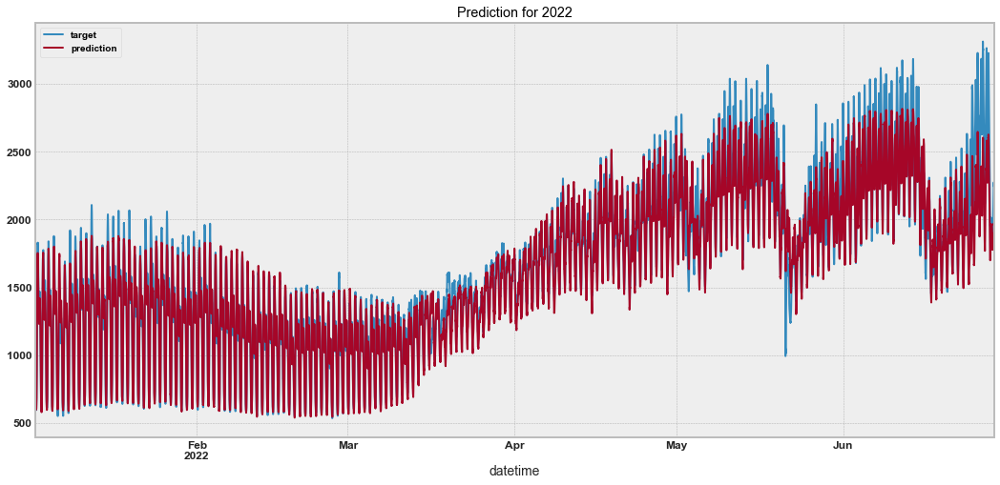

In [128]:
plt.figure(figsize=(16,8))
result.set_index('datetime').plot()
plt.title("Prediction for 2022")

The model is not performing the best in summer months.

Text(0.5, 1.0, 'Prediction for month of January 2022')

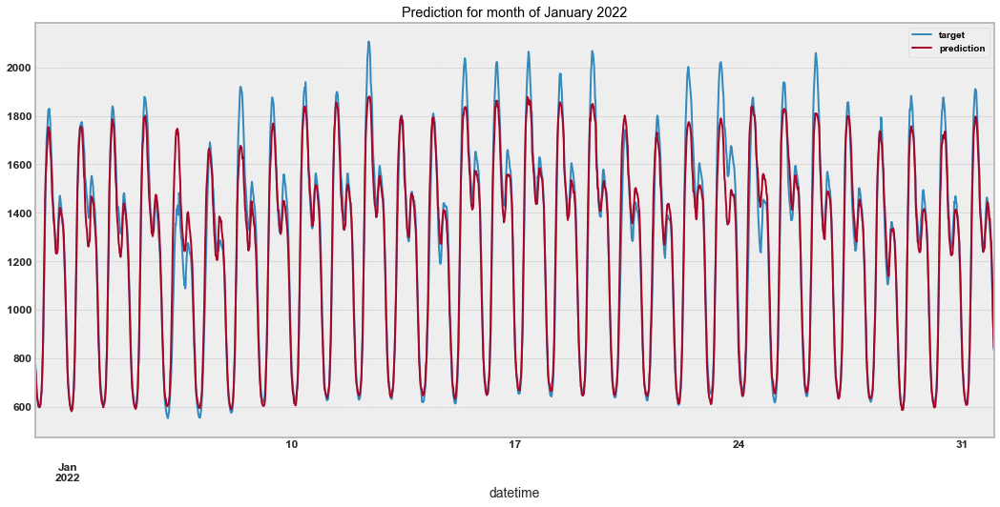

In [129]:
mask = (result.datetime<'2022-02-01 00:00:00')
result.loc[mask,:].set_index('datetime').plot()
plt.title("Prediction for month of January 2022")

Text(0.5, 1.0, 'Prediction for month of June 2022')

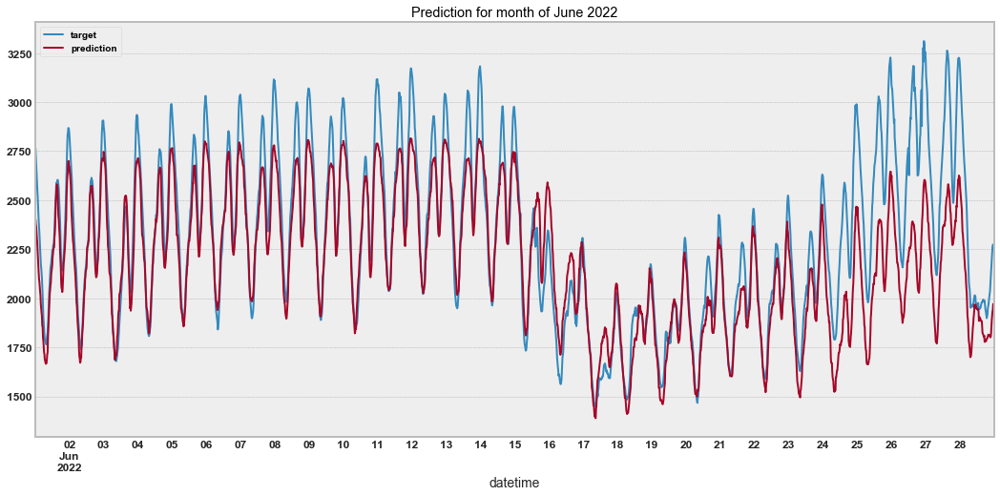

In [130]:
mask = (result.datetime>'2022-06-01 00:00:00')
result.loc[mask,:].set_index('datetime').plot()
plt.title("Prediction for month of June 2022")

## Final Model

In [226]:
validation_cutoff = '2022-06-01' # Validation Cut Off
X = data_for_training.drop('target',1).copy()
y = data_for_training[['datetime','target']].copy()
X_train = X[X['datetime'] < validation_cutoff+ ' 00:00:00'][best_features].copy()
y_train = y[y['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
X_valid = X[X['datetime']>= validation_cutoff+ ' 00:00:00'][best_features].copy()
y_valid = y[y['datetime']>= validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
print(f'X Train: {X_train.shape}')
print(f'X Validation: {X_valid.shape}')
print(f'X Train: {y_train.shape}')
print(f'X Validation: {y_valid.shape}')

X Train: (237506, 22)
X Validation: (2688, 22)
X Train: (237506, 1)
X Validation: (2688, 1)


In [227]:
param

{'metric': 'mae',
 'n_estimators': 10000,
 'lambda_l1': 95,
 'lambda_l2': 50,
 'num_leaves': 1080,
 'min_data_in_leaf': 800,
 'max_bin': 234,
 'feature_fraction': 0.4,
 'bagging_fraction': 0.5,
 'bagging_freq': 4,
 'min_gain_to_split': 8.638058635682038,
 'max_depth': 15,
 'learning_rate': 0.06515032011306694}

In [228]:
# defining parameters 
model = lgb.LGBMRegressor(objective="regression",**param)
model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],early_stopping_rounds=20,eval_metric='rmse',verbose=50)

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:726: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\akash\anaconda3\envs\yodas_python3.6\lib\site-packages\lightgbm\sklearn.py:736: UserWarning:

'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.638058635682038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.638058635682038
[LightGBM] [Warning] lambda_l1 is set=95, reg_alpha=0.0 will be ignored. Current value: lambda_l1=95
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[50]	valid_0's rmse: 220.422	valid_0's l1: 158.417
[100]	valid_0's rmse: 196.637	valid_0's l1: 140.444
[150]	valid_0's rmse: 189.542	valid_0's l1: 134.852
[200]	valid_0's r

LGBMRegressor(bagging_fraction=0.5, bagging_freq=4, feature_fraction=0.4,
              lambda_l1=95, lambda_l2=50, learning_rate=0.06515032011306694,
              max_bin=234, max_depth=15, metric='mae', min_data_in_leaf=800,
              min_gain_to_split=8.638058635682038, n_estimators=10000,
              num_leaves=1080, objective='regression')

In [229]:
# Making predictions with the tuned model
pred_train = model.predict(X_train[best_features])
pred_valid = model.predict(X_valid[best_features])
# Evaluate model accuracy 
from sklearn.metrics import mean_squared_error
print(f"Train MSE: {mean_squared_error(y_train['target'],pred_train)}")
print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train['target'],pred_train))}")
print(f"valid MSE: {mean_squared_error(y_valid['target'],pred_valid)}")
print(f"valid RMSE: {np.sqrt(mean_squared_error(y_valid['target'],pred_valid))}")

Train MSE: 4423.821065222156
Train RMSE: 66.51181147151351
valid MSE: 34973.3500906255
valid RMSE: 187.01163089665172


In [230]:
# Saving the final model
import pickle
pickle.dump(model, open(f'./lgb_2dayahead.pkl', 'wb'))

In [231]:
result = y[y['datetime'] >= validation_cutoff + ' 00:00:00'].copy()
result['prediction'] = pred_valid
result.head()

,datetime,target,prediction
237506,2022-06-01 00:00:00,2802.0,2523.159012
237507,2022-06-01 00:15:00,2765.0,2500.444236
237508,2022-06-01 00:30:00,2723.0,2475.351941
237509,2022-06-01 00:45:00,2690.0,2475.501877
237510,2022-06-01 01:00:00,2648.0,2390.082505


In [232]:
result['mse'] = (result['target']-result['prediction'])**2
result['rmse'] = result['mse'].apply(lambda x: np.sqrt(x))
result.head()

,datetime,target,prediction,mse,rmse
237506,2022-06-01 00:00:00,2802.0,2523.159012,77752.296389,278.840988
237507,2022-06-01 00:15:00,2765.0,2500.444236,69989.752323,264.555764
237508,2022-06-01 00:30:00,2723.0,2475.351941,61329.561042,247.648059
237509,2022-06-01 00:45:00,2690.0,2475.501877,46009.444855,214.498123
237510,2022-06-01 01:00:00,2648.0,2390.082505,66521.434080,257.917495


In [233]:
result =  result.reset_index()
result['date'] = result['datetime'].dt.date 
result.head()

,index,datetime,target,prediction,mse,rmse,date
0,237506,2022-06-01 00:00:00,2802.0,2523.159012,77752.296389,278.840988,2022-06-01
1,237507,2022-06-01 00:15:00,2765.0,2500.444236,69989.752323,264.555764,2022-06-01
2,237508,2022-06-01 00:30:00,2723.0,2475.351941,61329.561042,247.648059,2022-06-01
3,237509,2022-06-01 00:45:00,2690.0,2475.501877,46009.444855,214.498123,2022-06-01
4,237510,2022-06-01 01:00:00,2648.0,2390.082505,66521.434080,257.917495,2022-06-01


In [234]:
result.groupby(['date'])[['mse','rmse']].mean()

,mse,rmse
date,,
2022-06-01,12531.425090,83.545411
2022-06-02,3531.061357,47.844968
2022-06-03,5093.016308,63.257222
2022-06-04,5196.012015,58.327989
2022-06-05,4543.829692,55.199641
2022-06-06,5066.020755,59.099164
2022-06-07,8211.897701,74.095864
2022-06-08,10128.851840,85.843385
2022-06-09,7262.155103,70.994031


In [235]:
result.describe().T

,count,mean,std,min,25%,50%,75%,max
index,2688.0,238849.500000,776.103086,237506.000000,238177.750000,238849.500000,239521.250000,240193.000000
target,2688.0,2313.245443,419.216611,1447.000000,1978.015000,2279.220000,2632.442500,3311.000000
prediction,2688.0,2288.792202,340.557609,1569.445134,2016.460921,2271.006221,2559.310203,2932.889980
mse,2688.0,34973.350091,67117.420657,0.000980,1742.829347,7419.203453,32755.269315,449829.972960
rmse,2688.0,132.797894,131.698603,0.031307,41.747198,86.134798,180.984063,670.693651


Text(0.5, 1.0, 'Prediction for Validation')

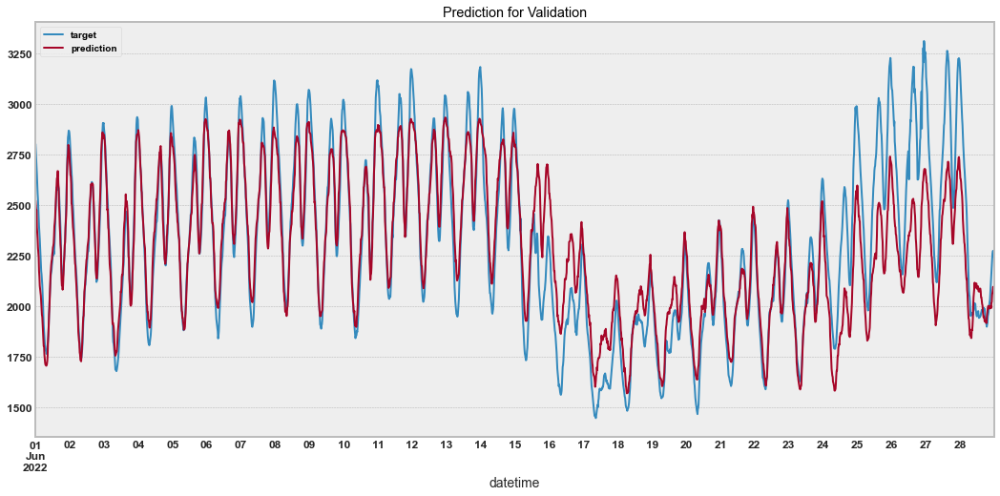

In [236]:
result.set_index('datetime')[['target','prediction']].plot()
plt.title("Prediction for Validation")

# Modelling 2

## Final Data

In [145]:
data_for_training = pd.DataFrame()
target_ahead_timeblocks = 192
features = ['datetime', 'load', 'tb', 'apparent_temperature', 'temperature',
       'humidity', 'dew_point', 'wind_speed', 'cloud_cover', 'hour', 'dom',
       'month', 'year', 'dow', 'doy', 'weekend', 'woy', 'lag1h', 'lag2h',
       'lag4h', 'lag6h', 'lag12h', 'lag1d', 'lag2d', 'lag3d', 'lag4d', 'lag5d',
       'lag6d', 'lag7d', 'load_ewm1h', 'load_ewm2h', 'load_ewm3h',
       'load_ewm4h', 'load_ewm6h', 'load_ewm8h', 'load_ewm12h', 'load_ewm24h',
       'hour_mean', 'avg_load_3d', 'avg_load_5d', 'cos_tb', 'sin_tb',
       'cos_hour', 'sin_hour', 'cos_dow', 'sin_dow', 'cos_doy', 'sin_doy',
       'apparent_temperature_mean_1h', 'apparent_temperature_mean_2h',
       'apparent_temperature_mean_4h', 'apparent_temperature_mean_6h',
       'apparent_temperature_mean_12h', 'apparent_temperature_mean_24h',
       'temperature_mean_1h', 'temperature_mean_2h', 'temperature_mean_4h',
       'temperature_mean_6h', 'temperature_mean_8h', 'temperature_mean_12h',
       'temperature_mean_24h', 'temp_ap_diff', 'dew_point_mean_1h',
       'dew_point_mean_2h', 'dew_point_mean_4h', 'dew_point_mean_6h',
       'dew_point_mean_12h', 'dew_point_mean_24h', 'humidity_mean_1h',
       'humidity_mean_2h', 'humidity_mean_4h', 'humidity_mean_6h',
       'humidity_mean_12h', 'humidity_mean_24h', 'wind_speed_mean_1h',
       'wind_speed_mean_2h', 'wind_speed_mean_4h', 'wind_speed_mean_6h',
       'wind_speed_mean_12h', 'wind_speed_mean_24h', 'saturday_odd',
       'saturday_even', 'sunday', 'friday', 'full_load_day', 'industrial_off',
       'commercial_off', 'covid', 'covid_first_wave', 'covid_second_wave']
data_for_training = data.reset_index()[features].copy()

weather_features =  [x for x in features if 'temperature' in x or 'humidity' in x or 'cloud_cover' in x or 'dew_point' in x or 'wind_speed' in x]
for i in weather_features:
    data_for_training[i] = data_for_training[i].shift(-target_ahead_timeblocks)
    
data_for_training['target'] = data_for_training['load'].shift(-target_ahead_timeblocks)
print(data_for_training.shape)
data_for_training.head()

(395137, 91)


,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave,target
0,2011-04-01 00:00:00,NaN,1,22.8700,22.8700,0.5200,12.4000,4.1900,0.4400,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997859,0.065403,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.850013,23.005579,23.893109,24.865806,26.421628,26.998497,22.850013,23.005579,23.893109,24.865806,25.598779,26.421617,26.998355,0.0,12.307907,12.210960,11.889512,11.559572,10.977191,10.802942,0.516565,0.509061,0.479075,0.448839,0.400880,0.385761,4.629056,4.686533,4.471867,4.225869,3.696529,3.221728,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,932.092
1,2011-04-01 00:15:00,NaN,2,22.7075,22.7075,0.5125,12.0475,4.1475,0.4075,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.991445,0.130526,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.793008,22.939339,23.753626,24.693142,26.269984,26.908441,22.793008,22.939339,23.753626,24.693142,25.423549,26.269973,26.908302,0.0,12.203744,12.174636,11.908099,11.598606,11.020890,10.829062,0.514939,0.509825,0.483008,0.453932,0.405438,0.388421,4.436433,4.566748,4.433706,4.219600,3.714941,3.241157,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,909.508
2,2011-04-01 00:30:00,NaN,3,22.5450,22.5450,0.5050,11.6950,4.1050,0.3750,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.980785,0.195090,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.693805,22.851708,23.611435,24.521291,26.117899,26.816898,22.693805,22.851708,23.611435,24.521290,25.249091,26.117889,26.816763,0.0,12.000246,12.068050,11.883028,11.606317,11.048413,10.847229,0.510964,0.508753,0.485595,0.458017,0.409503,0.390867,4.303860,4.464138,4.395035,4.210432,3.730867,3.259280,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,890.788
3,2011-04-01 00:45:00,NaN,4,22.3825,22.3825,0.4975,11.3425,4.0625,0.3425,1,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.965926,0.258819,0.965926,0.258819,-0.5,-0.866025,0.008583,0.999963,22.569283,22.747440,23.466854,24.350187,25.965391,26.723900,22.569283,22.747440,23.466854,24.350187,25.075357,25.965381,26.723768,0.0,11.737148,11.906817,11.819437,11.585212,11.060420,10.857616,0.505578,0.506252,0.486996,0.461176,0.413095,0.393103,4.207316,4.374885,4.355913,4.198597,3.744407,3.276125,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,878.820
4,2011-04-01 01:00:00,NaN,5,22.2200,22.2200,0.4900,10.9900,4.0200,0.3100,2,1,4,2011,4,91,0,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.946930,0.321439,0.866025,0.500000,-0.5,-0.866025,0.008583,0.999963,22.429570,22.630231,23.320165,24.179772,25.812476,26.629478,22.429570,22.630231,23.320165,24.179772,24.902304,25.812466,26.629348,0.0,11.

## Dropping Nulls

In [146]:
data_for_training.dropna(inplace=True)
data_for_training.reset_index(inplace=True,drop=True)
print(data_for_training.shape)
data_for_training.head()

(240194, 91)


,datetime,load,tb,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,hour,dom,month,year,dow,doy,weekend,woy,lag1h,lag2h,lag4h,lag6h,lag12h,lag1d,lag2d,lag3d,lag4d,lag5d,lag6d,lag7d,load_ewm1h,load_ewm2h,load_ewm3h,load_ewm4h,load_ewm6h,load_ewm8h,load_ewm12h,load_ewm24h,hour_mean,avg_load_3d,avg_load_5d,cos_tb,sin_tb,cos_hour,sin_hour,cos_dow,sin_dow,cos_doy,sin_doy,apparent_temperature_mean_1h,apparent_temperature_mean_2h,apparent_temperature_mean_4h,apparent_temperature_mean_6h,apparent_temperature_mean_12h,apparent_temperature_mean_24h,temperature_mean_1h,temperature_mean_2h,temperature_mean_4h,temperature_mean_6h,temperature_mean_8h,temperature_mean_12h,temperature_mean_24h,temp_ap_diff,dew_point_mean_1h,dew_point_mean_2h,dew_point_mean_4h,dew_point_mean_6h,dew_point_mean_12h,dew_point_mean_24h,humidity_mean_1h,humidity_mean_2h,humidity_mean_4h,humidity_mean_6h,humidity_mean_12h,humidity_mean_24h,wind_speed_mean_1h,wind_speed_mean_2h,wind_speed_mean_4h,wind_speed_mean_6h,wind_speed_mean_12h,wind_speed_mean_24h,saturday_odd,saturday_even,sunday,friday,full_load_day,industrial_off,commercial_off,covid,covid_first_wave,covid_second_wave,target
0,2011-04-09 00:00:00,960.348,1,22.830,22.830,0.60,14.540,0.8900,0.450,1,9,4,2011,5,99,0,14,1064.150,1148.82,1256.18,1195.39,1182.25,943.296,945.552,915.165,890.004,874.808,932.092,933.476,1000.153661,1043.423144,1074.590378,1096.673763,1122.865928,1134.863478,1140.008709,1126.619755,936.15900,949.732000,3942.3618,0.997859,0.065403,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.229223,23.764262,24.778683,25.529711,26.399006,26.657246,23.229223,23.764262,24.778683,25.529711,25.987797,26.399006,26.657246,0.0,13.808278,13.366467,12.927839,12.661596,12.163288,11.400318,0.560318,0.527939,0.485725,0.458473,0.423010,0.399352,1.095033,1.442187,2.046351,2.480360,3.031155,3.080865,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,914.984
1,2011-04-09 00:15:00,940.148,2,23.095,23.095,0.57,13.955,1.3375,0.525,1,9,4,2011,5,99,0,14,1051.450,1134.20,1195.70,1192.32,1175.15,924.108,928.272,901.228,878.956,852.348,909.508,917.484,976.151397,1020.473112,1053.906936,1078.258967,1108.248494,1123.062540,1131.851129,1122.774973,936.15900,930.842667,3869.5472,0.991445,0.130526,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.175534,23.615537,24.580602,25.334934,26.264148,26.583798,23.175534,23.615537,24.580602,25.334934,25.812476,26.264148,26.583798,0.0,13.866967,13.497252,13.048681,12.765068,12.236419,11.452992,0.564191,0.537286,0.495639,0.467395,0.429009,0.402870,1.192020,1.418923,1.962957,2.388931,2.962026,3.044919,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,900.024
2,2011-04-09 00:30:00,928.236,3,23.360,23.360,0.54,13.370,1.7850,0.600,1,9,4,2011,5,99,0,14,1013.700,1123.68,1202.88,1225.36,1171.76,909.443,912.628,885.772,863.988,838.044,890.788,904.468,956.985238,999.975976,1034.572946,1060.609206,1093.847494,1111.254871,1123.540307,1118.763857,936.15900,916.769000,3808.8766,0.980785,0.195090,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.249320,23.558751,24.437002,25.176940,26.145612,26.517328,23.249320,23.558751,24.437002,25.176940,25.663841,26.145612,26.517328,0.0,13.668180,13.468974,13.086484,12.813463,12.282688,11.492518,0.554514,0.537889,0.500858,0.473204,0.433539,0.405698,1.429212,1.500274,1.942021,2.340616,2.913984,3.018941,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,887.668
3,2011-04-09 00:45:00,915.904,4,23.625,23.625,0.51,12.785,2.2325,0.675,1,9,4,2011,5,99,0,14,985.120,1103.52,1158.87,1278.15,1163.74,893.728,896.980,872.256,856.256,827.100,878.820,890.156,940.552743,981.293315,1016.316185,1043.585064,1079.612015,1099.415424,1115.065356,1114.581176,936.15900,902.204000,3750.1192,0.965926,0.258819,0.965926,0.258819,0.5,-0.866025,-0.128398,0.991723,23.399592,23.573473,24.341472,25.052784,26.042730,26.457692,23.399592,23.573473,24.341472,25.052784,25.540275,26.042730,26.457692,0.0,13.314908,13.316980,13.051015,12.811186,12.303190,11.519167,0.536709,0.531691,0.501934,0.47614

## Train Validate Test Split

In [147]:
validation_cutoff = '2021-01-01' # Validation Cut Off
test_cutoff = '2022-01-01' # Test Cut Oabsff 
X = data_for_training.drop('target',1).copy()
y = data_for_training[['datetime','target']].copy()
X_train = X[X['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
y_train = y[y['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
X_valid = X[(X['datetime']>= validation_cutoff+ ' 00:00:00') & (X['datetime']< test_cutoff+ ' 00:00:00')].iloc[:,1:].copy()
y_valid = y[(y['datetime']>= validation_cutoff+ ' 00:00:00') & (y['datetime']< test_cutoff+ ' 00:00:00')].iloc[:,1:].copy()
X_test = X[X['datetime'] >= test_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
y_test = y[y['datetime'] >= test_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
print(f'X Train: {X_train.shape}')
print(f'X Validation: {X_valid.shape}')
print(f'X Test: {X_test.shape}')
print(f'X Train: {y_train.shape}')
print(f'X Validation: {y_valid.shape}')
print(f'X Test: {y_test.shape}')

X Train: (202562, 89)
X Validation: (20544, 89)
X Test: (17088, 89)
X Train: (202562, 1)
X Validation: (20544, 1)
X Test: (17088, 1)


## Feature Selection

In [148]:
import xgboost as xgb
params = {}
model = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8,booster='gbtree',
                gamma=0,alpha=0,objective='reg:squarederror')
model.fit(X_train, y_train,eval_set=[(X_valid,y_valid)],eval_metric='rmse',early_stopping_rounds=20,verbose=100)

[0]	validation_0-rmse:1444.83435
[100]	validation_0-rmse:108.27547
[200]	validation_0-rmse:106.06127
[291]	validation_0-rmse:105.85576


XGBRegressor(alpha=0, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, eta=0.1, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.100000001, max_delta_step=0, max_depth=7,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [149]:
important_features = pd.DataFrame({'features':X_train.columns,'importance':model.feature_importances_})
important_features = important_features.sort_values('importance',ascending=0).reset_index(drop=True)
important_features

,features,importance
0,avg_load_5d,0.602848
1,avg_load_3d,0.215113
2,hour_mean,0.046633
3,load,0.031325
4,apparent_temperature_mean_12h,0.015725
5,lag5d,0.012808
6,temperature_mean_12h,0.012720
7,friday,0.006452
8,temperature_mean_24h,0.004023
9,temperature_mean_8h,0.003457


In [150]:
best_features = important_features[important_features['importance']>=0.001]['features'].tolist()
best_features

['avg_load_5d',
 'avg_load_3d',
 'hour_mean',
 'load',
 'apparent_temperature_mean_12h',
 'lag5d',
 'temperature_mean_12h',
 'friday',
 'temperature_mean_24h',
 'temperature_mean_8h',
 'year',
 'cos_tb',
 'apparent_temperature_mean_24h',
 'full_load_day',
 'load_ewm1h',
 'cos_hour',
 'weekend',
 'sunday',
 'apparent_temperature',
 'cos_dow',
 'apparent_temperature_mean_1h',
 'sin_tb']

## Hyperparameter Tuning

In [207]:
import xgboost as xgb
import optuna
from sklearn.metrics import mean_squared_error

def objective(trial):
    # Hyper Parameters
    param = {
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        "lambda": trial.suggest_int("lambda", 0, 100, step=5),
        "alpha": trial.suggest_int("alpha", 0, 100, step=5),
        "gamma": trial.suggest_float("gamma", 1e-8, 1.0, log=True),
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 2, 10),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
        "max_leaves": trial.suggest_int("max_leaves", 20, 3000,step=20),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        "grow_policy": trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
    }
    
    model = xgb.XGBRegressor(n_estimators=10000,objective='reg:squarederror',**param)
    model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],eval_metric='rmse',early_stopping_rounds=20,verbose=100)
    preds = model.predict(X_valid[best_features])
    error = mean_squared_error(y_valid, preds)
    return error
 
study = optuna.create_study(direction='minimize',study_name="XGB")
study.optimize(objective, n_trials=50)
 
print('Number of finished trials:', len(study.trials))
print('Best trial:', study.best_trial.params)

[I 2022-07-25 22:18:09,295] A new study created in memory with name: XGB


[0]	validation_0-rmse:1434.42310
[100]	validation_0-rmse:117.95832
[167]	validation_0-rmse:116.93977


[I 2022-07-25 22:19:38,981] Trial 0 finished with value: 13580.225949918155 and parameters: {'booster': 'dart', 'lambda': 45, 'alpha': 20, 'gamma': 0.00016286660045184857, 'subsample': 0.7394022434022884, 'min_child_weight': 6, 'colsample_bytree': 0.41392017105941026, 'max_leaves': 860, 'max_depth': 4, 'learning_rate': 0.10845915877933986, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1253.90332
[79]	validation_0-rmse:118.27728


[I 2022-07-25 22:20:12,491] Trial 1 finished with value: 13870.62748180167 and parameters: {'booster': 'dart', 'lambda': 45, 'alpha': 35, 'gamma': 2.7460572472289746e-07, 'subsample': 0.8152048809881915, 'min_child_weight': 7, 'colsample_bytree': 0.40648921937589066, 'max_leaves': 420, 'max_depth': 5, 'learning_rate': 0.22559676468345063, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1327.46545
[74]	validation_0-rmse:118.51622


[I 2022-07-25 22:20:45,752] Trial 2 finished with value: 14017.741301699127 and parameters: {'booster': 'dart', 'lambda': 0, 'alpha': 65, 'gamma': 3.896913803989387e-07, 'subsample': 0.8491107352975555, 'min_child_weight': 9, 'colsample_bytree': 0.3550461232252804, 'max_leaves': 200, 'max_depth': 5, 'learning_rate': 0.17590862917720518, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[22:20:45] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:317.55154
[100]	validation_0-rmse:164.88779
[200]	validation_0-rmse:163.93842
[300]	validation_0-rmse:163.43654
[400]	validation_0-rmse:163.13768
[500]	validation_0-rmse:162.95020
[600]	validation_0-rmse:162.82080
[700]	validation_0-rmse:162.74098
[800]	validation_0-rmse:162.67950
[900]	validation_0-rmse:162.63173
[1000]	validation_0-rmse:162.60121
[1100]	validation_0-rmse:162.57163
[1200]	validation_0-rmse:162.55420
[1300]	validation_0-rmse:162.54011
[1400]	validation_0-rmse:162.53185
[1500]	validation_0-rmse:162

[I 2022-07-25 22:21:21,727] Trial 3 finished with value: 26411.801671807134 and parameters: {'booster': 'gblinear', 'lambda': 35, 'alpha': 10, 'gamma': 0.003539390226518731, 'subsample': 0.5316469312069403, 'min_child_weight': 8, 'colsample_bytree': 0.6646115310483525, 'max_leaves': 500, 'max_depth': 13, 'learning_rate': 0.2639922436967225, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[22:21:21] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:736.70703
[100]	validation_0-rmse:186.96654
[200]	validation_0-rmse:169.85571
[300]	validation_0-rmse:165.75009
[400]	validation_0-rmse:164.60394
[500]	validation_0-rmse:164.18004
[600]	validation_0-rmse:163.96747
[700]	validation_0-rmse:163.82840
[800]	validation_0-rmse:163.72263
[900]	validation_0-rmse:163.63571
[1000]	validation_0-rmse:163.56071
[1100]	validation_0-rmse:163.49558
[1200]	validation_0-rmse:163.43671
[1300]	validation_0-rmse:163.38295
[1400]	validation_0-rmse:163.33490
[1500]	validation_0-rmse:163

[I 2022-07-25 22:23:50,955] Trial 4 finished with value: 26474.042158422482 and parameters: {'booster': 'gblinear', 'lambda': 25, 'alpha': 10, 'gamma': 0.000118409410591284, 'subsample': 0.5951267692560697, 'min_child_weight': 9, 'colsample_bytree': 0.6261369058860766, 'max_leaves': 2500, 'max_depth': 5, 'learning_rate': 0.05096147602805933, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1286.30237
[46]	validation_0-rmse:128.10066


[I 2022-07-25 22:24:07,885] Trial 5 finished with value: 16032.322589399717 and parameters: {'booster': 'gbtree', 'lambda': 15, 'alpha': 35, 'gamma': 5.592675527281418e-05, 'subsample': 0.8953561904271019, 'min_child_weight': 9, 'colsample_bytree': 0.9676042301188523, 'max_leaves': 2880, 'max_depth': 8, 'learning_rate': 0.20230525046945355, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1391.19495
[91]	validation_0-rmse:118.87631


[I 2022-07-25 22:24:54,862] Trial 6 finished with value: 13991.276875856985 and parameters: {'booster': 'dart', 'lambda': 60, 'alpha': 80, 'gamma': 1.235078827041731e-08, 'subsample': 0.6960855985028314, 'min_child_weight': 10, 'colsample_bytree': 0.7131326447903279, 'max_leaves': 740, 'max_depth': 4, 'learning_rate': 0.13718223096834206, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1525.74890
[100]	validation_0-rmse:128.74870
[200]	validation_0-rmse:121.24908
[260]	validation_0-rmse:120.58171


[I 2022-07-25 22:25:17,864] Trial 7 finished with value: 14511.578485268295 and parameters: {'booster': 'gbtree', 'lambda': 40, 'alpha': 5, 'gamma': 6.75378726751036e-05, 'subsample': 0.32053978207084777, 'min_child_weight': 3, 'colsample_bytree': 0.9157298942148968, 'max_leaves': 600, 'max_depth': 3, 'learning_rate': 0.04923425467661543, 'grow_policy': 'depthwise'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1320.22437
[70]	validation_0-rmse:118.50635


[I 2022-07-25 22:25:47,675] Trial 8 finished with value: 13625.70053058792 and parameters: {'booster': 'dart', 'lambda': 30, 'alpha': 55, 'gamma': 6.518725734240574e-05, 'subsample': 0.42951411048906873, 'min_child_weight': 7, 'colsample_bytree': 0.6390550059170748, 'max_leaves': 2600, 'max_depth': 6, 'learning_rate': 0.18278712174602707, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 13580.225949918155.


[22:25:47] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:279.69028
[100]	validation_0-rmse:166.41356
[200]	validation_0-rmse:165.41460
[300]	validation_0-rmse:164.99251
[400]	validation_0-rmse:164.69653
[500]	validation_0-rmse:164.48018
[600]	validation_0-rmse:164.31642
[700]	validation_0-rmse:164.19325
[800]	validation_0-rmse:164.09764
[900]	validation_0-rmse:164.02220
[1000]	validation_0-rmse:163.96095
[1100]	validation_0-rmse:163.91138
[1200]	validation_0-rmse:163.87103
[1300]	validation_0-rmse:163.83765
[1400]	validation_0-rmse:163.81026
[1500]	validation_0-rmse:163

[I 2022-07-25 22:26:33,561] Trial 9 finished with value: 26790.906234348156 and parameters: {'booster': 'gblinear', 'lambda': 90, 'alpha': 80, 'gamma': 0.0005530849479256694, 'subsample': 0.6842512000875329, 'min_child_weight': 4, 'colsample_bytree': 0.4296746968580325, 'max_leaves': 1080, 'max_depth': 5, 'learning_rate': 0.16292467539679098, 'grow_policy': 'lossguide'}. Best is trial 0 with value: 13580.225949918155.


[0]	validation_0-rmse:1442.22888
[100]	validation_0-rmse:117.87785
[200]	validation_0-rmse:115.82310
[228]	validation_0-rmse:115.98848


[I 2022-07-25 22:31:19,155] Trial 10 finished with value: 13375.395475637353 and parameters: {'booster': 'dart', 'lambda': 70, 'alpha': 30, 'gamma': 0.2189802382120057, 'subsample': 0.20374717887519872, 'min_child_weight': 5, 'colsample_bytree': 0.21093924988823992, 'max_leaves': 1780, 'max_depth': 12, 'learning_rate': 0.10415626264972885, 'grow_policy': 'lossguide'}. Best is trial 10 with value: 13375.395475637353.


[0]	validation_0-rmse:1437.06738
[100]	validation_0-rmse:117.33470
[127]	validation_0-rmse:116.68536


[I 2022-07-25 22:32:48,451] Trial 11 finished with value: 13605.923352556707 and parameters: {'booster': 'dart', 'lambda': 70, 'alpha': 30, 'gamma': 0.9453536747592501, 'subsample': 0.23244709867246993, 'min_child_weight': 5, 'colsample_bytree': 0.20142526154296547, 'max_leaves': 1760, 'max_depth': 13, 'learning_rate': 0.10749195275410492, 'grow_policy': 'lossguide'}. Best is trial 10 with value: 13375.395475637353.


[0]	validation_0-rmse:1453.40552
[100]	validation_0-rmse:115.25588
[132]	validation_0-rmse:114.96294


[I 2022-07-25 22:34:31,527] Trial 12 finished with value: 13184.509916250317 and parameters: {'booster': 'dart', 'lambda': 80, 'alpha': 25, 'gamma': 0.944345679307178, 'subsample': 0.45558347008497724, 'min_child_weight': 2, 'colsample_bytree': 0.2427608083681091, 'max_leaves': 1760, 'max_depth': 10, 'learning_rate': 0.09650235423122146, 'grow_policy': 'lossguide'}. Best is trial 12 with value: 13184.509916250317.


[0]	validation_0-rmse:1462.45654
[100]	validation_0-rmse:119.41532
[200]	validation_0-rmse:114.65710
[229]	validation_0-rmse:114.67645


[I 2022-07-25 22:38:50,980] Trial 13 finished with value: 13120.055033570516 and parameters: {'booster': 'dart', 'lambda': 100, 'alpha': 50, 'gamma': 0.6368904405616895, 'subsample': 0.20348775550895504, 'min_child_weight': 2, 'colsample_bytree': 0.20894927096234062, 'max_leaves': 1800, 'max_depth': 11, 'learning_rate': 0.09118670601226274, 'grow_policy': 'lossguide'}. Best is trial 13 with value: 13120.055033570516.


[0]	validation_0-rmse:1558.75403
[100]	validation_0-rmse:178.28917
[200]	validation_0-rmse:120.33758
[300]	validation_0-rmse:114.67596
[400]	validation_0-rmse:113.44756
[421]	validation_0-rmse:113.59383


[I 2022-07-25 22:53:22,943] Trial 14 finished with value: 12861.146695674724 and parameters: {'booster': 'dart', 'lambda': 100, 'alpha': 50, 'gamma': 0.0162939275124663, 'subsample': 0.43247218823816336, 'min_child_weight': 2, 'colsample_bytree': 0.29028733990225464, 'max_leaves': 1360, 'max_depth': 10, 'learning_rate': 0.02800408076918595, 'grow_policy': 'lossguide'}. Best is trial 14 with value: 12861.146695674724.


[0]	validation_0-rmse:1559.65039
[100]	validation_0-rmse:183.28120
[200]	validation_0-rmse:119.81221
[300]	validation_0-rmse:113.71182
[371]	validation_0-rmse:112.73986


[I 2022-07-25 22:54:42,151] Trial 15 finished with value: 12705.161006331045 and parameters: {'booster': 'gbtree', 'lambda': 100, 'alpha': 100, 'gamma': 0.022916001064846096, 'subsample': 0.3530777209820734, 'min_child_weight': 2, 'colsample_bytree': 0.32534269575612074, 'max_leaves': 1380, 'max_depth': 15, 'learning_rate': 0.027433908649580622, 'grow_policy': 'lossguide'}. Best is trial 15 with value: 12705.161006331045.


[0]	validation_0-rmse:1582.74402
[100]	validation_0-rmse:498.65036
[200]	validation_0-rmse:201.25282
[300]	validation_0-rmse:136.79033
[400]	validation_0-rmse:122.57879
[500]	validation_0-rmse:118.79552
[600]	validation_0-rmse:118.14307
[604]	validation_0-rmse:118.12997


[I 2022-07-25 22:58:11,539] Trial 16 finished with value: 13937.780812850948 and parameters: {'booster': 'gbtree', 'lambda': 100, 'alpha': 95, 'gamma': 0.01994035009445825, 'subsample': 0.9969536007562075, 'min_child_weight': 3, 'colsample_bytree': 0.5161228559820559, 'max_leaves': 1340, 'max_depth': 15, 'learning_rate': 0.012359367461328744, 'grow_policy': 'lossguide'}. Best is trial 15 with value: 12705.161006331045.


[0]	validation_0-rmse:1585.54028
[100]	validation_0-rmse:595.34570
[200]	validation_0-rmse:260.18704
[300]	validation_0-rmse:159.35467
[400]	validation_0-rmse:130.82797
[500]	validation_0-rmse:120.73473
[600]	validation_0-rmse:116.35232
[700]	validation_0-rmse:114.24087
[800]	validation_0-rmse:112.85469
[900]	validation_0-rmse:112.30196
[958]	validation_0-rmse:112.19520


[I 2022-07-25 23:01:06,337] Trial 17 finished with value: 12585.65197185966 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 100, 'gamma': 0.029901304911733952, 'subsample': 0.3480722298229566, 'min_child_weight': 3, 'colsample_bytree': 0.30998963574565114, 'max_leaves': 2220, 'max_depth': 15, 'learning_rate': 0.010624812247337828, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1521.51184
[100]	validation_0-rmse:122.02013
[176]	validation_0-rmse:117.08988


[I 2022-07-25 23:01:46,204] Trial 18 finished with value: 13644.619689469859 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 95, 'gamma': 0.03986226590032356, 'subsample': 0.3335827099929957, 'min_child_weight': 4, 'colsample_bytree': 0.4887051835774441, 'max_leaves': 2160, 'max_depth': 15, 'learning_rate': 0.052692901433759695, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1496.04224
[100]	validation_0-rmse:121.27145
[126]	validation_0-rmse:121.23223


[I 2022-07-25 23:02:25,185] Trial 19 finished with value: 14606.43313061506 and parameters: {'booster': 'gbtree', 'lambda': 65, 'alpha': 100, 'gamma': 0.0014069635911698015, 'subsample': 0.3300382248398607, 'min_child_weight': 3, 'colsample_bytree': 0.7867435745068188, 'max_leaves': 2260, 'max_depth': 14, 'learning_rate': 0.06879118895759173, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1584.91711
[100]	validation_0-rmse:572.92688
[200]	validation_0-rmse:240.11223
[300]	validation_0-rmse:149.77998
[400]	validation_0-rmse:126.38038
[500]	validation_0-rmse:119.57111
[600]	validation_0-rmse:117.55855
[638]	validation_0-rmse:117.30338


[I 2022-07-25 23:05:18,732] Trial 20 finished with value: 13753.086993410592 and parameters: {'booster': 'gbtree', 'lambda': 80, 'alpha': 80, 'gamma': 0.06883607308464545, 'subsample': 0.5467650628918854, 'min_child_weight': 4, 'colsample_bytree': 0.5455674736483827, 'max_leaves': 2080, 'max_depth': 13, 'learning_rate': 0.01090711877027883, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1558.09802
[100]	validation_0-rmse:176.02087
[200]	validation_0-rmse:118.93657
[300]	validation_0-rmse:113.85725
[400]	validation_0-rmse:112.36443
[413]	validation_0-rmse:112.31942


[I 2022-07-25 23:06:15,074] Trial 21 finished with value: 12610.709489949439 and parameters: {'booster': 'gbtree', 'lambda': 95, 'alpha': 65, 'gamma': 0.007734563838963192, 'subsample': 0.4312006262956418, 'min_child_weight': 2, 'colsample_bytree': 0.3115430109970161, 'max_leaves': 1160, 'max_depth': 9, 'learning_rate': 0.028419099396451288, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1545.83606
[100]	validation_0-rmse:139.85756
[200]	validation_0-rmse:114.78330
[300]	validation_0-rmse:112.78146
[371]	validation_0-rmse:112.70209


[I 2022-07-25 23:07:05,429] Trial 22 finished with value: 12643.62674191801 and parameters: {'booster': 'gbtree', 'lambda': 90, 'alpha': 85, 'gamma': 0.004801909358947077, 'subsample': 0.38936763927670565, 'min_child_weight': 2, 'colsample_bytree': 0.32658794175172523, 'max_leaves': 1080, 'max_depth': 9, 'learning_rate': 0.03642255304908355, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1497.66028
[100]	validation_0-rmse:118.48916
[200]	validation_0-rmse:114.81551
[209]	validation_0-rmse:114.82816


[I 2022-07-25 23:07:32,345] Trial 23 finished with value: 13174.970593516593 and parameters: {'booster': 'gbtree', 'lambda': 90, 'alpha': 70, 'gamma': 0.006813571798307498, 'subsample': 0.4851358257655338, 'min_child_weight': 3, 'colsample_bytree': 0.29509968040674434, 'max_leaves': 1120, 'max_depth': 8, 'learning_rate': 0.06772110535805699, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1545.34851
[100]	validation_0-rmse:139.86992
[200]	validation_0-rmse:115.22856
[300]	validation_0-rmse:113.45502
[310]	validation_0-rmse:113.37872


[I 2022-07-25 23:08:09,069] Trial 24 finished with value: 12825.080499859805 and parameters: {'booster': 'gbtree', 'lambda': 75, 'alpha': 85, 'gamma': 6.272315379034682e-06, 'subsample': 0.38359364942636787, 'min_child_weight': 2, 'colsample_bytree': 0.35812270404178603, 'max_leaves': 1020, 'max_depth': 8, 'learning_rate': 0.03668200061764628, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1392.16577
[87]	validation_0-rmse:120.12706


[I 2022-07-25 23:08:20,722] Trial 25 finished with value: 14185.356428045798 and parameters: {'booster': 'gbtree', 'lambda': 55, 'alpha': 65, 'gamma': 0.0013544550839309447, 'subsample': 0.2753644935368902, 'min_child_weight': 5, 'colsample_bytree': 0.45979259205975326, 'max_leaves': 1540, 'max_depth': 9, 'learning_rate': 0.1364793101661997, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1482.19031
[100]	validation_0-rmse:118.25809
[139]	validation_0-rmse:117.43572


[I 2022-07-25 23:08:40,448] Trial 26 finished with value: 13707.004540703509 and parameters: {'booster': 'gbtree', 'lambda': 90, 'alpha': 90, 'gamma': 0.10143607190834344, 'subsample': 0.4028265686607397, 'min_child_weight': 3, 'colsample_bytree': 0.5584745270217463, 'max_leaves': 2940, 'max_depth': 7, 'learning_rate': 0.07790164487141944, 'grow_policy': 'lossguide'}. Best is trial 17 with value: 12585.65197185966.


[0]	validation_0-rmse:1554.97913
[100]	validation_0-rmse:162.74313
[200]	validation_0-rmse:116.80397
[300]	validation_0-rmse:112.50794
[400]	validation_0-rmse:111.60841
[422]	validation_0-rmse:111.65253


[I 2022-07-25 23:09:52,639] Trial 27 finished with value: 12449.090384055566 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 70, 'gamma': 0.005821445258897732, 'subsample': 0.5122379469820884, 'min_child_weight': 4, 'colsample_bytree': 0.2712536635199714, 'max_leaves': 100, 'max_depth': 11, 'learning_rate': 0.03038677866807267, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1149.49353
[76]	validation_0-rmse:116.56816


[I 2022-07-25 23:10:06,641] Trial 28 finished with value: 13119.01128106897 and parameters: {'booster': 'gbtree', 'lambda': 80, 'alpha': 70, 'gamma': 0.0005609158907366683, 'subsample': 0.5144072118193527, 'min_child_weight': 4, 'colsample_bytree': 0.27141440865930516, 'max_leaves': 140, 'max_depth': 11, 'learning_rate': 0.29471849831978747, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[23:10:06] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:290.70416
[100]	validation_0-rmse:167.20860
[200]	validation_0-rmse:164.89226
[300]	validation_0-rmse:164.51067
[400]	validation_0-rmse:164.25746
[500]	validation_0-rmse:164.06607
[600]	validation_0-rmse:163.91545
[700]	validation_0-rmse:163.79125
[800]	validation_0-rmse:163.69481
[900]	validation_0-rmse:163.61868
[1000]	validation_0-rmse:163.55226
[1100]	validation_0-rmse:163.49716
[1200]	validation_0-rmse:163.45082
[1300]	validation_0-rmse:163.41084
[1400]	validation_0-rmse:163.37727
[1500]	validation_0-rmse:163

[I 2022-07-25 23:11:11,057] Trial 29 finished with value: 26621.017785316453 and parameters: {'booster': 'gblinear', 'lambda': 55, 'alpha': 55, 'gamma': 0.1967750769488654, 'subsample': 0.588895921968728, 'min_child_weight': 6, 'colsample_bytree': 0.38019760109327627, 'max_leaves': 780, 'max_depth': 11, 'learning_rate': 0.1252193600796928, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1476.00867
[100]	validation_0-rmse:117.93755
[129]	validation_0-rmse:118.29652


[I 2022-07-25 23:11:43,703] Trial 30 finished with value: 13843.654313498382 and parameters: {'booster': 'gbtree', 'lambda': 70, 'alpha': 45, 'gamma': 0.000585393634716848, 'subsample': 0.6377532300886393, 'min_child_weight': 5, 'colsample_bytree': 0.4378939974433361, 'max_leaves': 300, 'max_depth': 12, 'learning_rate': 0.08154357870980092, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1548.38330
[100]	validation_0-rmse:143.73347
[200]	validation_0-rmse:115.27254
[300]	validation_0-rmse:113.46910
[310]	validation_0-rmse:113.40603


[I 2022-07-25 23:12:28,587] Trial 31 finished with value: 12851.37319320114 and parameters: {'booster': 'gbtree', 'lambda': 90, 'alpha': 75, 'gamma': 0.0037107360187729195, 'subsample': 0.4937489883271139, 'min_child_weight': 3, 'colsample_bytree': 0.32263658088384967, 'max_leaves': 940, 'max_depth': 9, 'learning_rate': 0.03469753035350845, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1575.41528
[100]	validation_0-rmse:345.72730
[200]	validation_0-rmse:150.43076
[300]	validation_0-rmse:123.77143
[400]	validation_0-rmse:117.51931
[500]	validation_0-rmse:114.99306
[600]	validation_0-rmse:113.56544
[684]	validation_0-rmse:112.93343


[I 2022-07-25 23:13:37,092] Trial 32 finished with value: 12750.82837224734 and parameters: {'booster': 'gbtree', 'lambda': 95, 'alpha': 90, 'gamma': 0.008001610127524948, 'subsample': 0.3893463684313688, 'min_child_weight': 2, 'colsample_bytree': 0.26025500420885644, 'max_leaves': 1200, 'max_depth': 7, 'learning_rate': 0.01713643621775712, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1524.12927
[100]	validation_0-rmse:124.26480
[200]	validation_0-rmse:115.24800
[261]	validation_0-rmse:115.33144


[I 2022-07-25 23:14:16,108] Trial 33 finished with value: 13212.671789584978 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 60, 'gamma': 1.1758727791195104e-05, 'subsample': 0.2738448949024749, 'min_child_weight': 4, 'colsample_bytree': 0.38152906306443346, 'max_leaves': 1520, 'max_depth': 10, 'learning_rate': 0.05064832108963397, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1544.70752
[100]	validation_0-rmse:138.56087
[200]	validation_0-rmse:115.85754
[300]	validation_0-rmse:113.87530
[310]	validation_0-rmse:113.85128


[I 2022-07-25 23:14:54,642] Trial 34 finished with value: 12939.709898148334 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 85, 'gamma': 0.002889595731688087, 'subsample': 0.4634307793191594, 'min_child_weight': 3, 'colsample_bytree': 0.3342163740355885, 'max_leaves': 620, 'max_depth': 7, 'learning_rate': 0.03709020317704219, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1506.27026
[100]	validation_0-rmse:118.05701
[162]	validation_0-rmse:116.49859


[I 2022-07-25 23:15:21,600] Trial 35 finished with value: 13383.76591107216 and parameters: {'booster': 'gbtree', 'lambda': 75, 'alpha': 70, 'gamma': 0.010444345832246375, 'subsample': 0.5538877401942374, 'min_child_weight': 2, 'colsample_bytree': 0.41215993020907093, 'max_leaves': 340, 'max_depth': 9, 'learning_rate': 0.06198716565525303, 'grow_policy': 'depthwise'}. Best is trial 27 with value: 12449.090384055566.


[23:15:21] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:307.06827
[100]	validation_0-rmse:165.52483
[200]	validation_0-rmse:164.75458
[300]	validation_0-rmse:164.32941
[400]	validation_0-rmse:164.06053
[500]	validation_0-rmse:163.87643
[600]	validation_0-rmse:163.75992
[700]	validation_0-rmse:163.67223
[800]	validation_0-rmse:163.60996
[900]	validation_0-rmse:163.56223
[1000]	validation_0-rmse:163.52666
[1100]	validation_0-rmse:163.50035
[1200]	validation_0-rmse:163.47994
[1300]	validation_0-rmse:163.46443
[1400]	validation_0-rmse:163.45271
[1500]	validation_0-rmse:163

[I 2022-07-25 23:15:49,465] Trial 36 finished with value: 26711.729654402017 and parameters: {'booster': 'gblinear', 'lambda': 95, 'alpha': 65, 'gamma': 0.04489125200547714, 'subsample': 0.28892922514364666, 'min_child_weight': 6, 'colsample_bytree': 0.2545435389203426, 'max_leaves': 60, 'max_depth': 12, 'learning_rate': 0.24837523742561063, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1562.06555
[100]	validation_0-rmse:190.30865
[200]	validation_0-rmse:118.49246
[300]	validation_0-rmse:114.45666
[400]	validation_0-rmse:114.06872
[412]	validation_0-rmse:114.13835


[I 2022-07-25 23:17:54,447] Trial 37 finished with value: 12999.873057617426 and parameters: {'booster': 'gbtree', 'lambda': 10, 'alpha': 75, 'gamma': 0.00024406694404844213, 'subsample': 0.8073795692042883, 'min_child_weight': 3, 'colsample_bytree': 0.31025436275087903, 'max_leaves': 2500, 'max_depth': 14, 'learning_rate': 0.025468046081951787, 'grow_policy': 'depthwise'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1531.61572
[100]	validation_0-rmse:123.84180
[200]	validation_0-rmse:114.64611
[214]	validation_0-rmse:114.55332


[I 2022-07-25 23:18:20,105] Trial 38 finished with value: 13116.165538879559 and parameters: {'booster': 'gbtree', 'lambda': 45, 'alpha': 90, 'gamma': 0.18603032269681988, 'subsample': 0.36864845217825304, 'min_child_weight': 4, 'colsample_bytree': 0.3801981340782155, 'max_leaves': 2000, 'max_depth': 8, 'learning_rate': 0.04547136995711608, 'grow_policy': 'depthwise'}. Best is trial 27 with value: 12449.090384055566.


[23:18:20] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:1395.10388
[100]	validation_0-rmse:221.26019
[200]	validation_0-rmse:205.87315
[300]	validation_0-rmse:194.55148
[400]	validation_0-rmse:186.30850
[500]	validation_0-rmse:180.35005
[600]	validation_0-rmse:176.06255
[700]	validation_0-rmse:172.98418
[800]	validation_0-rmse:170.77231
[900]	validation_0-rmse:169.17960
[1000]	validation_0-rmse:168.02826
[1100]	validation_0-rmse:167.19086
[1200]	validation_0-rmse:166.57718
[1300]	validation_0-rmse:166.12337
[1400]	validation_0-rmse:165.78422
[1500]	validation_0-rmse:16

[I 2022-07-25 23:21:14,774] Trial 39 finished with value: 26810.557687541987 and parameters: {'booster': 'gblinear', 'lambda': 95, 'alpha': 40, 'gamma': 0.0016836828646141925, 'subsample': 0.6186305534667362, 'min_child_weight': 7, 'colsample_bytree': 0.8297618647011686, 'max_leaves': 2640, 'max_depth': 10, 'learning_rate': 0.010141395563008963, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1286.43066
[53]	validation_0-rmse:118.09557


[I 2022-07-25 23:21:21,483] Trial 40 finished with value: 13832.173109674348 and parameters: {'booster': 'gbtree', 'lambda': 60, 'alpha': 60, 'gamma': 1.8519866159484282e-05, 'subsample': 0.43132028674176714, 'min_child_weight': 2, 'colsample_bytree': 0.478970284871317, 'max_leaves': 860, 'max_depth': 6, 'learning_rate': 0.20497282695846897, 'grow_policy': 'depthwise'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1557.92078
[100]	validation_0-rmse:176.01129
[200]	validation_0-rmse:119.04582
[300]	validation_0-rmse:113.73289
[371]	validation_0-rmse:112.80082


[I 2022-07-25 23:22:29,865] Trial 41 finished with value: 12721.070907309602 and parameters: {'booster': 'gbtree', 'lambda': 100, 'alpha': 100, 'gamma': 0.020535850661283186, 'subsample': 0.3418500043378664, 'min_child_weight': 2, 'colsample_bytree': 0.34139411928930297, 'max_leaves': 1320, 'max_depth': 14, 'learning_rate': 0.02856646676559792, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1506.44043
[100]	validation_0-rmse:118.44398
[200]	validation_0-rmse:112.96790
[218]	validation_0-rmse:113.11674


[I 2022-07-25 23:23:12,971] Trial 42 finished with value: 12750.792108310674 and parameters: {'booster': 'gbtree', 'lambda': 95, 'alpha': 100, 'gamma': 0.0054956795839087216, 'subsample': 0.3582474581666967, 'min_child_weight': 2, 'colsample_bytree': 0.294270827689005, 'max_leaves': 1580, 'max_depth': 15, 'learning_rate': 0.062141981461575554, 'grow_policy': 'lossguide'}. Best is trial 27 with value: 12449.090384055566.


[0]	validation_0-rmse:1566.72168
[100]	validation_0-rmse:235.87923
[200]	validation_0-rmse:127.88338
[300]	validation_0-rmse:116.19971
[400]	validation_0-rmse:113.04916
[500]	validation_0-rmse:111.95403
[600]	validation_0-rmse:111.47975
[643]	validation_0-rmse:111.42191


[I 2022-07-25 23:25:06,010] Trial 43 finished with value: 12412.184859343859 and parameters: {'booster': 'gbtree', 'lambda': 85, 'alpha': 85, 'gamma': 4.1153990833119584e-07, 'subsample': 0.29665940960083587, 'min_child_weight': 3, 'colsample_bytree': 0.24447955036645735, 'max_leaves': 500, 'max_depth': 13, 'learning_rate': 0.02282443614763537, 'grow_policy': 'lossguide'}. Best is trial 43 with value: 12412.184859343859.


[0]	validation_0-rmse:1535.28601
[100]	validation_0-rmse:128.56328
[200]	validation_0-rmse:112.38065
[300]	validation_0-rmse:110.83694
[338]	validation_0-rmse:110.74993


[I 2022-07-25 23:26:01,650] Trial 44 finished with value: 12252.306835960013 and parameters: {'booster': 'gbtree', 'lambda': 75, 'alpha': 75, 'gamma': 1.1587611214591312e-08, 'subsample': 0.29386103484573106, 'min_child_weight': 3, 'colsample_bytree': 0.24708338769558064, 'max_leaves': 520, 'max_depth': 13, 'learning_rate': 0.04330637646827163, 'grow_policy': 'lossguide'}. Best is trial 44 with value: 12252.306835960013.


[0]	validation_0-rmse:1528.08350
[100]	validation_0-rmse:124.58266
[200]	validation_0-rmse:112.64156
[300]	validation_0-rmse:111.74550
[339]	validation_0-rmse:111.65308


[I 2022-07-25 23:26:54,348] Trial 45 finished with value: 12457.618054445531 and parameters: {'booster': 'gbtree', 'lambda': 75, 'alpha': 80, 'gamma': 7.515007439889551e-08, 'subsample': 0.28854601867587415, 'min_child_weight': 8, 'colsample_bytree': 0.23836353729454396, 'max_leaves': 520, 'max_depth': 13, 'learning_rate': 0.04801241107943356, 'grow_policy': 'lossguide'}. Best is trial 44 with value: 12252.306835960013.


[0]	validation_0-rmse:1475.37610
[100]	validation_0-rmse:116.86813
[200]	validation_0-rmse:112.59028
[246]	validation_0-rmse:112.52711


[I 2022-07-25 23:27:26,742] Trial 46 finished with value: 12590.840845930788 and parameters: {'booster': 'gbtree', 'lambda': 75, 'alpha': 75, 'gamma': 1.5141660641010455e-08, 'subsample': 0.23014050875813874, 'min_child_weight': 9, 'colsample_bytree': 0.21563536237716988, 'max_leaves': 460, 'max_depth': 13, 'learning_rate': 0.08249809862236901, 'grow_policy': 'lossguide'}. Best is trial 44 with value: 12252.306835960013.


[23:27:26] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "colsample_bytree", "gamma", "grow_policy", "max_depth", "max_leaves", "min_child_weight", "subsample" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	validation_0-rmse:764.67511
[100]	validation_0-rmse:183.22636
[200]	validation_0-rmse:168.58342
[300]	validation_0-rmse:165.77373
[400]	validation_0-rmse:165.15268
[500]	validation_0-rmse:164.93630
[600]	validation_0-rmse:164.80733
[700]	validation_0-rmse:164.70474
[800]	validation_0-rmse:164.61433
[900]	validation_0-rmse:164.53404
[1000]	validation_0-rmse:164.46245
[1100]	validation_0-rmse:164.39792
[1200]	validation_0-rmse:164.33962
[1300]	validation_0-rmse:164.28683
[1400]	validation_0-rmse:164.23877
[1500]	validation_0-rmse:164

[I 2022-07-25 23:29:56,614] Trial 47 finished with value: 26756.427546745363 and parameters: {'booster': 'gblinear', 'lambda': 65, 'alpha': 80, 'gamma': 4.895958402475703e-08, 'subsample': 0.29201188585400845, 'min_child_weight': 10, 'colsample_bytree': 0.23366167010788713, 'max_leaves': 640, 'max_depth': 13, 'learning_rate': 0.04979073412510755, 'grow_policy': 'lossguide'}. Best is trial 44 with value: 12252.306835960013.


[0]	validation_0-rmse:1410.09949
[100]	validation_0-rmse:114.99605
[107]	validation_0-rmse:114.87659


[I 2022-07-25 23:30:12,383] Trial 48 finished with value: 13062.682978583642 and parameters: {'booster': 'gbtree', 'lambda': 80, 'alpha': 95, 'gamma': 6.132645312509607e-07, 'subsample': 0.24019382385321178, 'min_child_weight': 8, 'colsample_bytree': 0.25541691181828324, 'max_leaves': 240, 'max_depth': 14, 'learning_rate': 0.12514986077861026, 'grow_policy': 'lossguide'}. Best is trial 44 with value: 12252.306835960013.


[0]	validation_0-rmse:1568.36560
[100]	validation_0-rmse:254.77391
[200]	validation_0-rmse:133.96219
[300]	validation_0-rmse:120.12957
[400]	validation_0-rmse:115.91496
[500]	validation_0-rmse:114.58702
[600]	validation_0-rmse:114.19637
[606]	validation_0-rmse:114.15939


[I 2022-07-26 00:02:55,681] Trial 49 finished with value: 13030.968977418926 and parameters: {'booster': 'dart', 'lambda': 65, 'alpha': 15, 'gamma': 1.1897988231783078e-07, 'subsample': 0.3051429058045607, 'min_child_weight': 5, 'colsample_bytree': 0.20101383533146028, 'max_leaves': 20, 'max_depth': 12, 'learning_rate': 0.02171650864435455, 'grow_policy': 'depthwise'}. Best is trial 44 with value: 12252.306835960013.


Number of finished trials: 50
Best trial: {'booster': 'gbtree', 'lambda': 75, 'alpha': 75, 'gamma': 1.1587611214591312e-08, 'subsample': 0.29386103484573106, 'min_child_weight': 3, 'colsample_bytree': 0.24708338769558064, 'max_leaves': 520, 'max_depth': 13, 'learning_rate': 0.04330637646827163, 'grow_policy': 'lossguide'}


In [208]:
study.best_params

{'booster': 'gbtree',
 'lambda': 75,
 'alpha': 75,
 'gamma': 1.1587611214591312e-08,
 'subsample': 0.29386103484573106,
 'min_child_weight': 3,
 'colsample_bytree': 0.24708338769558064,
 'max_leaves': 520,
 'max_depth': 13,
 'learning_rate': 0.04330637646827163,
 'grow_policy': 'lossguide'}

In [152]:
param = study.best_params
model = xgb.XGBRegressor(n_estimators=10000,objective='reg:squarederror',**param)
model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],eval_metric='rmse',early_stopping_rounds=20,verbose=100)

[0]	validation_0-rmse:1535.28601
[100]	validation_0-rmse:128.56328
[200]	validation_0-rmse:112.38065
[300]	validation_0-rmse:110.83694
[339]	validation_0-rmse:110.72965


XGBRegressor(alpha=75, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.24708338769558064,
             gamma=1.1587611214591312e-08, gpu_id=-1, grow_policy='lossguide',
             importance_type='gain', interaction_constraints='', lambda=75,
             learning_rate=0.04330637646827163, max_delta_step=0, max_depth=13,
             max_leaves=520, min_child_weight=3, missing=nan,
             monotone_constraints='()', n_estimators=10000, n_jobs=8,
             num_parallel_tree=1, random_state=0, reg_alpha=75, reg_lambda=75,
             scale_pos_weight=1, subsample=0.29386103484573106,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [153]:
# Making predictions with the tuned model
pred_train = model.predict(X_train[best_features])
pred_valid = model.predict(X_valid[best_features])
pred_test = model.predict(X_test[best_features])

In [154]:
# Evaluate model accuracy 
from sklearn.metrics import mean_squared_error
print(f"Train MSE: {mean_squared_error(y_train['target'],pred_train)}")
print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train['target'],pred_train))}")
print(f"valid MSE: {mean_squared_error(y_valid['target'],pred_valid)}")
print(f"valid RMSE: {np.sqrt(mean_squared_error(y_valid['target'],pred_valid))}")
print(f"Test MSE: {mean_squared_error(y_test['target'],pred_test)}")
print(f"Test RMSE: {np.sqrt(mean_squared_error(y_test['target'],pred_test))}")

Train MSE: 3085.983960446256
Train RMSE: 55.55163328333611
valid MSE: 12252.306835960013
valid RMSE: 110.69013883792907
Test MSE: 16450.461150320512
Test RMSE: 128.2593511223276


* XGBoost and LGB are performing equally well

In [155]:
result = y[y['datetime'] >= test_cutoff + ' 00:00:00'].copy()
result['prediction'] = pred_test
result.head()

,datetime,target,prediction
223106,2022-01-02 00:00:00,772.000,751.151855
223107,2022-01-02 00:15:00,736.000,722.150452
223108,2022-01-02 00:30:00,707.113,699.328979
223109,2022-01-02 00:45:00,683.567,656.952820
223110,2022-01-02 01:00:00,661.567,640.215271


Text(0.5, 1.0, 'Prediction for 2022')

<Figure size 1152x576 with 0 Axes>

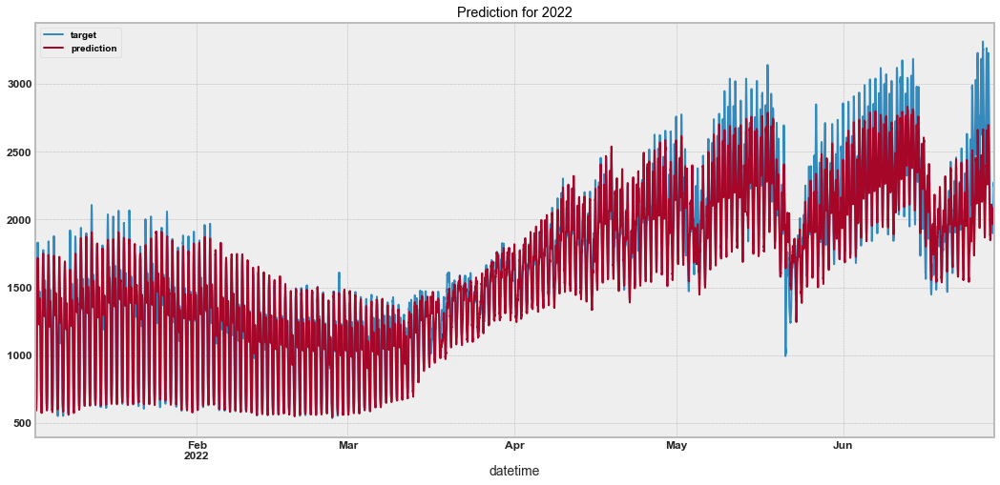

In [156]:
plt.figure(figsize=(16,8))
result.set_index('datetime').plot()
plt.title("Prediction for 2022")

Text(0.5, 1.0, 'Prediction for month of January 2022')

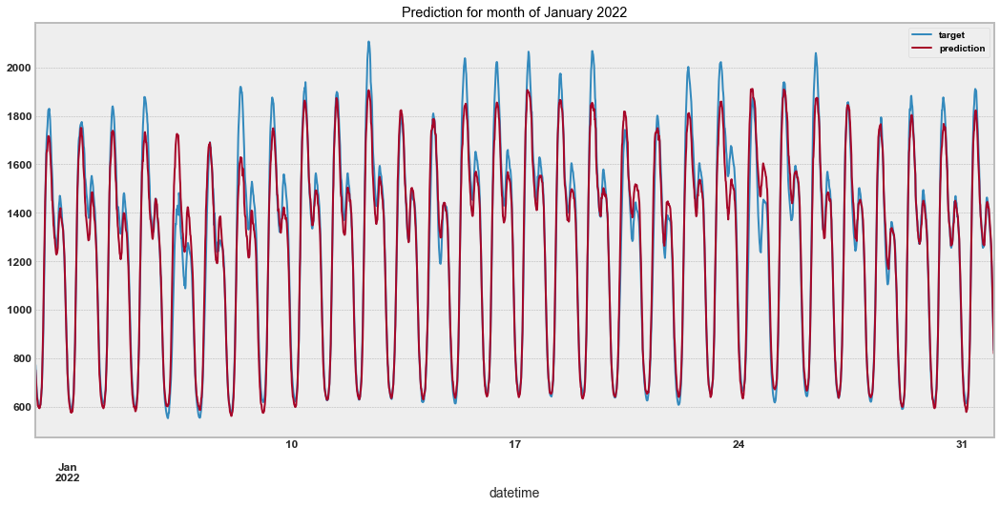

In [157]:
mask = (result.datetime<'2022-02-01 00:00:00')
result.loc[mask,:].set_index('datetime').plot()
plt.title("Prediction for month of January 2022")

Text(0.5, 1.0, 'Prediction for month of June 2022')

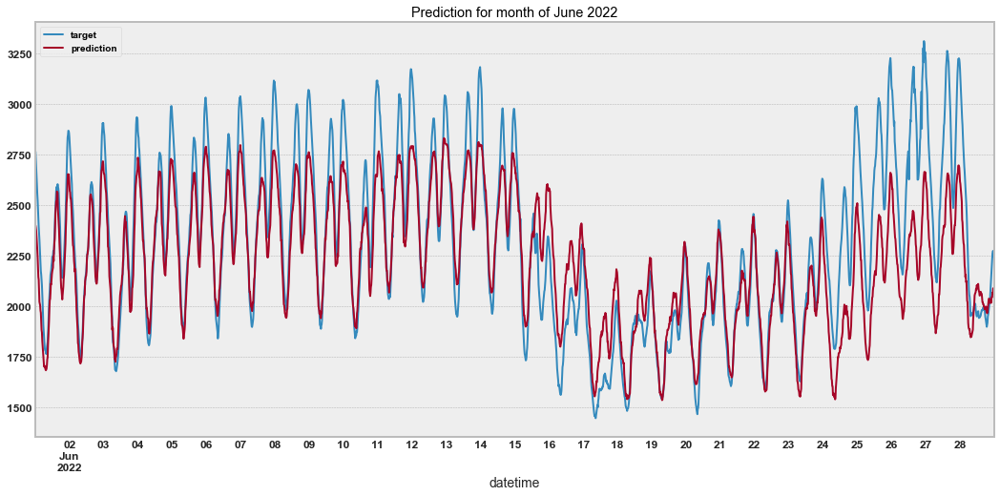

In [158]:
mask = (result.datetime>'2022-06-01 00:00:00')
result.loc[mask,:].set_index('datetime').plot()
plt.title("Prediction for month of June 2022")

## Final Model

In [237]:
validation_cutoff = '2022-06-01' # Validation Cut Off
X = data_for_training.drop('target',1).copy()
y = data_for_training[['datetime','target']].copy()
X_train = X[X['datetime'] < validation_cutoff+ ' 00:00:00'][best_features].copy()
y_train = y[y['datetime'] < validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
X_valid = X[X['datetime']>= validation_cutoff+ ' 00:00:00'][best_features].copy()
y_valid = y[y['datetime']>= validation_cutoff+ ' 00:00:00'].iloc[:,1:].copy()
print(f'X Train: {X_train.shape}')
print(f'X Validation: {X_valid.shape}')
print(f'X Train: {y_train.shape}')
print(f'X Validation: {y_valid.shape}')

X Train: (237506, 22)
X Validation: (2688, 22)
X Train: (237506, 1)
X Validation: (2688, 1)


In [241]:
model = xgb.XGBRegressor(n_estimators=10000,objective='reg:squarederror',**param)
model.fit(X_train[best_features],y_train,eval_set=[(X_valid[best_features],y_valid)],eval_metric='rmse',early_stopping_rounds=20,verbose=100)

[0]	validation_0-rmse:2261.67847
[100]	validation_0-rmse:226.93407
[200]	validation_0-rmse:190.26737
[300]	validation_0-rmse:184.40068
[400]	validation_0-rmse:181.72353
[500]	validation_0-rmse:180.15964
[600]	validation_0-rmse:179.23392
[700]	validation_0-rmse:178.23572
[708]	validation_0-rmse:178.23248


XGBRegressor(alpha=75, base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.24708338769558064,
             gamma=1.1587611214591312e-08, gpu_id=-1, grow_policy='lossguide',
             importance_type='gain', interaction_constraints='', lambda=75,
             learning_rate=0.04330637646827163, max_delta_step=0, max_depth=13,
             max_leaves=520, min_child_weight=3, missing=nan,
             monotone_constraints='()', n_estimators=10000, n_jobs=8,
             num_parallel_tree=1, random_state=0, reg_alpha=75, reg_lambda=75,
             scale_pos_weight=1, subsample=0.29386103484573106,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [242]:
# Making predictions with the tuned model
pred_train = model.predict(X_train[best_features])
pred_valid = model.predict(X_valid[best_features])
# Evaluate model accuracy 
from sklearn.metrics import mean_squared_error
print(f"Train MSE: {mean_squared_error(y_train['target'],pred_train)}")
print(f"Train RMSE: {np.sqrt(mean_squared_error(y_train['target'],pred_train))}")
print(f"valid MSE: {mean_squared_error(y_valid['target'],pred_valid)}")
print(f"valid RMSE: {np.sqrt(mean_squared_error(y_valid['target'],pred_valid))}")

Train MSE: 1794.6130419342742
Train RMSE: 42.362873390910046
valid MSE: 31733.30903132681
valid RMSE: 178.13845466750521


In [243]:
# Saving the final model
import pickle
pickle.dump(model, open(f'./xgb_2dayahead.pkl', 'wb'))

In [244]:
result = y[y['datetime'] >= validation_cutoff + ' 00:00:00'].copy()
result['prediction'] = pred_valid
result.head()

,datetime,target,prediction
237506,2022-06-01 00:00:00,2802.0,2668.875977
237507,2022-06-01 00:15:00,2765.0,2611.177246
237508,2022-06-01 00:30:00,2723.0,2579.752197
237509,2022-06-01 00:45:00,2690.0,2492.521729
237510,2022-06-01 01:00:00,2648.0,2440.363525


In [245]:
result['mse'] = (result['target']-result['prediction'])**2
result['rmse'] = result['mse'].apply(lambda x: np.sqrt(x))
result.head()

,datetime,target,prediction,mse,rmse
237506,2022-06-01 00:00:00,2802.0,2668.875977,17722.005616,133.124023
237507,2022-06-01 00:15:00,2765.0,2611.177246,23661.439619,153.822754
237508,2022-06-01 00:30:00,2723.0,2579.752197,20519.932988,143.247803
237509,2022-06-01 00:45:00,2690.0,2492.521729,38997.667708,197.478271
237510,2022-06-01 01:00:00,2648.0,2440.363525,43112.905588,207.636475


In [246]:
result =  result.reset_index()
result['date'] = result['datetime'].dt.date 
result.head()

,index,datetime,target,prediction,mse,rmse,date
0,237506,2022-06-01 00:00:00,2802.0,2668.875977,17722.005616,133.124023,2022-06-01
1,237507,2022-06-01 00:15:00,2765.0,2611.177246,23661.439619,153.822754,2022-06-01
2,237508,2022-06-01 00:30:00,2723.0,2579.752197,20519.932988,143.247803,2022-06-01
3,237509,2022-06-01 00:45:00,2690.0,2492.521729,38997.667708,197.478271,2022-06-01
4,237510,2022-06-01 01:00:00,2648.0,2440.363525,43112.905588,207.636475,2022-06-01


In [247]:
result.groupby(['date'])[['mse','rmse']].mean()

,mse,rmse
date,,
2022-06-01,11489.491749,79.438312
2022-06-02,1812.667089,33.743514
2022-06-03,4634.461707,55.989064
2022-06-04,1742.164265,35.885205
2022-06-05,4291.825447,53.622014
2022-06-06,2959.346054,46.393717
2022-06-07,4696.570246,59.410335
2022-06-08,7377.103732,77.823826
2022-06-09,2881.387271,42.773565


In [248]:
result.describe().T

,count,mean,std,min,25%,50%,75%,max
index,2688.0,238849.500000,776.103086,237506.000000,238177.750000,238849.500000,239521.250000,240193.000000
target,2688.0,2313.245443,419.216611,1447.000000,1978.015000,2279.220000,2632.442500,3311.000000
prediction,2688.0,2304.178467,357.032196,1551.847900,2026.045868,2269.295532,2573.966980,3066.428955
mse,2688.0,31733.309031,59420.666381,0.001448,1150.479801,5500.444135,28568.509824,379959.373860
rmse,2688.0,123.668042,128.240565,0.038057,33.918723,74.164978,169.022217,616.408447


Text(0.5, 1.0, 'Prediction for Validation')

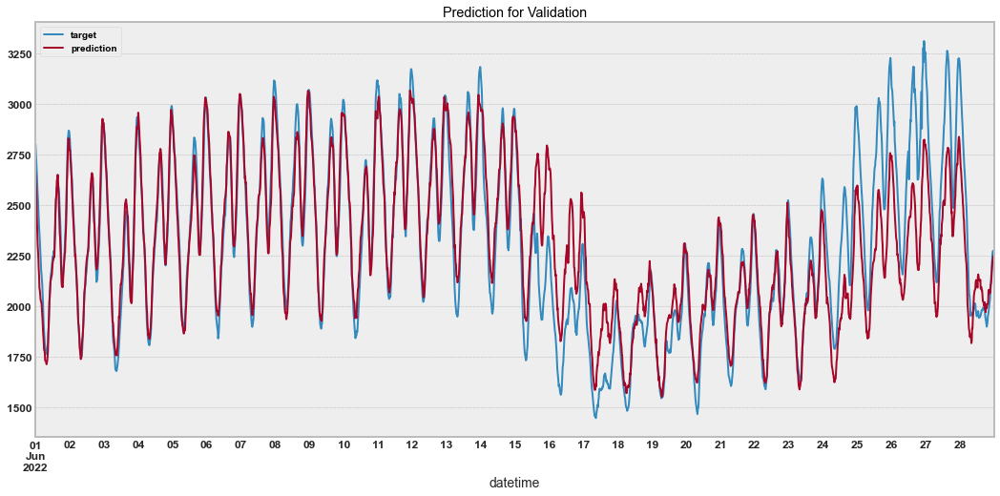

In [249]:
result.set_index('datetime')[['target','prediction']].plot()
plt.title("Prediction for Validation")

* Looks like XGB is performing better than LGB